# The TESS full-frame images lightcurve of nova PGIR22akgylf extracted using LightKurve package

The eruption of PGIR22akgylf was happening during the TESS Sector 55 and we start with the analysis of the eruption lightcurve. After extracting the full sector lightcurve we analyze separately the first and the second halves of Sector 55: the nova is faint during the first half of the sector and is bright during the second half.

The same analysis is then applied to the pre-eruption and post-eruption TESS sectors covering the nova position to reveal that these sectors contain no useful data as the nova is too faint for TESS outside Sector 55.

We then produce Sector 55 lightcurves for two check stars.

For each source we also extract and analyze the associated off-source (background-only) lightcurve. The Sector 55 background lightcurves are affected by a 0.333 day modulation found consistently for the source and check stars. However, this modulaiton is not detectable in the background-subtracted lightcurves of the nova and check stars.

In [1]:
# Import the packages needed for the analysis
import os
import lightkurve as lk
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

/home/kirill/.conda/envs/lk/lib/python3.10/site-packages/lightkurve/config/__init__.py:119: UserWarning: The default Lightkurve cache directory, used by download(), etc., has been moved to /home/kirill/.lightkurve/cache. Please move all the files in the legacy directory /home/kirill/.lightkurve-cache to the new location and remove the legacy directory. Refer to https://docs.lightkurve.org/reference/config.html#default-cache-directory-migration for more information.
  warnings.warn(


In [2]:
# Reference time for nova eruption (add this near the top after imports)
t_0 = 2459807.6900  # Reference JD for nova eruption

# Monkey patch the LightCurve.plot method to use reference time
import lightkurve as lk
import matplotlib.pyplot as plt

# Store the original plot method
_original_plot = lk.LightCurve.plot

def plot_with_reference_time(self, *args, **kwargs):
    """Modified plot method that uses reference time t_0"""
    # Create a copy to avoid modifying the original
    lc_copy = self.copy()
    
    # Convert time to days relative to t_0 (only if time is in JD format)
    if hasattr(lc_copy.time, 'jd'):
        time_rel = lc_copy.time.jd - t_0
        lc_copy.time = time_rel
        
        # Call the original plot method
        result = _original_plot(lc_copy, *args, **kwargs)
        
        # Set the x-axis label to show reference time
        plt.xlabel(f'JD - {t_0} (days)')
        
        return result
    else:
        # If not JD format, use original method
        return _original_plot(self, *args, **kwargs)

# Replace the plot method
lk.LightCurve.plot = plot_with_reference_time

In [3]:
def simple_detrend_and_period_search(lc, period_range=(0.05, 3.0), titleprefixstring="", detrend_method="subtraction"):
    """
    Process a LightCurve: clip outliers, detrend, and perform Lomb-Scargle period search.
    Parameters:
    lc (LightCurve): The LightCurve object to process.
    period_range (tuple): The range of periods (in days) to search for periods, default is (0.05, 3.0).
    titleprefixstring (str): A prefix string for titles in the generated plots.
    detrend_method (str): Method for detrending - "division" (default) or "subtraction"
    Returns:
    tuple: The best period detected by the Lomb-Scargle periodogram and the epoch (JD0).
    Workflow:
    1. Clip Outliers (3-sigma): Removes significant outliers from the lightcurve to clean the data.
    2. Detrend the LightCurve: Uses a 5th-degree polynomial to remove long-term trends.
       - If detrend_method is "division", uses lc.flatten() (divides by trend)
       - If detrend_method is "subtraction", manually applies Savitzky-Golay filter and subtracts trend
    3. Re-clip After Detrending: Removes outliers after detrending.
    4. Lomb-Scargle Period Analysis:
       - Converts the specified period range into frequency range.
       - Computes the Lomb-Scargle periodogram.
       - Identifies the best period (highest power).
    5. Generate Plots:
       - Display the sigma-clipped lightcurve.
       - Display the detrended lightcurve.
       - Display the sigma-clipped lightcurve after detrending.
       - Plot the Lomb-Scargle periodogram as a function of frequency, highlighting the best period.
       - Plot the phased lightcurve with phase 0 at minimum flux.
   
    """
    import numpy as np
    import matplotlib.pyplot as plt
    
    # Step 1: Clip the lightcurve at 3-sigma
    clipped_lc = lc.remove_outliers(sigma=3)
    clipped_lc.plot(lw=2, marker='.', linestyle='None')
    plt.title(f"{titleprefixstring} sigma-clipped")
    plt.show()
    
    # Step 2: Detrend the lightcurve
    if detrend_method == "division":
        # Original method: using scipy's Savitzky-Golay filter wrapped in lc.flatten() (division-based)
        detrended_lc = clipped_lc.flatten(window_length=101, polyorder=5)
        detrend_type = "detrended (division)"
    elif detrend_method == "subtraction":
        # New method: manual Savitzky-Golay filter and subtraction
        from scipy.signal import savgol_filter
        from lightkurve import LightCurve
        
        # Get the time and flux arrays
        time = clipped_lc.time.value
        flux = clipped_lc.flux.value
        
        # Compute the trend using the same parameters as in flatten()
        trend = savgol_filter(flux, window_length=101, polyorder=5)
        
        # Create a new lightcurve with the detrended flux (subtraction)
        detrended_lc = LightCurve(time=clipped_lc.time, flux=flux - trend)
        detrend_type = "detrended (subtraction)"
    else:
        raise ValueError("detrend_method must be either 'division' or 'subtraction'")
    
    # Plot the detrended lightcurve
    detrended_lc.plot(lw=2, marker='.', linestyle='None')
    plt.title(f"{titleprefixstring} sigma-clipped, {detrend_type}")
    plt.show()
    
    # Step 2.5: Clip the lightcurve again (to remove mini-flares in nova V606 Vul lightcurve)
    detrended_lc = detrended_lc.remove_outliers(sigma=3)
    detrended_lc.plot(lw=2, marker='.', linestyle='None')
    plt.title(f"{titleprefixstring} sigma-clipped, {detrend_type}, sigma-clipped")
    plt.show()    
    
    # Step 3: Perform Lomb-Scargle periodogram analysis using LightKurve's built-in functionality
    min_period, max_period = period_range
    min_frequency = 1 / max_period
    max_frequency = 1 / min_period
    
    # Create the periodogram
    periodogram = detrended_lc.to_periodogram(method="lombscargle", 
                                             minimum_frequency=min_frequency, 
                                             maximum_frequency=max_frequency)
    
    # Find and print the best period
    best_period = periodogram.period_at_max_power
    print(f"The best period is: {best_period:.4f} days")
    
    # Step 4: Plot the periodogram as a function of frequency
    plt.figure(figsize=(10, 5))
    plt.plot(periodogram.frequency.value, periodogram.power, label="Lomb-Scargle Power")
    plt.axvline(x=1/best_period.value, color="red", linestyle="--", label=f"Best Period = {best_period:.4f} days")
    plt.xlabel("Frequency (1/day)")
    plt.ylabel("Power")
    plt.title(f"{titleprefixstring} Lomb-Scargle Periodogram")
    plt.legend()
    plt.grid()
    plt.show()
    
    # Step 5: Create phased lightcurve plot with sine wave fit to determine phase 0
    from scipy.optimize import curve_fit
    
    time_values = detrended_lc.time.value
    flux_values = detrended_lc.flux.value
    
    # Calculate initial phases
    phases = (time_values - time_values[0]) / best_period.value % 1
    
    # Define sine wave function for fitting
    def sine_wave(phase, amplitude, phase_offset, vertical_offset):
        return amplitude * np.sin(2 * np.pi * (phase - phase_offset)) + vertical_offset
    
    # Initial guess for parameters
    amplitude_guess = (np.max(flux_values) - np.min(flux_values)) / 2
    vertical_offset_guess = np.mean(flux_values)
    phase_offset_guess = 0
    
    # Fit sine wave to the data
    try:
        popt, pcov = curve_fit(sine_wave, phases, flux_values, 
                              p0=[amplitude_guess, phase_offset_guess, vertical_offset_guess],
                              maxfev=5000)
        amplitude_fit, phase_offset_fit, vertical_offset_fit = popt
        
        # For sin(2π(φ - φ₀)), minimum occurs when 2π(φ - φ₀) = -π/2 + 2πn
        # So φ_min = φ₀ - 1/4 (taking n=0 and adjusting to [0,1))
        phase_of_minimum = (phase_offset_fit - 0.25) % 1
        
        # If amplitude is negative, the function is inverted (max becomes min)
        if amplitude_fit < 0:
            amplitude_fit = -amplitude_fit
            phase_of_minimum = (phase_of_minimum + 0.5) % 1  # Shift by half period
        
        print(f"Fitted sine wave parameters:")
        print(f"  Amplitude: {amplitude_fit:.6f}")
        print(f"  Phase offset: {phase_offset_fit:.6f}")
        print(f"  Vertical offset: {vertical_offset_fit:.6f}")
        print(f"  Phase of minimum: {phase_of_minimum:.6f}")
        
        # Adjust phases so fitted minimum occurs at phase 0
        adjusted_phases = (phases - phase_of_minimum) % 1
        
        # Calculate JD0 (epoch of minimum)
        jd0 = 2457000 + time_values[0] + phase_of_minimum * best_period.value
        
        # Update the phase offset for plotting the fitted curve
        adjusted_phase_offset = (phase_offset_fit - phase_of_minimum) % 1
        
    except Exception as e:
        print(f"Sine wave fitting failed: {e}")
        print("Using simple minimum finding instead...")
        # Fallback to simple minimum finding
        min_flux_idx = np.argmin(flux_values)
        phase_of_minimum = phases[min_flux_idx]
        adjusted_phases = (phases - phase_of_minimum) % 1
        
        # Calculate JD0 using simple minimum
        jd0 = 2457000 + time_values[min_flux_idx]
        
        # Set dummy values for plotting
        amplitude_fit, adjusted_phase_offset, vertical_offset_fit = amplitude_guess, 0, vertical_offset_guess
    
    # Print light elements
    print(f"Light Elements:")
    print(f"  Period: {best_period:.6f} days")
    print(f"  JD0 (epoch of minimum): {jd0:.6f}")
    
    # Create the phased lightcurve plot from -0.5 to 1.5
    plt.figure(figsize=(12, 7))
    
    # Create extended phase arrays for plotting from -0.5 to 1.5
    extended_phases = []
    extended_flux = []
    
    for phase_shift in [-1, 0, 1]:
        extended_phases.extend(adjusted_phases + phase_shift)
        extended_flux.extend(flux_values)
    
    extended_phases = np.array(extended_phases)
    extended_flux = np.array(extended_flux)
    
    # Filter to plot range -0.5 to 1.5
    plot_mask = (extended_phases >= -0.5) & (extended_phases <= 1.5)
    plot_phases = extended_phases[plot_mask]
    plot_flux = extended_flux[plot_mask]
    
    # Plot the data points
    plt.scatter(plot_phases, plot_flux, alpha=0.6, s=20, color='tab:blue', label='')
    
    # Create binned version for cleaner visualization
    phase_bins = np.linspace(-0.5, 1.5, 20)
    binned_flux = []
    binned_flux_err = []
    bin_centers = []
    
    for i in range(len(phase_bins)-1):
        mask = (plot_phases >= phase_bins[i]) & (plot_phases < phase_bins[i+1])
        if np.sum(mask) > 0:
            binned_flux.append(np.mean(plot_flux[mask]))
            binned_flux_err.append(np.std(plot_flux[mask]) / np.sqrt(np.sum(mask)))
            bin_centers.append((phase_bins[i] + phase_bins[i+1]) / 2)
    
    bin_centers = np.array(bin_centers)
    binned_flux = np.array(binned_flux)
    binned_flux_err = np.array(binned_flux_err)
    
    # Plot binned data
    if len(bin_centers) > 0:
        plt.errorbar(bin_centers, binned_flux, yerr=binned_flux_err, 
                    color='tab:red', marker='o', markersize=4, linewidth=2, 
                    label='Binned', capsize=3, linestyle='None')
    
    # Plot the fitted sine wave
    phase_fine = np.linspace(-0.5, 1.5, 500)
    try:
        # Plot the fitted curve in the adjusted phase coordinate system
        # The sine wave should have its minimum at phase 0 in the adjusted coordinates
        fitted_curve = amplitude_fit * np.sin(2 * np.pi * (phase_fine - 0.25)) + vertical_offset_fit
        plt.plot(phase_fine, fitted_curve, 'g-', linewidth=2, label='Fitted sine wave')
    except:
        pass
    
    # Add vertical lines at key phases
    plt.axvline(x=0, color='green', linestyle='--', alpha=0.7, label='Phase 0')
    plt.axvline(x=-1, color='green', linestyle='--', alpha=0.5)
    plt.axvline(x=1, color='green', linestyle='--', alpha=0.5)
    
    plt.xlabel('Phase')
    plt.ylabel('Flux')
    plt.title(f'{titleprefixstring} Phased Lightcurve (Period = {best_period:.4f} days, JD0 = {jd0:.6f})')
    plt.xlim(-0.5, 1.5)
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()
    
    return best_period.value, jd0

In [5]:
def convert_flux_to_mag(time, flux, flux_err):
    """
    Convert flux to magnitudes.

    Parameters:
    time (array): Time values.
    flux (array): Flux values.
    flux_err (array): Flux error values.

    Returns:
    array: Time, magnitude, magnitude error.
    """
    flux = flux.value  # Remove units for log10 calculation
    flux_err = flux_err.value  # Remove units for log10 calculation
    mag = 20.44 - 2.5 * np.log10(flux)  # Convert flux to magnitude
    mag_err = -2.5 * np.log10((flux - flux_err) / flux)  # Calculate magnitude error
    #time_jd = 2457000.0 + time.jd  # Convert TESS JD to regular JD
    time_jd = time.jd
    return time_jd, mag, mag_err  # Return time, magnitude, and magnitude error

def extract_tess_lightcurve(tpf_cutout, target_source_name, notebook_name="PGIR22akgylf_lk_square_aperture", cadence_index=0, tjd_range=None):
    """
    Process TESS lightcurve data from a TPF cutout and save various plots and CSV files in a dedicated directory.

    Parameters:
    tpf_cutout: TargetPixelFile
        The TPF cutout object containing the data.
    target_source_name: str
        The name of the target source.
    notebook_name: str
        The name of the Jupyter notebook (used to name the output directory).
    cadence_index: int
        Index of the cadence to display (default: 0, i.e., the first cadence).
    tjd_range: tuple of float or None
        Optional tuple of (tjd_min, tjd_max) to filter the lightcurve data.
        If provided, only data points within this TJD range will be included in the analysis.
    """
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patheffects as path_effects
    from astropy.coordinates import SkyCoord
    import astropy.units as u
    from matplotlib import patches
    
    # Create output directory
    output_dir = notebook_name.lower().replace(" ", "_")
    os.makedirs(output_dir, exist_ok=True)

    # Define and plot the source aperture mask
    target_source_aperture_mask = np.zeros((tpf_cutout.shape[1:]), dtype='bool')
    target_source_aperture_mask[5:8, 5:8] = True  # custom mask coordinates
    custom_background_exclusion_mask = np.zeros((tpf_cutout.shape[1:]), dtype='bool')
    custom_background_exclusion_mask[4:9, 4:9] = True  # extended target region
    custom_background_exclusion_mask[2:5, 6:9] = True # ATO J300.1356+34.8776 region
    # Ensure all True values in target_source_aperture_mask are also True in custom_background_exclusion_mask
    custom_background_exclusion_mask = custom_background_exclusion_mask | target_source_aperture_mask

    # Define file names
    target_source_name_lowercase_for_filename = target_source_name.lower().replace(" ", "_")
    sector_name_for_filename = f"Sector{tpf_cutout.sector}"
    
    # Add TJD range to filename if specified
    if tjd_range is not None:
        # Round to integer days (no decimal points)
        tjd_min_int = int(round(tjd_range[0]))
        tjd_max_int = int(round(tjd_range[1]))
        tjd_suffix = f"_TJD{tjd_min_int}-{tjd_max_int}"
    else:
        tjd_suffix = "_fullTJDrange"
    
    # Define the equatorial coordinates and labels for the marks
    source_coords = [
        ('PGIR22akgylf', SkyCoord('20:00:29.26 +34:53:09.1', unit=(u.hourangle, u.deg))),
        ('TYC 2678-1207-1', SkyCoord('20:00:30.1586813 +34:51:34.456302', unit=(u.hourangle, u.deg))),
        ('ATO J300.1356+34.8776', SkyCoord('20:00:32.5503041 +34:52:39.529398', unit=(u.hourangle, u.deg)))
    ]
    
    def add_markers_to_plot(ax):
        """Add markers for the three sources to the plot."""
        markers = ['*', 's', 'D']  # star, square, diamond
        colors = ['red', 'blue', 'green']
        
        for i, (name, skycoord) in enumerate(source_coords):
            # Get the local pixel coordinates within the cutout
            local_x, local_y = tpf_cutout.wcs.world_to_pixel(skycoord)
            
            # Convert to original CCD coordinates by adding the TPF origin
            abs_x = tpf_cutout.column + local_x
            abs_y = tpf_cutout.row + local_y
            
            # Plot the marker using ABSOLUTE coordinates
            ax.plot(abs_x, abs_y, marker=markers[i], markersize=10, color=colors[i])
            
            # Add text label 0.5 pixel above the marker with bold white text
            # No frame around the text, white color with black outline for visibility
            text = ax.text(abs_x, abs_y + 0.5, name, fontsize=9, color='white', fontweight='bold',
                   ha='center', va='bottom')
            text.set_path_effects([path_effects.withStroke(linewidth=2, foreground='black')])
    
    # Get the cadence number for display in the title
    if cadence_index < len(tpf_cutout.cadenceno):
        current_cadence = tpf_cutout.cadenceno[cadence_index]
    else:
        print(f"Warning: Cadence index {cadence_index} is out of bounds. Using first cadence instead.")
        cadence_index = 0
        current_cadence = tpf_cutout.cadenceno[0]
    
    # Print time of the cadance to be displayed
    current_time = tpf_cutout.time[cadence_index]
    print(f"Cadence {current_cadence} was obtained at time: {current_time.value:.6f} TJD ({current_time.isot})")
    
    # Basic cutout with marks for the specified cadence
    fig, ax = plt.subplots(figsize=(12, 8))
    tpf_cutout.plot(ax=ax, frame=cadence_index)  # Specify which frame to display
    add_markers_to_plot(ax)
    plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}, Cadence {current_cadence}, basic cutout")
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_cadence{current_cadence}_basic_cutout_plot.png"), format="png", dpi=300)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_cadence{current_cadence}_basic_cutout_plot.eps"), format="eps")
    plt.show()
    plt.close()
    
    # Combined target and background aperture plot for the specified cadence
    fig, ax = plt.subplots(figsize=(12, 8))
    # First plot the raw image for the specified cadence
    tpf_cutout.plot(ax=ax, frame=cadence_index)
    
    # Calculate the background mask
    background_mask = ~tpf_cutout.create_threshold_mask(threshold=0.001, reference_pixel=None) * ~custom_background_exclusion_mask
    
    # Add the background aperture mask with diagonal hatching
    for i in range(tpf_cutout.shape[1]):
        for j in range(tpf_cutout.shape[2]):
            if background_mask[i, j]:
                # Position Rectangle at the center of the pixel
                # Use (j+tpf_cutout.column-0.5, i+tpf_cutout.row-0.5) for the bottom-left corner
                # to center the 1x1 Rectangle on the pixel
                ax.add_patch(patches.Rectangle((j+tpf_cutout.column-0.5, i+tpf_cutout.row-0.5),
                                              1, 1, fill=False, edgecolor='white',
                                              hatch='//', linewidth=1))
    
    # Add the source aperture mask with red cross-hatching
    for i in range(tpf_cutout.shape[1]):
        for j in range(tpf_cutout.shape[2]):
            if target_source_aperture_mask[i, j]:
                # Position Rectangle at the center of the pixel
                ax.add_patch(patches.Rectangle((j+tpf_cutout.column-0.5, i+tpf_cutout.row-0.5),
                                              1, 1, fill=False, edgecolor='red',
                                              hatch='\\\\', linewidth=1))
    
    # Add source markers
    add_markers_to_plot(ax)
    
    # Add a legend for the apertures with hatched patches
    #from matplotlib.patches import Patch
    #
    # Create legend patches with the same hatching
    #source_patch = patches.Patch(fill=False, edgecolor='red', hatch='\\\\', label='Source Aperture')
    #background_patch = patches.Patch(fill=False, edgecolor='white', hatch='//', label='Background Aperture')
    #
    #ax.legend(handles=[source_patch, background_patch], loc='upper right')
    
    plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}, Cadence {current_cadence}, source and background apertures")
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_cadence{current_cadence}_combined_apertures_plot.png"), format="png", dpi=300)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_cadence{current_cadence}_combined_apertures_plot.eps"), format="eps")
    plt.show()
    plt.close()

    # Target aperture for the specified cadence
    fig, ax = plt.subplots(figsize=(12, 8))
    tpf_cutout.plot(ax=ax, aperture_mask=target_source_aperture_mask, frame=cadence_index)
    add_markers_to_plot(ax)
    plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}, Cadence {current_cadence}, source aperture")
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_cadence{current_cadence}_src_aperture_plot.png"), format="png", dpi=300)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_cadence{current_cadence}_src_aperture_plot.eps"), format="eps")
    plt.show()
    plt.close()

    # Background aperture for the specified cadence
    background_mask = ~tpf_cutout.create_threshold_mask(threshold=0.001, reference_pixel=None) * ~custom_background_exclusion_mask
    fig, ax = plt.subplots(figsize=(12, 8))
    tpf_cutout.plot(ax=ax, aperture_mask=background_mask, mask_color='w', frame=cadence_index)
    add_markers_to_plot(ax)
    plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}, Cadence {current_cadence}, background aperture")
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_cadence{current_cadence}_bck_aperture_plot.png"), format="png", dpi=300)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_cadence{current_cadence}_bck_aperture_plot.eps"), format="eps")
    plt.show()
    plt.close()

    # Extract and save the raw source lightcurve (this doesn't change regardless of which cadence is displayed)
    uncorrected_lc = tpf_cutout.to_lightcurve(aperture_mask=target_source_aperture_mask)
    
    # Apply TJD range filter if specified
    if tjd_range is not None:
        tjd_min, tjd_max = tjd_range
        time_mask = (uncorrected_lc.time.value >= tjd_min) & (uncorrected_lc.time.value <= tjd_max)
        uncorrected_lc = uncorrected_lc[time_mask]
        print(f"Applied TJD filter: {tjd_min} to {tjd_max}")
        print(f"Number of data points after filtering: {len(uncorrected_lc)}")
        
        # Check if we have any data points left
        if len(uncorrected_lc) == 0:
            print(f"Warning: No data points found in the specified TJD range [{tjd_min}, {tjd_max}]")
            return
    
    plt.figure(figsize=(10, 6))
    uncorrected_lc.plot(lw=2, marker='.', linestyle='None')
    title_str = f"{target_source_name}, TESS Sector {tpf_cutout.sector}, raw lightcurve"
    if tjd_range is not None:
        title_str += f" (TJD {tjd_min:.1f}-{tjd_max:.1f})"
    plt.title(title_str)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_raw_plot{tjd_suffix}.png"), format="png", dpi=300)
    uncorrected_lc.to_csv(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_raw{tjd_suffix}.csv"), overwrite=True)
    plt.show()
    plt.close()

    # Extract background lightcurve
    n_target_pixels = target_source_aperture_mask.sum()
    n_background_pixels = background_mask.sum()
    background_lc_per_pixel = tpf_cutout.to_lightcurve(aperture_mask=background_mask) / n_background_pixels
    
    # Apply same TJD filter to background
    if tjd_range is not None:
        background_lc_per_pixel = background_lc_per_pixel[time_mask]
    
    background_estimate_lc = background_lc_per_pixel * n_target_pixels

    # Compute the background-subtracted lightcurve
    bkg_subtracted_lc = uncorrected_lc - background_estimate_lc.flux
    plt.figure(figsize=(10, 6))
    bkg_subtracted_lc.plot(lw=2, marker='.', linestyle='None')
    title_str = f"{target_source_name}, TESS Sector {tpf_cutout.sector}, background-subtracted lightcurve"
    if tjd_range is not None:
        title_str += f" (TJD {tjd_min:.1f}-{tjd_max:.1f})"
    plt.title(title_str)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_bcksub_plot{tjd_suffix}.png"), format="png", dpi=300)
    bkg_subtracted_lc.to_csv(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_bcksub{tjd_suffix}.csv"), overwrite=True)
    plt.show()
    plt.close()
    
    #
    # Convert the background-subtracted lightcurve to magnitudes and write to a new file
    time_jd, mag, mag_err = convert_flux_to_mag(bkg_subtracted_lc.time, 
                                                bkg_subtracted_lc.flux, 
                                                bkg_subtracted_lc.flux_err)
    best_lightcurve_mag = np.column_stack((time_jd, mag, mag_err))
    best_mag_output_filename = os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_bcksub{tjd_suffix}_mag.txt")
    np.savetxt(best_mag_output_filename, best_lightcurve_mag, delimiter=' ', fmt='%.6f %.6f %.6f')
    print(f'Writing best lightcurve (magnitudes) to file {best_mag_output_filename}')
    # Create magnitude LightCurve object for plotting
    best_lightcurve_mag_LightCurve = lk.LightCurve(
        time=time_jd,
        flux=mag * u.mag,  # Specify magnitude units,
        flux_err=mag_err * u.mag  # Specify magnitude units
    )
    print(f'Plotting magnitude lightcurve for {target_source_name}:')
    print(f'  - Data points: {len(time_jd)}')
    print(f'  - Time range: {time_jd.min():.3f} to {time_jd.max():.3f} JD')
    print(f'  - Magnitude range: {mag.min():.3f} to {mag.max():.3f} mag')
    plt.figure(figsize=(10, 6))
    best_lightcurve_mag_LightCurve.plot(lw=2, marker='.', linestyle='None')
    plt.gca().invert_yaxis()  # Invert the y-axis
    plt.title(title_str)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_bcksub{tjd_suffix}_mag.png"), dpi=300)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_bcksub{tjd_suffix}_mag.eps"), format="eps")
    plt.show()
    plt.close()
    #

    # Plot and save the background lightcurve
    plt.figure(figsize=(10, 6))
    background_estimate_lc.plot(lw=2, marker='.', linestyle='None')
    title_str = f"{target_source_name}, TESS Sector {tpf_cutout.sector}, background lightcurve"
    if tjd_range is not None:
        title_str += f" (TJD {tjd_min:.1f}-{tjd_max:.1f})"
    plt.title(title_str)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_bck_plot{tjd_suffix}.png"), format="png", dpi=300)
    background_estimate_lc.to_csv(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_bck{tjd_suffix}.csv"), overwrite=True)
    plt.show()
    plt.close()

    # Plot raw, background-subtracted, and background-only lightcurves together
    plt.figure(figsize=(10, 6))
    ax = uncorrected_lc.plot(label="Raw", lw=2, marker='.', linestyle='None')
    bkg_subtracted_lc.plot(ax=ax, label="Background-subtracted", lw=2, marker='.', linestyle='None')
    background_estimate_lc.plot(ax=ax, label="Background", lw=2, marker='.', linestyle='None')
    title_str = f"{target_source_name}, TESS Sector {tpf_cutout.sector}"
    if tjd_range is not None:
        title_str += f" (TJD {tjd_min:.1f}-{tjd_max:.1f})"
    plt.title(title_str)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_raw_backsub_bck_plot{tjd_suffix}.png"), dpi=300)
    plt.savefig(os.path.join(output_dir, f"{target_source_name_lowercase_for_filename}_{sector_name_for_filename}_lk_raw_backsub_bck_plot{tjd_suffix}.eps"), format="eps")
    plt.show()
    plt.close()

#    # Run the simplified period analysis
#    print("The simplified period analysis for the background-subtracted source lightcurve")
#    simple_detrend_and_period_search(bkg_subtracted_lc, period_range=(0.05, 3.0), titleprefixstring=f"{target_source_name}, TESS Sector {tpf_cutout.sector} bkg.-sub.:")
#    print("The simplified period analysis for the background lightcurve")
#    simple_detrend_and_period_search(background_estimate_lc, period_range=(0.05, 3.0), titleprefixstring=f"{target_source_name}, TESS Sector {tpf_cutout.sector} background:")
    # Run the simplified period analysis
    print("The simplified period analysis for the background-subtracted source lightcurve")
    period_source, jd0_source = simple_detrend_and_period_search(bkg_subtracted_lc, period_range=(0.05, 3.0), titleprefixstring=f"{target_source_name}, TESS Sector {tpf_cutout.sector} bkg.-sub.:")
    print("The simplified period analysis for the background lightcurve")
    period_background, jd0_background = simple_detrend_and_period_search(background_estimate_lc, period_range=(0.05, 3.0), titleprefixstring=f"{target_source_name}, TESS Sector {tpf_cutout.sector} background:")

## PGIR22akgylf - full Sector 55 lightcurve

The target is PGIR22akgylf

In [6]:
# Set target source name and position, search for TESS data
target_source_name="PGIR22akgylf"
search_lc = lk.search_tesscut("20:00:29.26 +34:53:09.1")
search_lc

#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 14,2019,TESScut,1426,20:00:29.26 +34:53:09.1,0.0
1,TESS Sector 15,2019,TESScut,1426,20:00:29.26 +34:53:09.1,0.0
2,TESS Sector 54,2022,TESScut,475,20:00:29.26 +34:53:09.1,0.0
3,TESS Sector 55,2022,TESScut,475,20:00:29.26 +34:53:09.1,0.0
4,TESS Sector 74,2024,TESScut,158,20:00:29.26 +34:53:09.1,0.0
5,TESS Sector 75,2024,TESScut,158,20:00:29.26 +34:53:09.1,0.0
6,TESS Sector 81,2024,TESScut,158,20:00:29.26 +34:53:09.1,0.0
7,TESS Sector 82,2024,TESScut,158,20:00:29.26 +34:53:09.1,0.0


### Sector 55 - the eruption


Cadence 3750 was obtained at time: 2824.124137 TJD (2022-09-01T14:58:45.424)


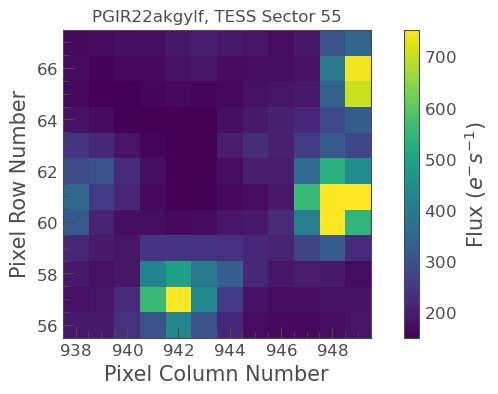

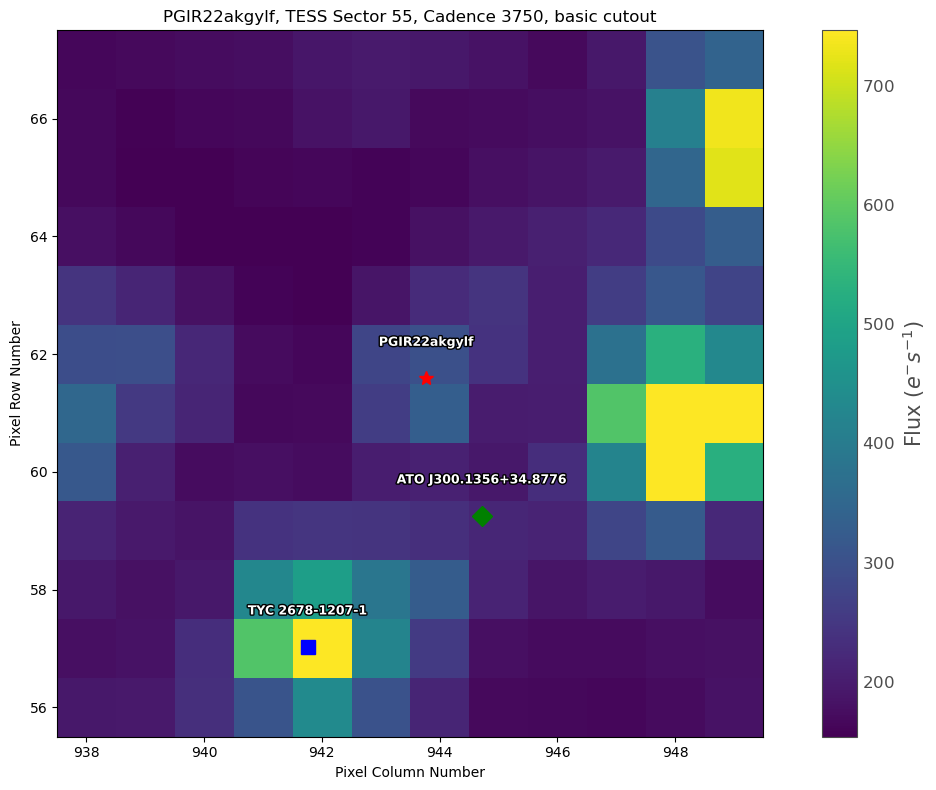

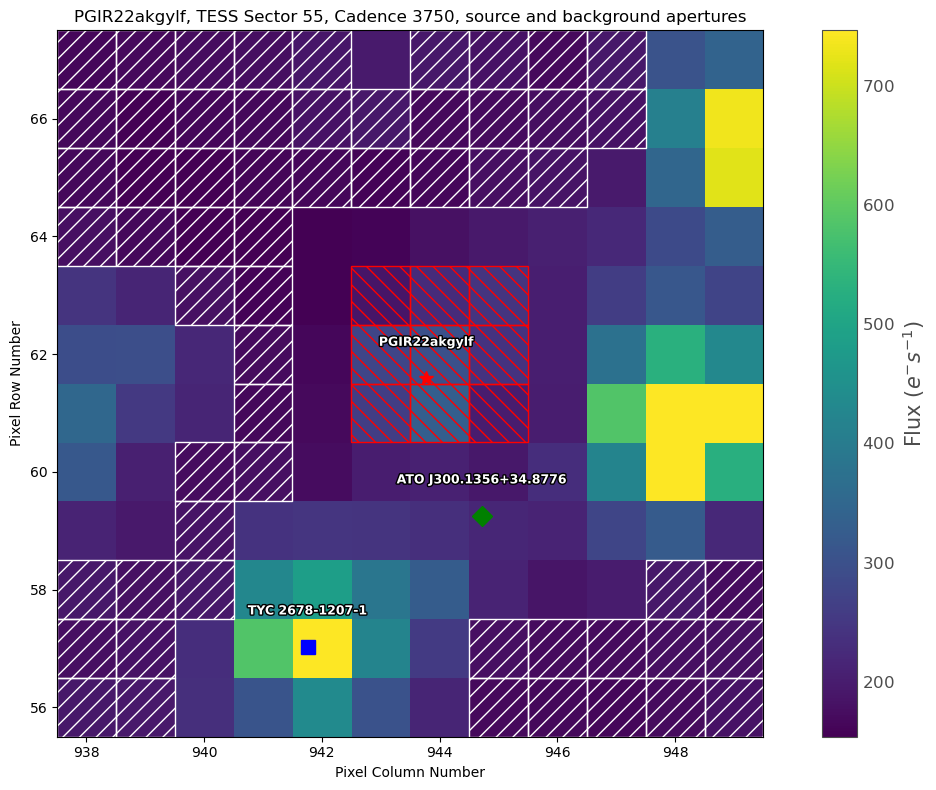

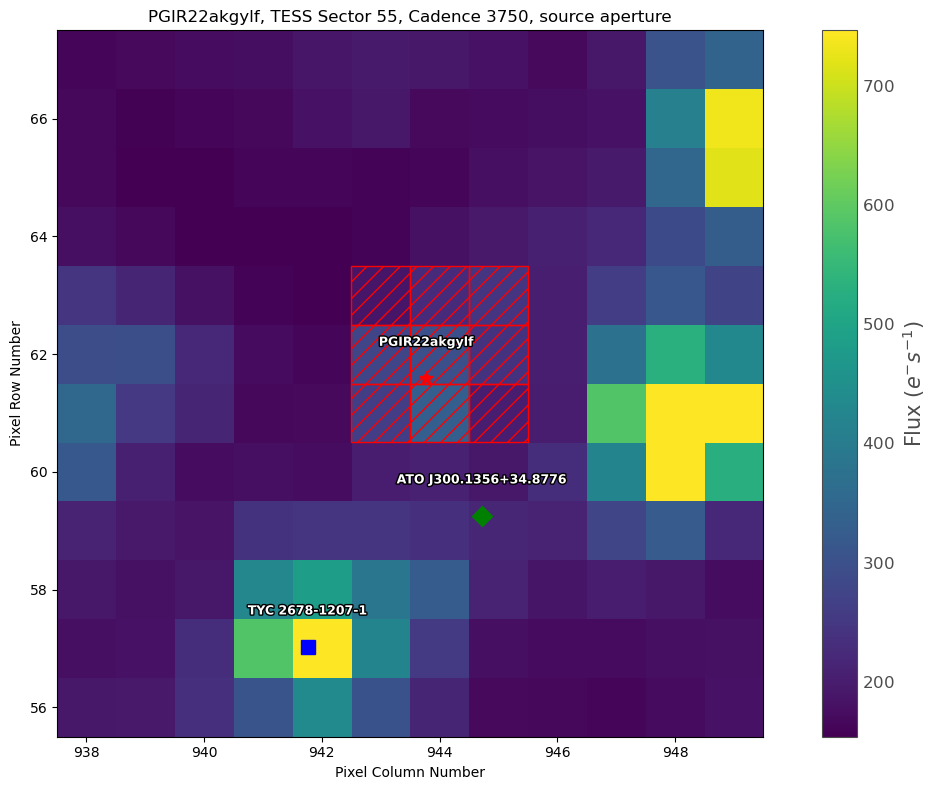

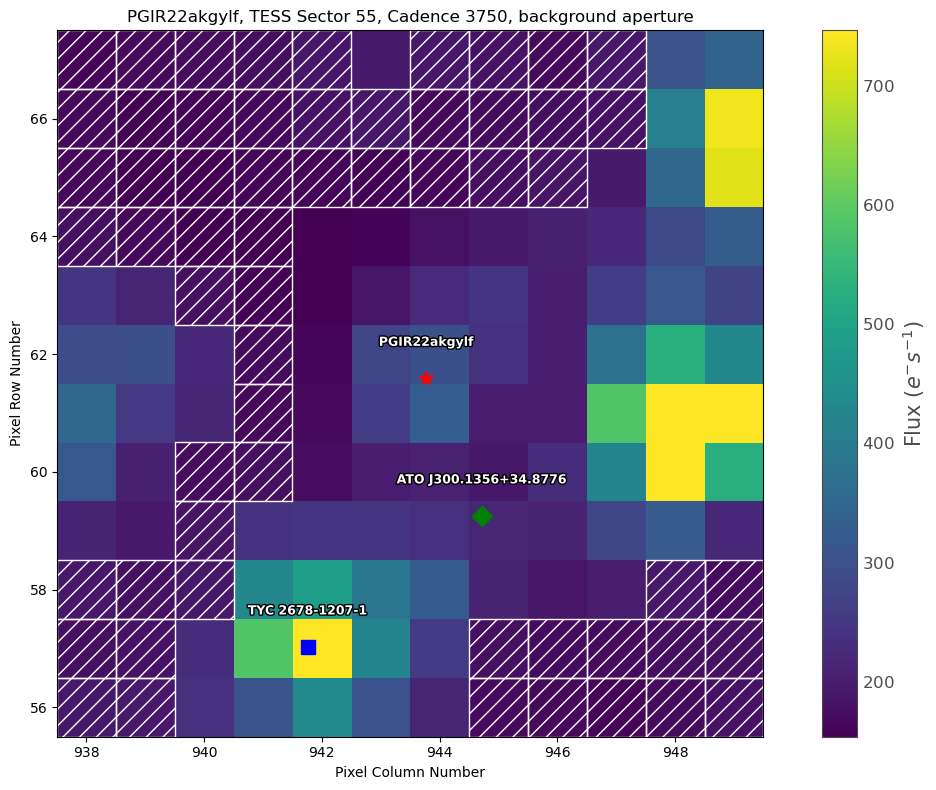

<Figure size 1000x600 with 0 Axes>

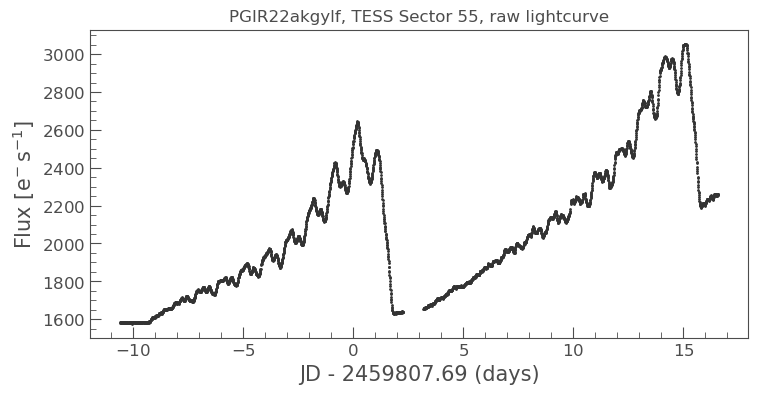

<Figure size 1000x600 with 0 Axes>

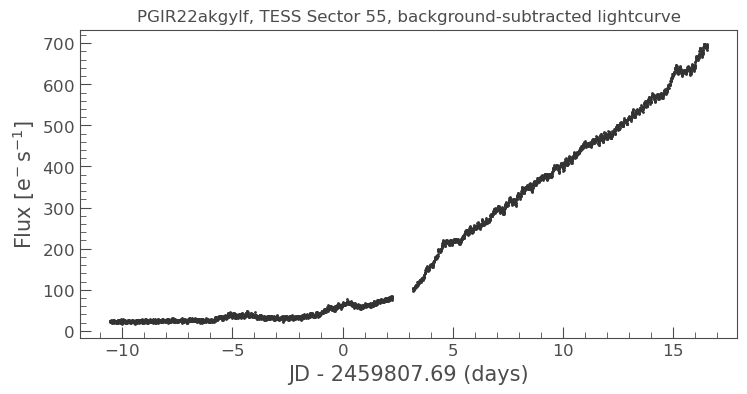

Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/pgir22akgylf_Sector55_lk_bcksub_fullTJDrange_mag.txt
Plotting magnitude lightcurve for PGIR22akgylf:
  - Data points: 3771
  - Time range: 2459797.111 to 2459824.263 JD
  - Magnitude range: 13.329 to 17.320 mag


<Figure size 1000x600 with 0 Axes>

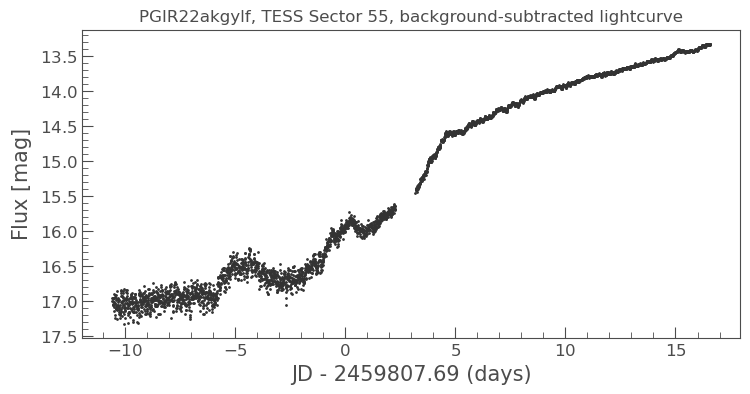

<Figure size 1000x600 with 0 Axes>

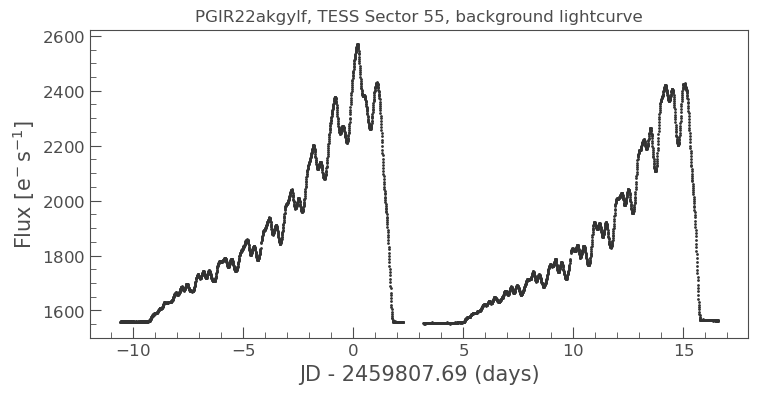

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

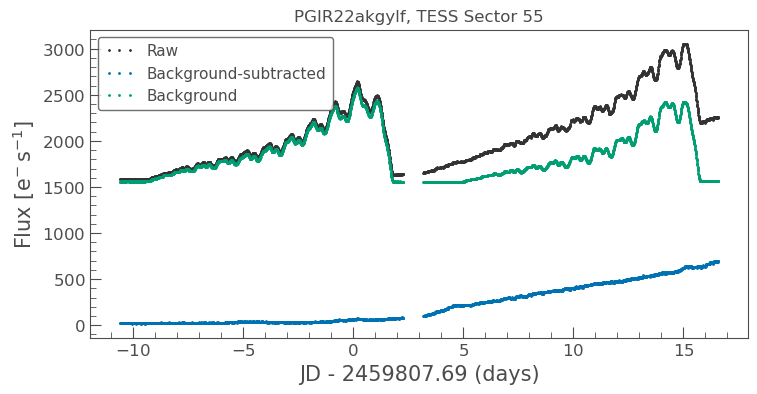

The simplified period analysis for the background-subtracted source lightcurve


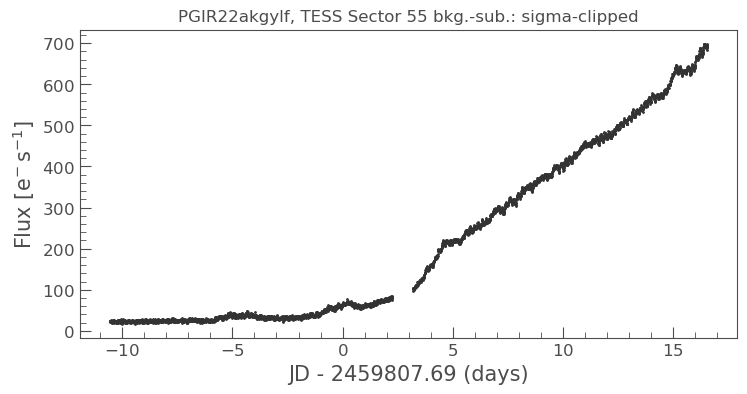

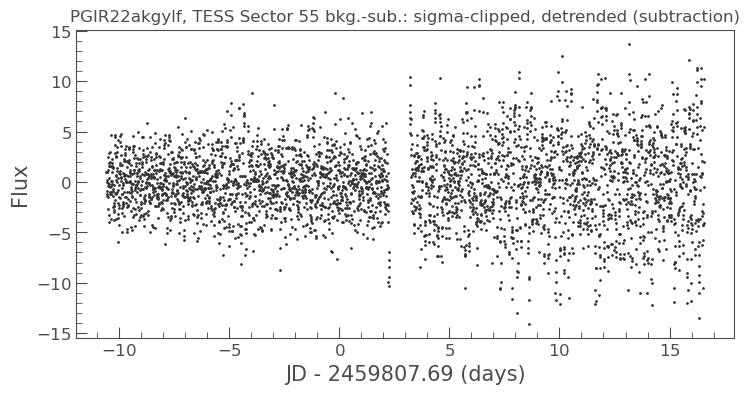

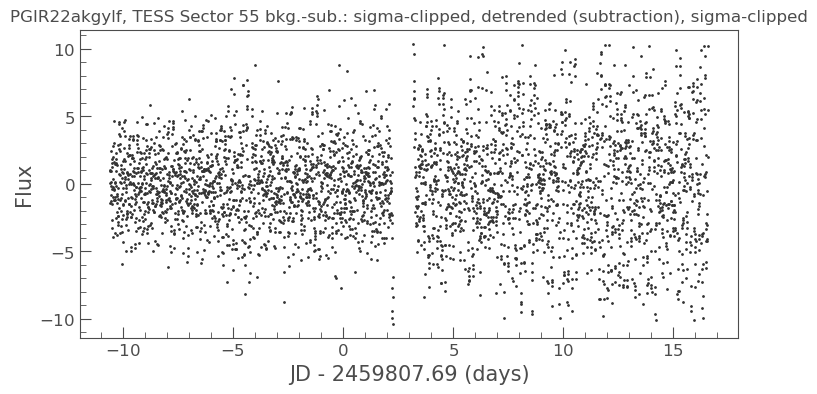

The best period is: 0.1802 d days


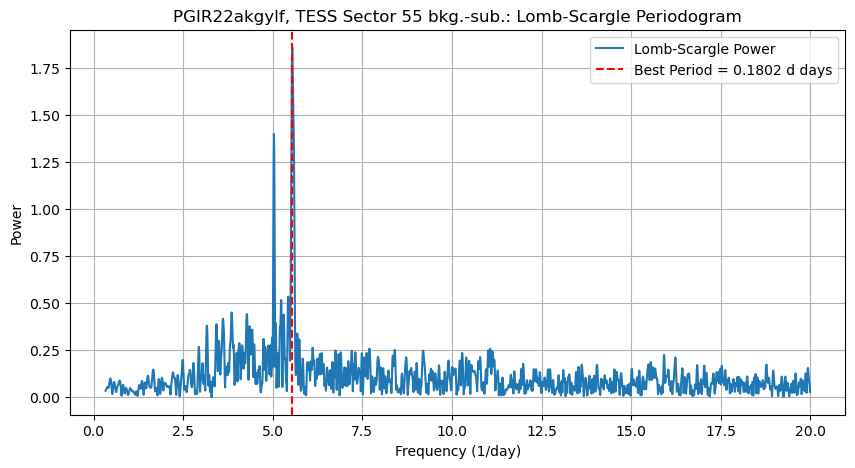

Fitted sine wave parameters:
  Amplitude: 1.863016
  Phase offset: 0.064961
  Vertical offset: 0.051974
  Phase of minimum: 0.314961
Light Elements:
  Period: 0.180234 d days
  JD0 (epoch of minimum): 2459797.167330


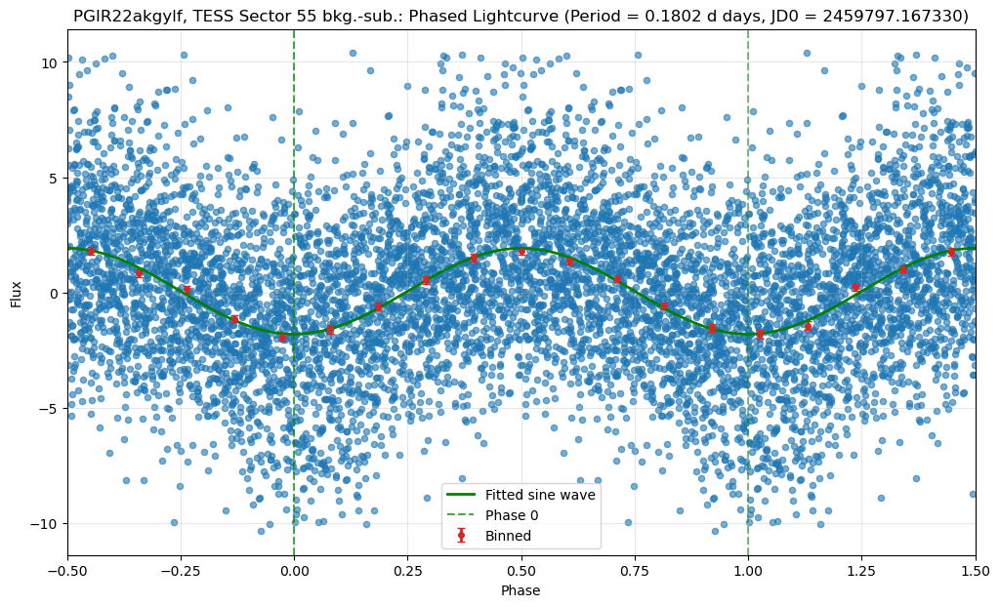

The simplified period analysis for the background lightcurve


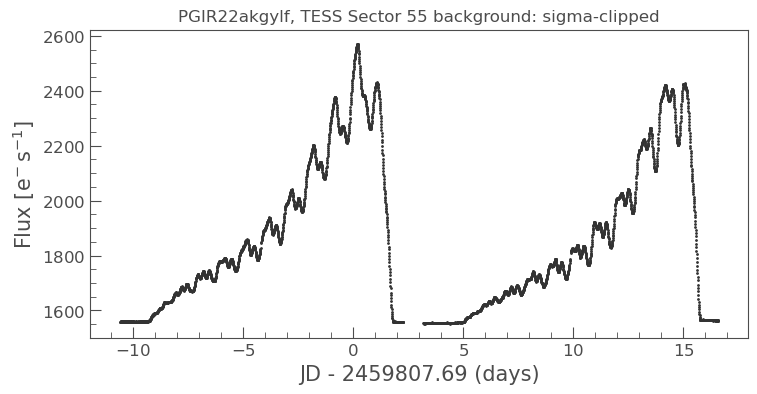

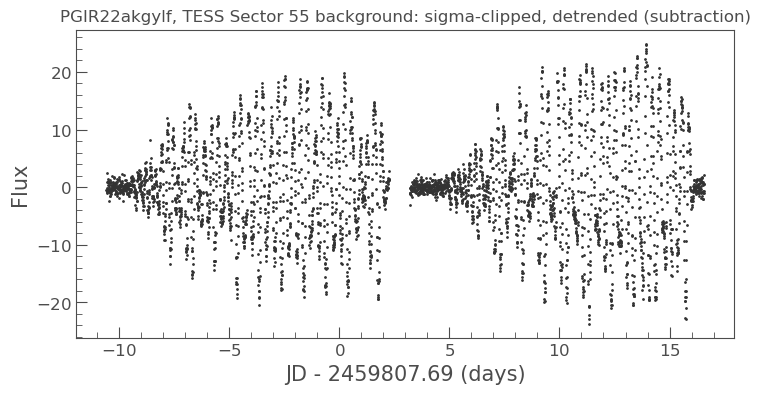

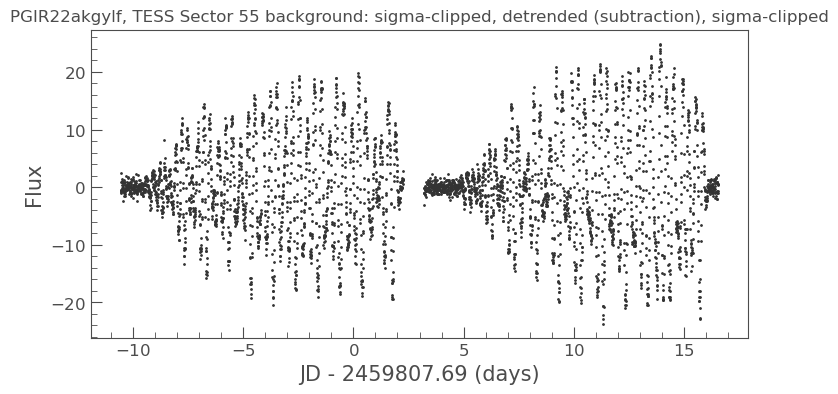

The best period is: 0.3334 d days


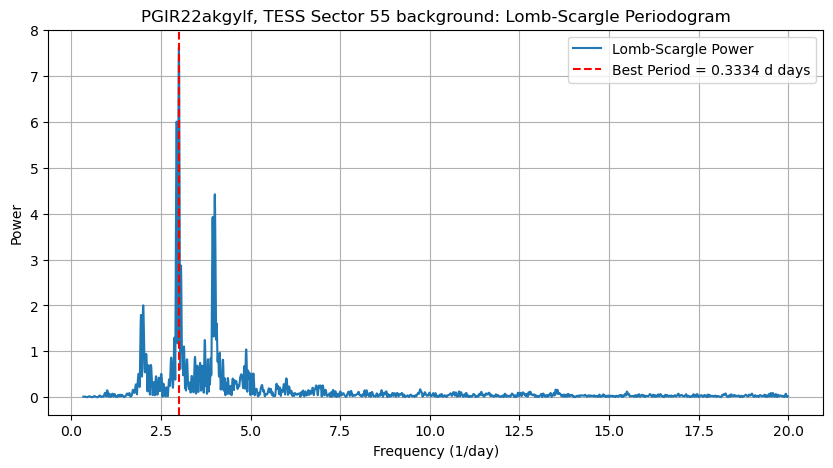

Fitted sine wave parameters:
  Amplitude: 7.619895
  Phase offset: 0.103704
  Vertical offset: -0.029395
  Phase of minimum: 0.853704
Light Elements:
  Period: 0.333360 d days
  JD0 (epoch of minimum): 2459797.395154


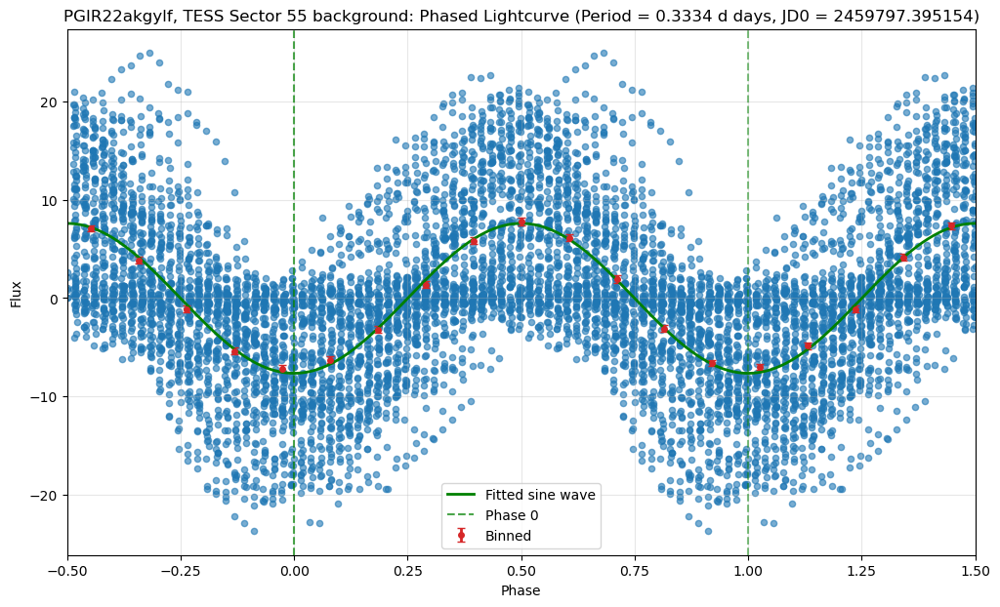

In [7]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[3].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name, cadence_index=3750)

# Sector 55 - 1st half

Cadence 0 was obtained at time: 2797.110563 TJD (2022-08-05T14:39:12.674)


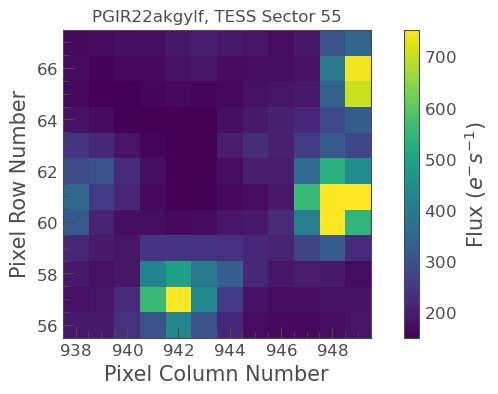

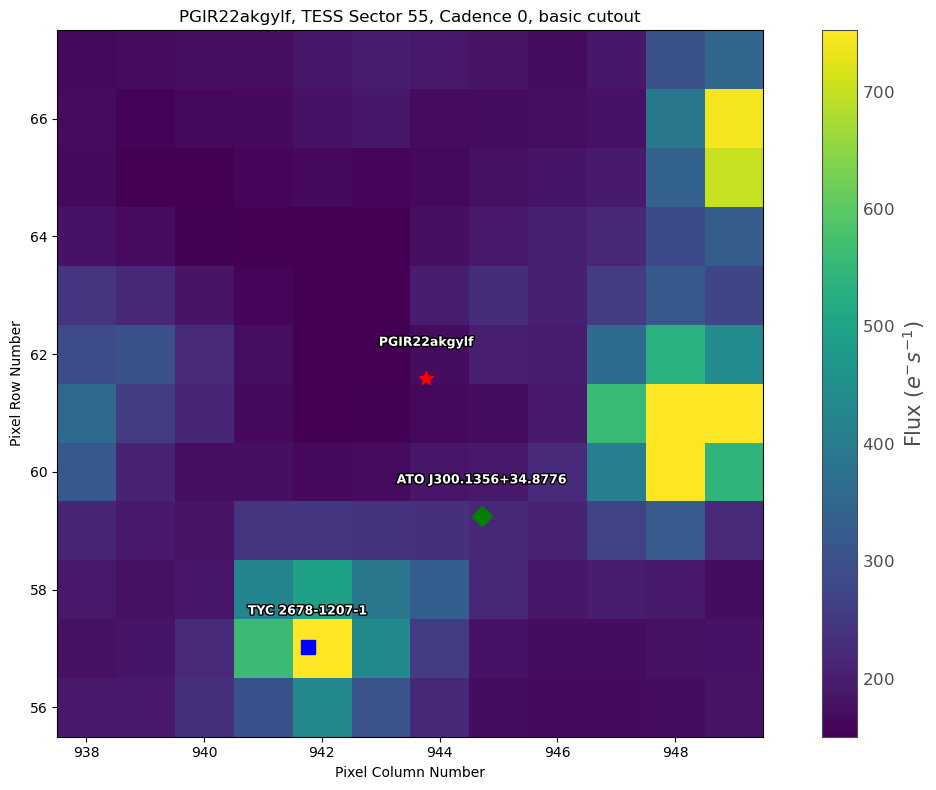

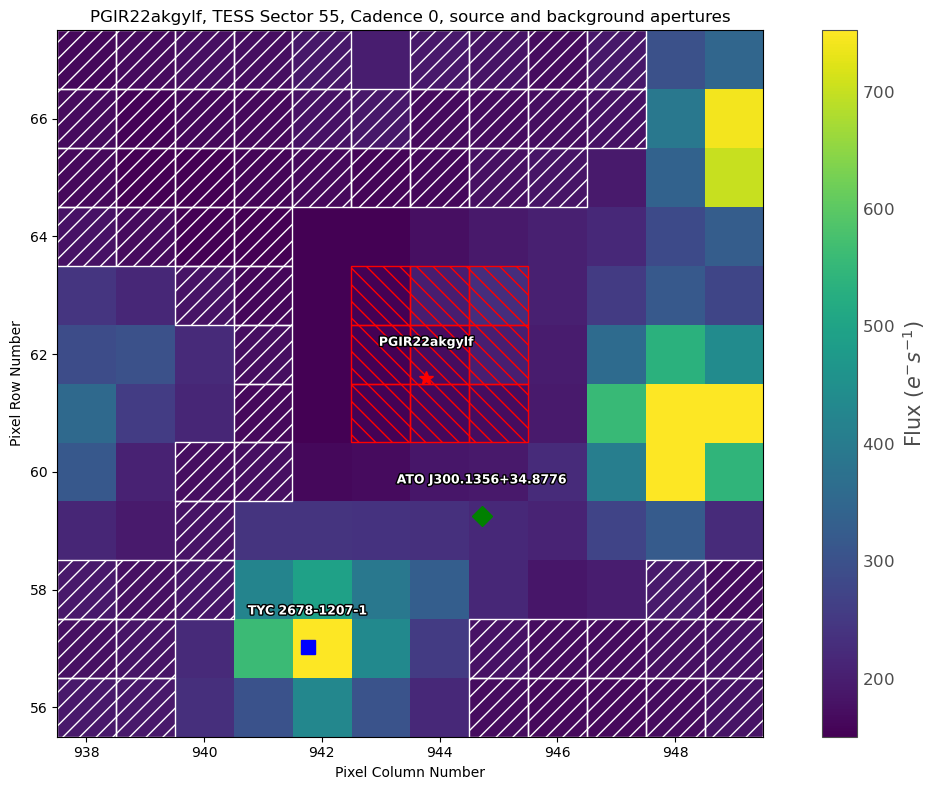

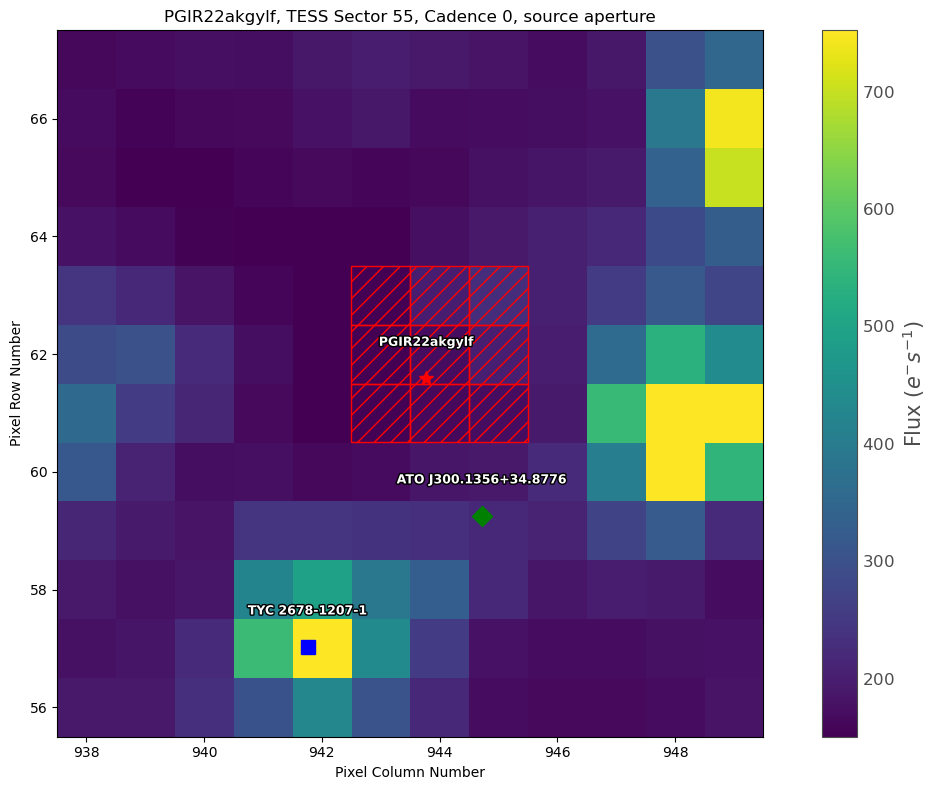

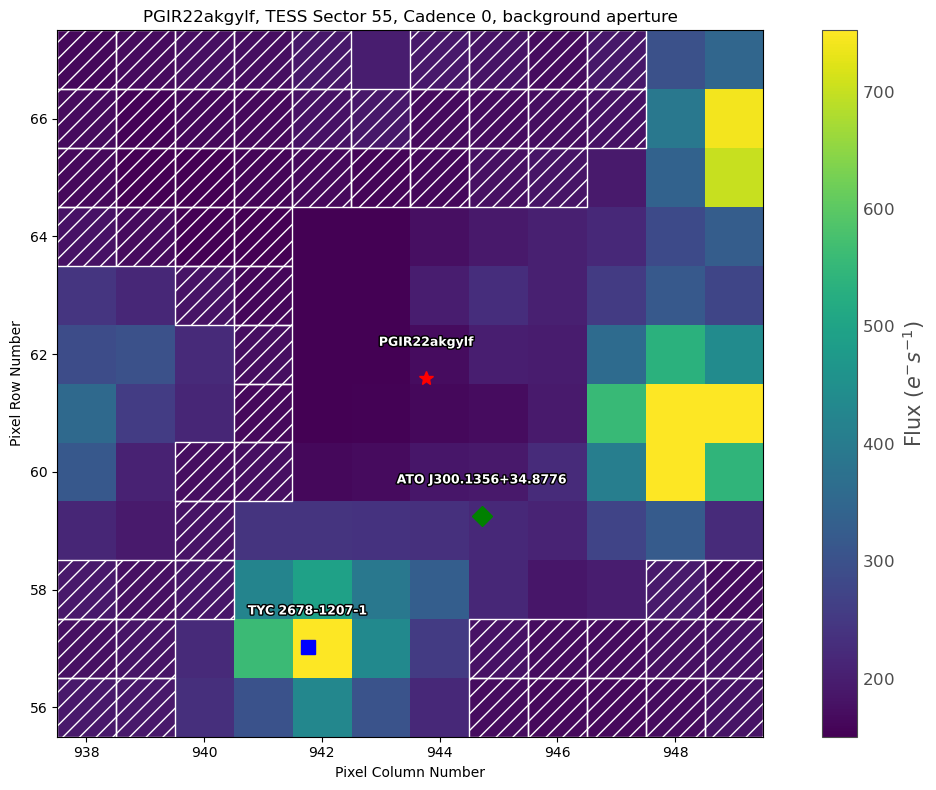

Applied TJD filter: 0 to 2810.5
Number of data points after filtering: 1847


<Figure size 1000x600 with 0 Axes>

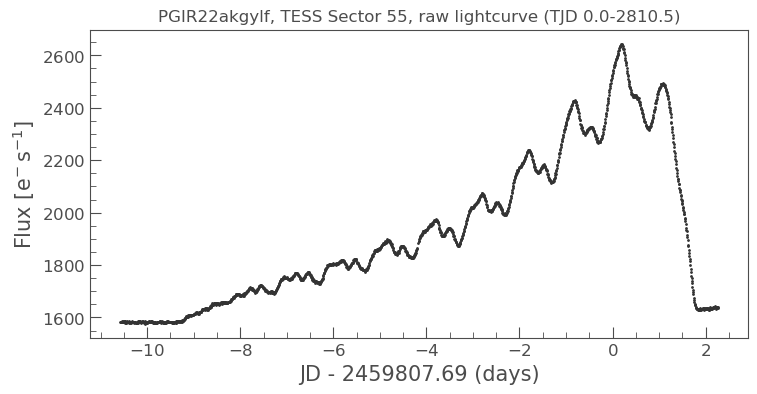

<Figure size 1000x600 with 0 Axes>

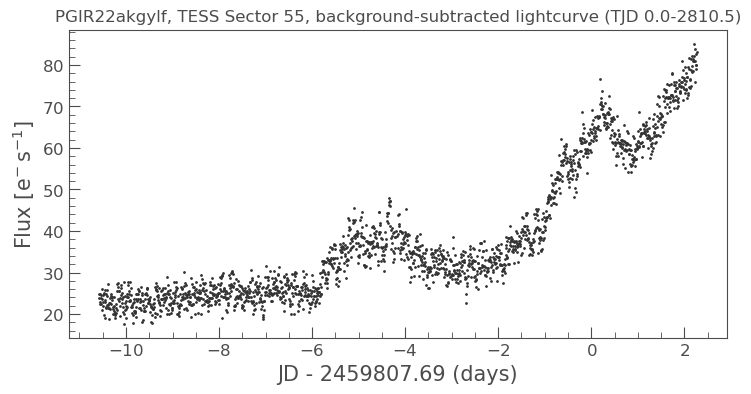

Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/pgir22akgylf_Sector55_lk_bcksub_TJD0-2810_mag.txt
Plotting magnitude lightcurve for PGIR22akgylf:
  - Data points: 1847
  - Time range: 2459797.111 to 2459809.958 JD
  - Magnitude range: 15.615 to 17.320 mag


<Figure size 1000x600 with 0 Axes>

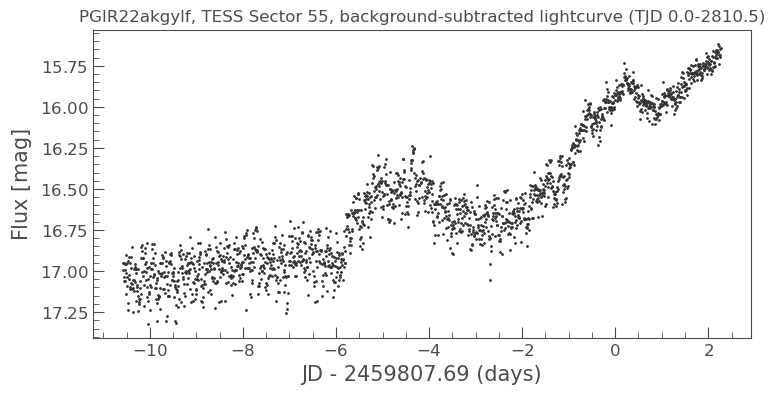

<Figure size 1000x600 with 0 Axes>

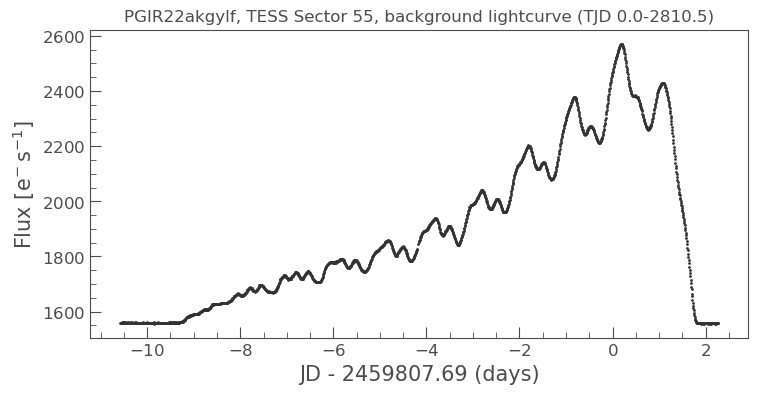

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

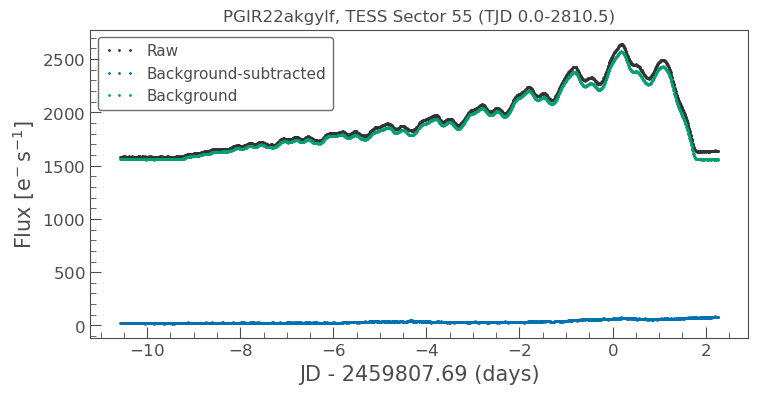

The simplified period analysis for the background-subtracted source lightcurve


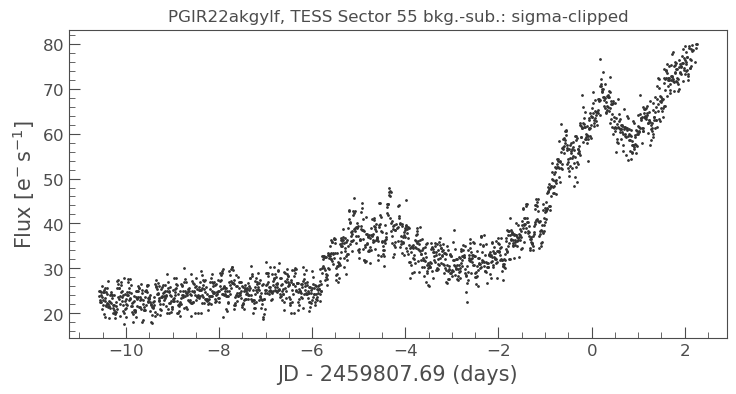

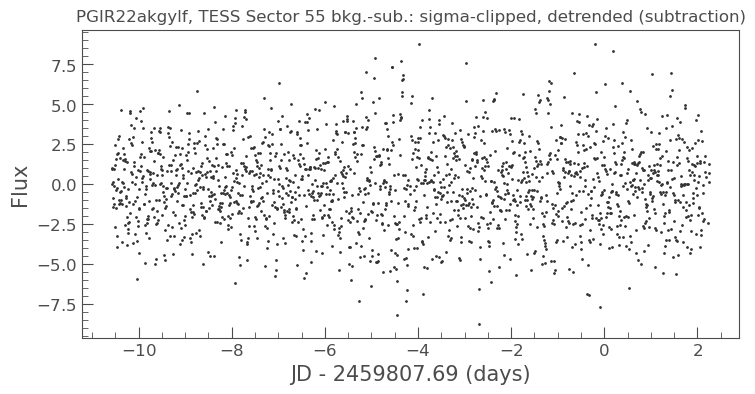

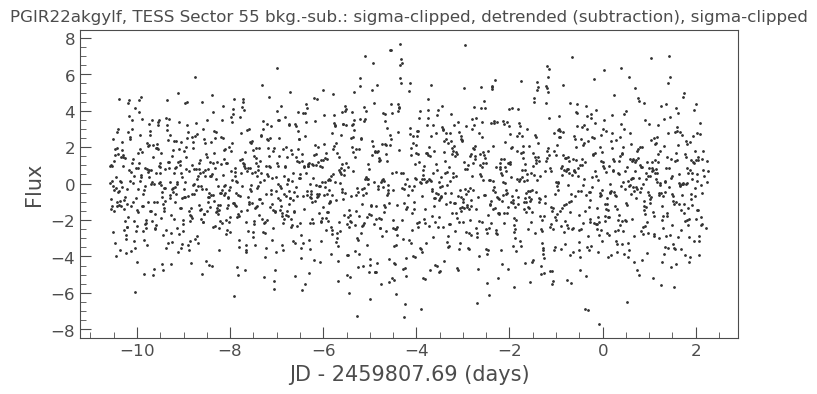

The best period is: 0.1991 d days


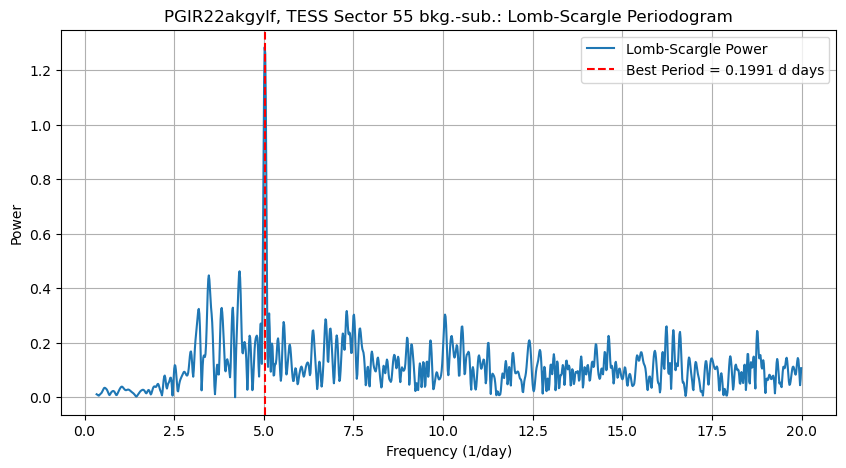

Fitted sine wave parameters:
  Amplitude: 1.286412
  Phase offset: -0.059520
  Vertical offset: -0.008584
  Phase of minimum: 0.690480
Light Elements:
  Period: 0.199134 d days
  JD0 (epoch of minimum): 2459797.248062


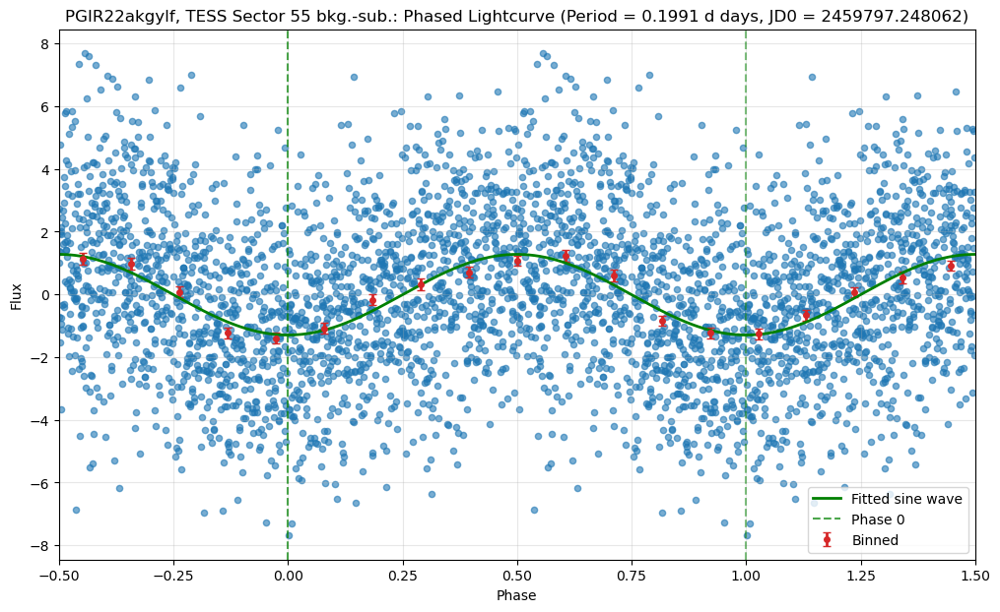

The simplified period analysis for the background lightcurve


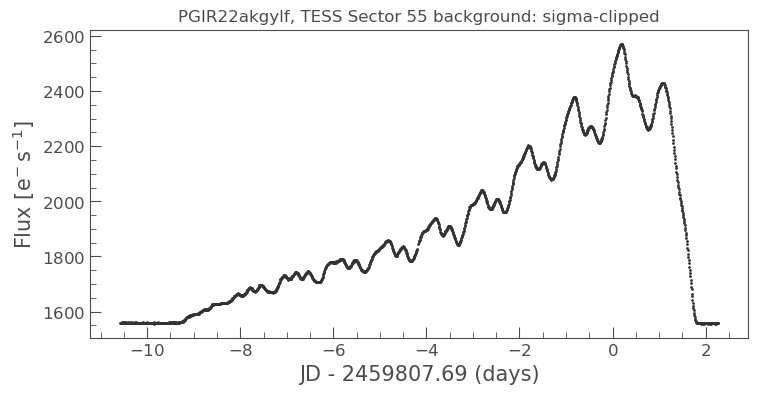

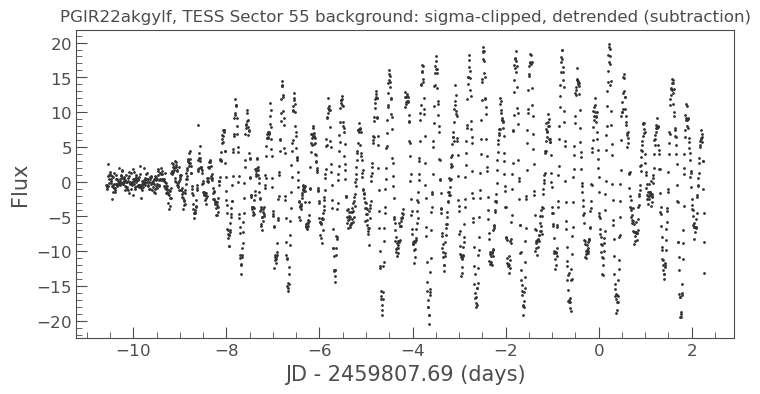

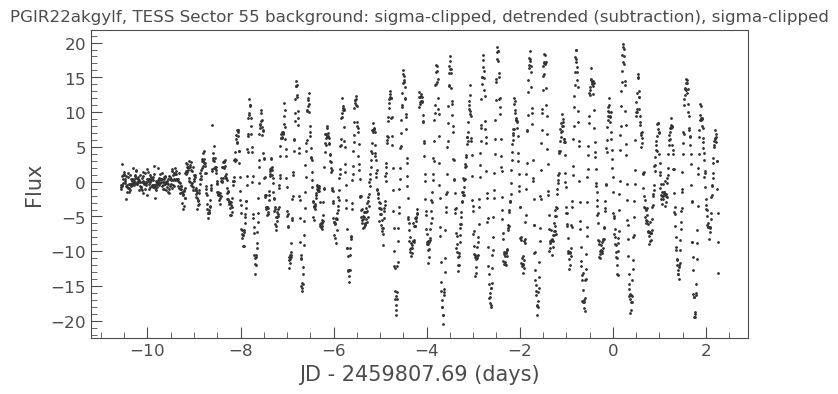

The best period is: 0.3356 d days


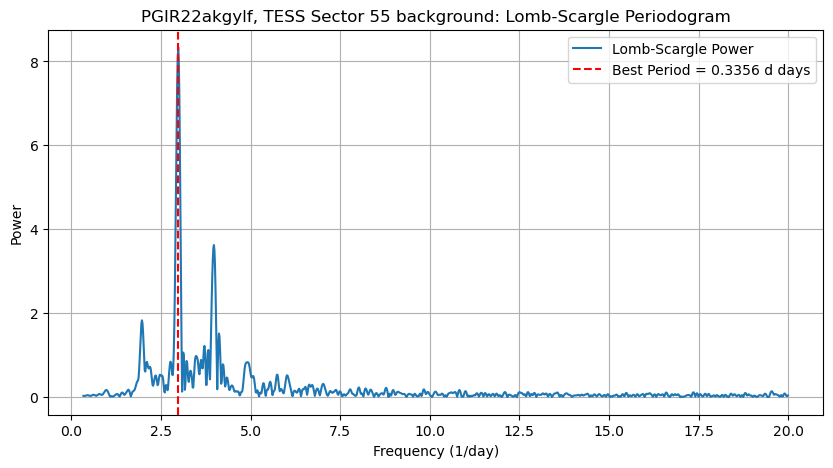

Fitted sine wave parameters:
  Amplitude: 8.322774
  Phase offset: -0.047919
  Vertical offset: -0.061192
  Phase of minimum: 0.702081
Light Elements:
  Period: 0.335589 d days
  JD0 (epoch of minimum): 2459797.346174


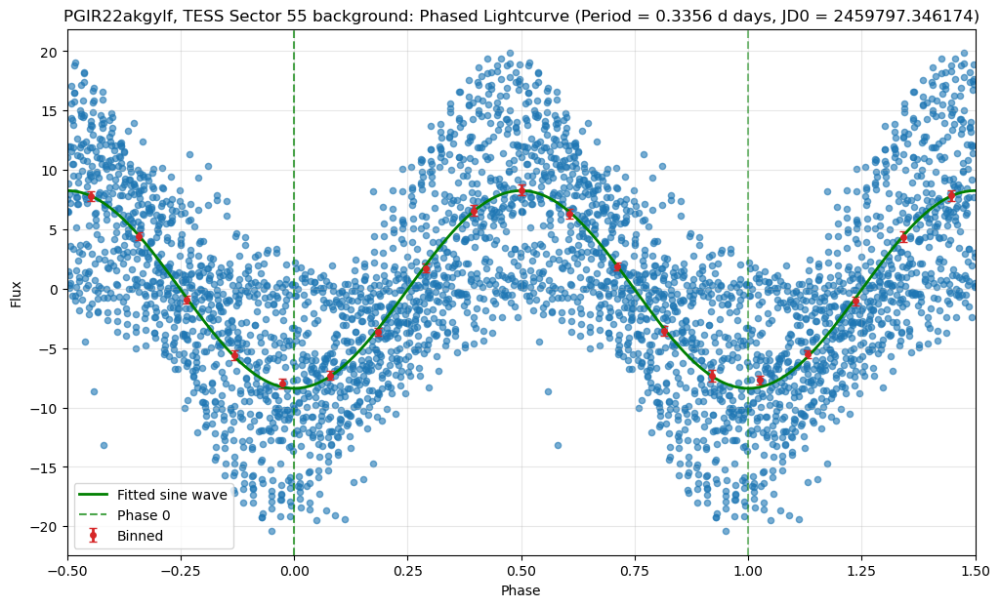

In [8]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[3].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name, cadence_index=0, tjd_range=(0, 2810.5))

# Sectot 55 - 2nd half

Cadence 0 was obtained at time: 2797.110563 TJD (2022-08-05T14:39:12.674)


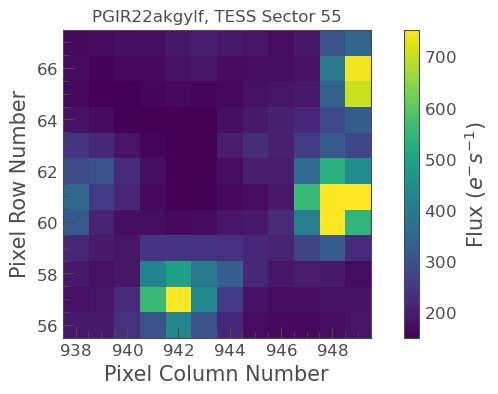

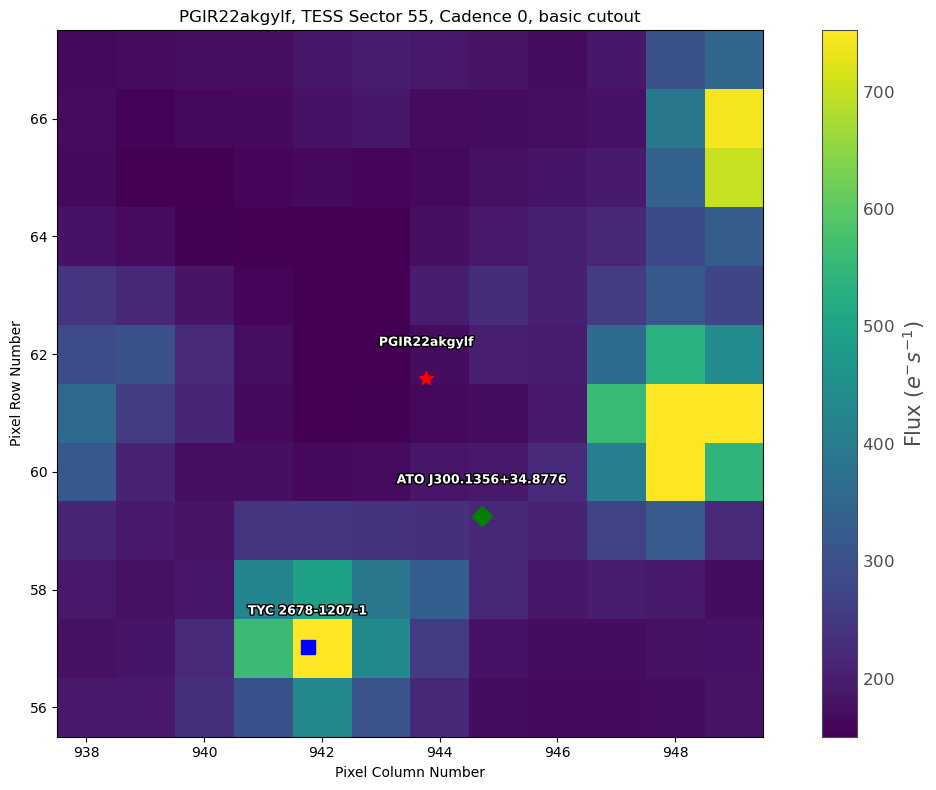

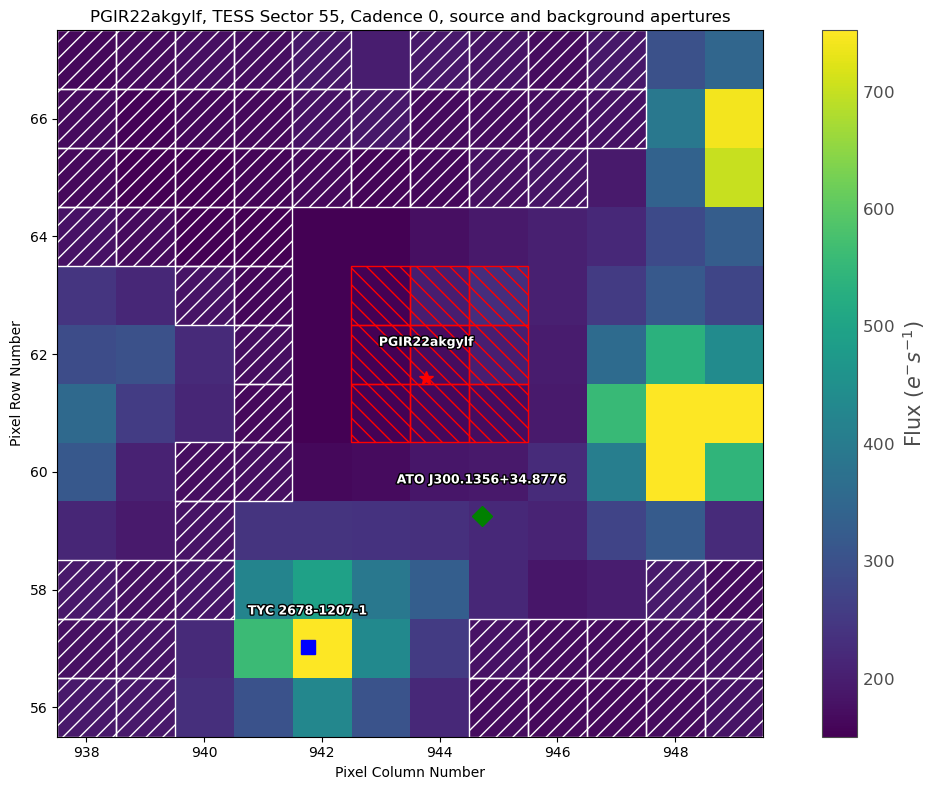

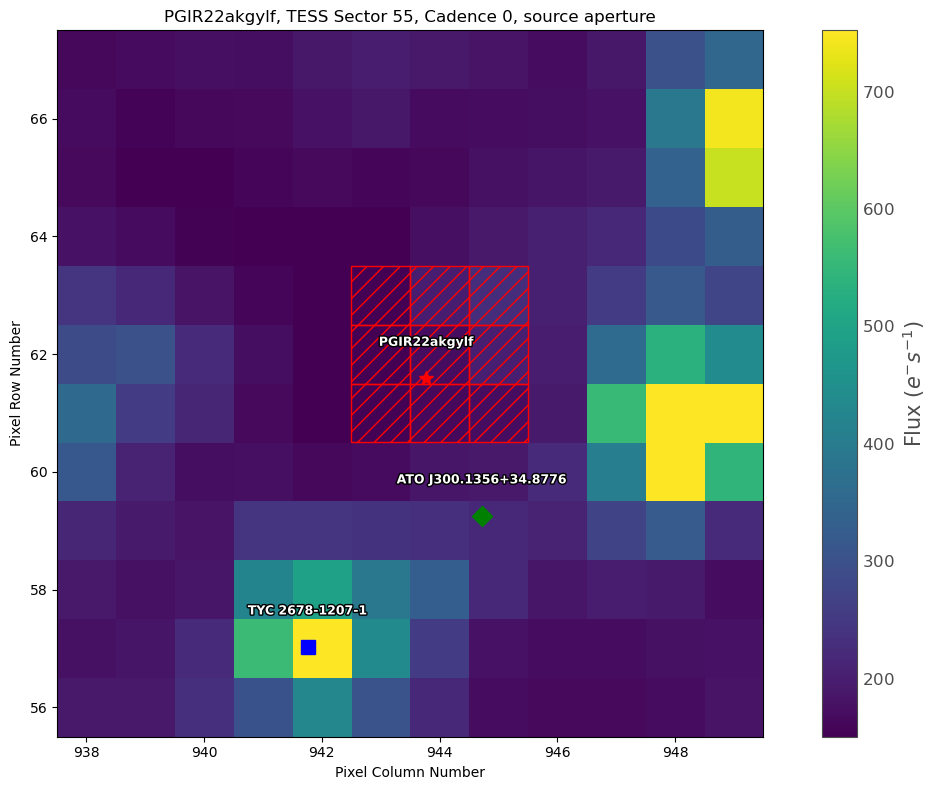

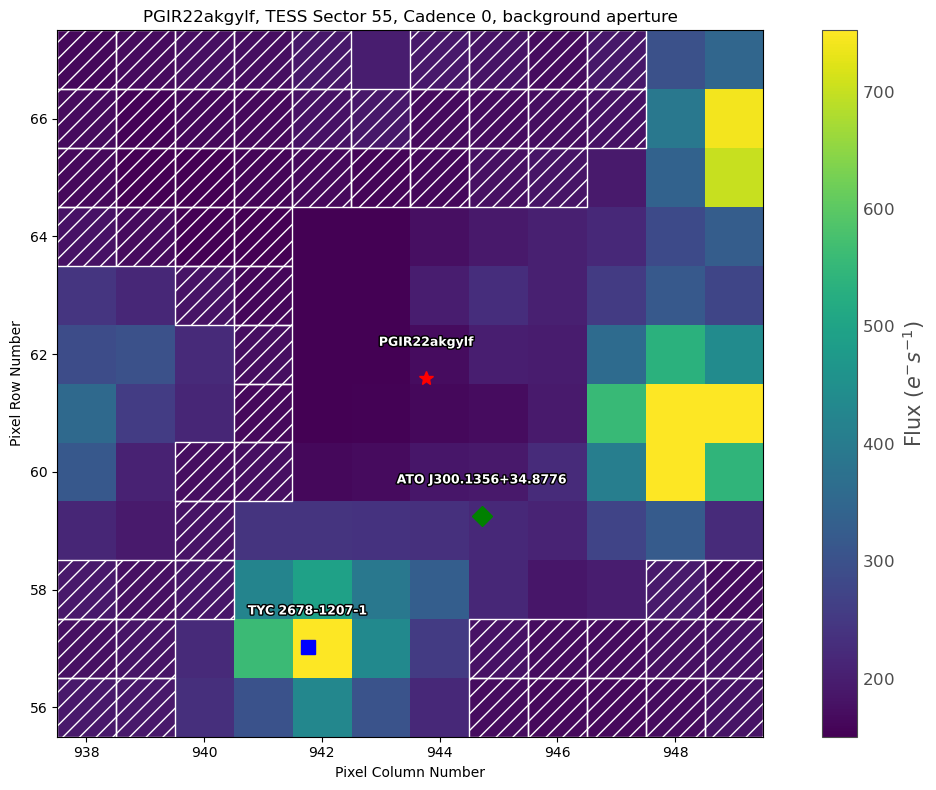

Applied TJD filter: 2810.5 to 999999
Number of data points after filtering: 1924


<Figure size 1000x600 with 0 Axes>

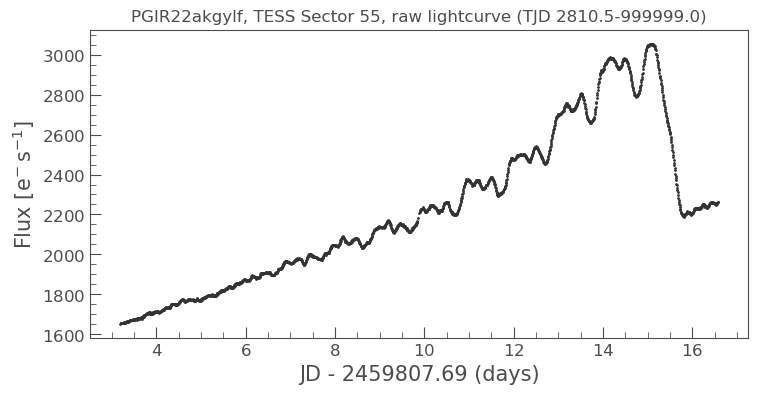

<Figure size 1000x600 with 0 Axes>

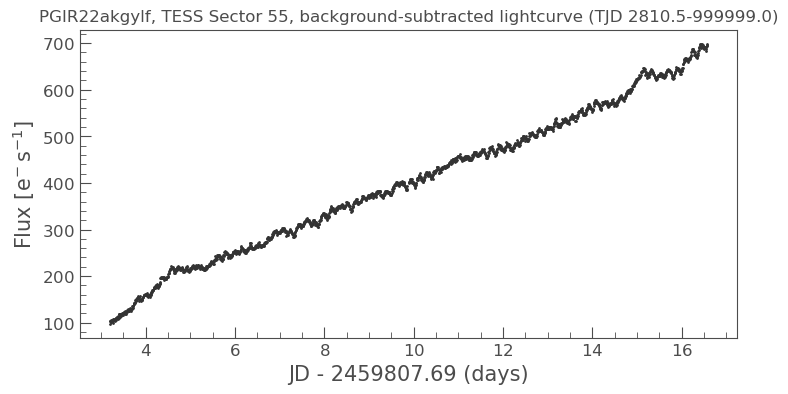

Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/pgir22akgylf_Sector55_lk_bcksub_TJD2810-999999_mag.txt
Plotting magnitude lightcurve for PGIR22akgylf:
  - Data points: 1924
  - Time range: 2459810.881 to 2459824.263 JD
  - Magnitude range: 13.329 to 15.460 mag


<Figure size 1000x600 with 0 Axes>

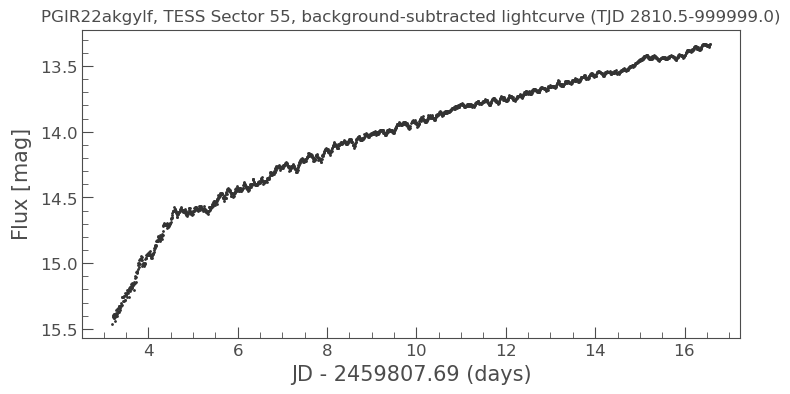

<Figure size 1000x600 with 0 Axes>

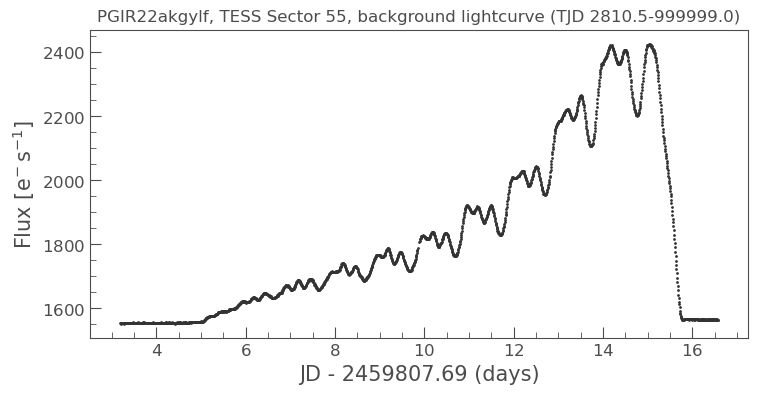

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

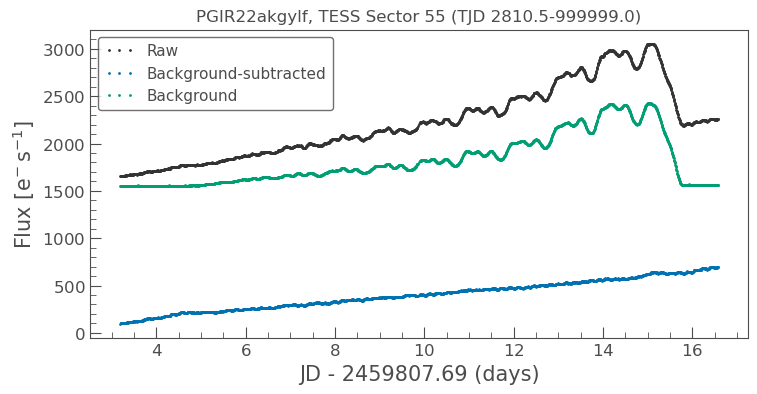

The simplified period analysis for the background-subtracted source lightcurve


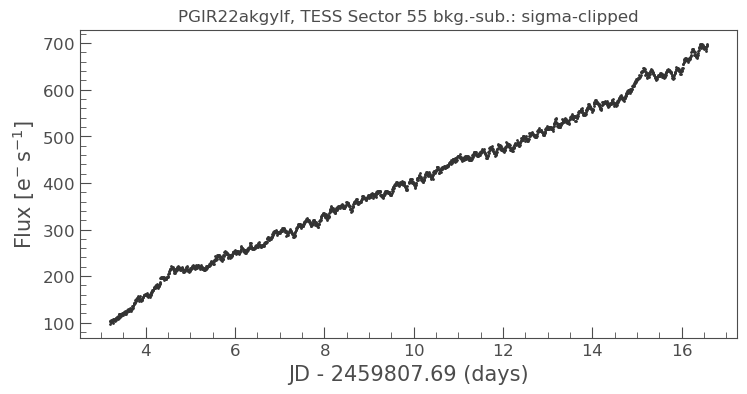

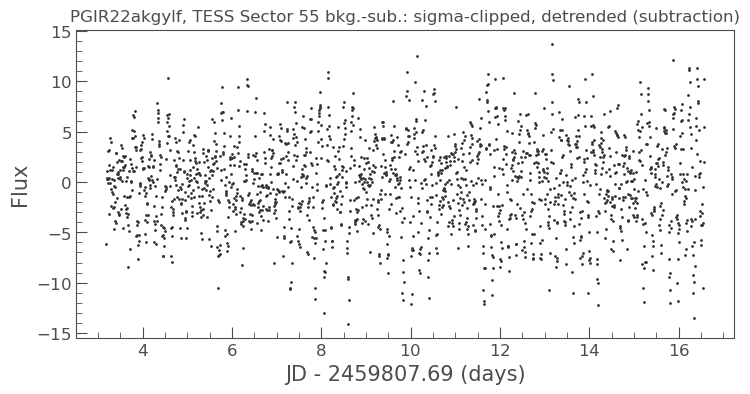

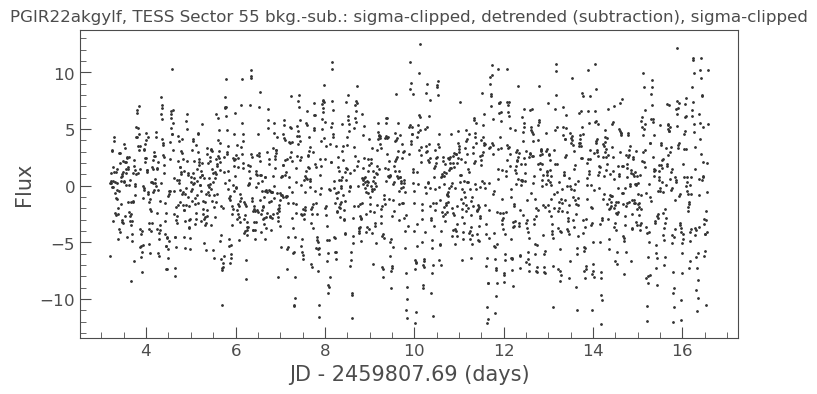

The best period is: 0.1802 d days


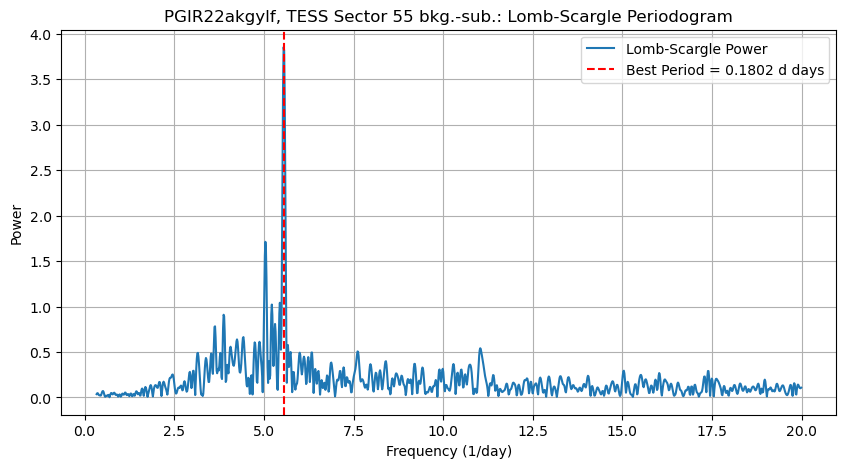

Fitted sine wave parameters:
  Amplitude: 3.858711
  Phase offset: 0.182197
  Vertical offset: 0.010499
  Phase of minimum: 0.932197
Light Elements:
  Period: 0.180199 d days
  JD0 (epoch of minimum): 2459811.049294


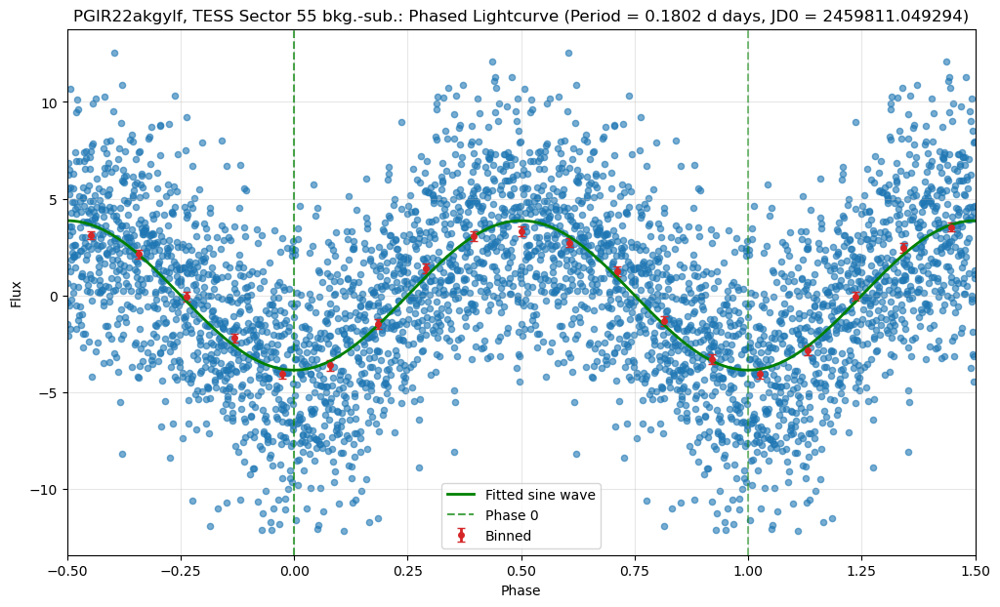

The simplified period analysis for the background lightcurve


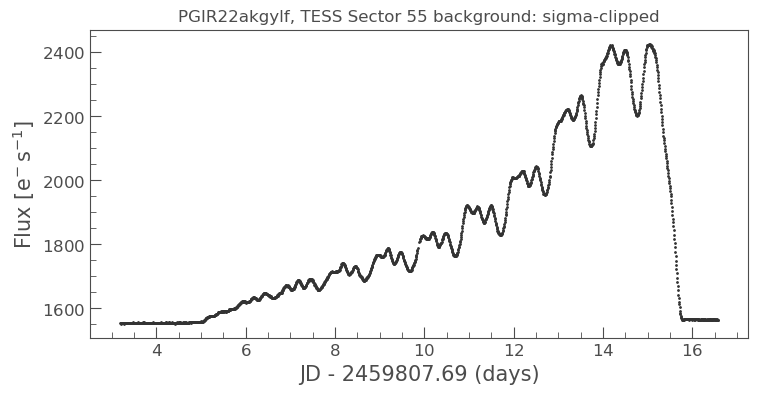

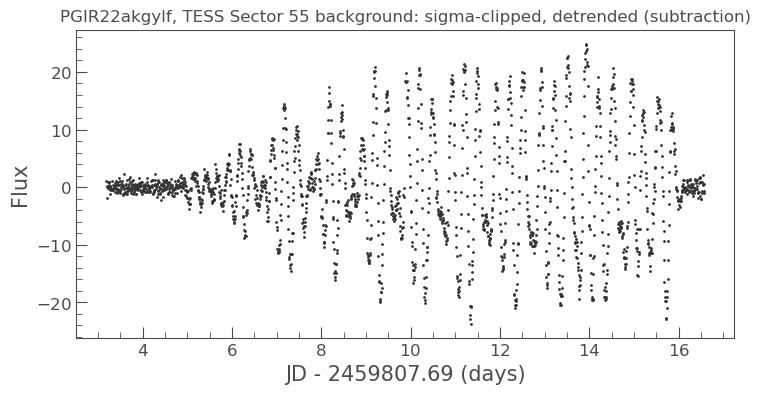

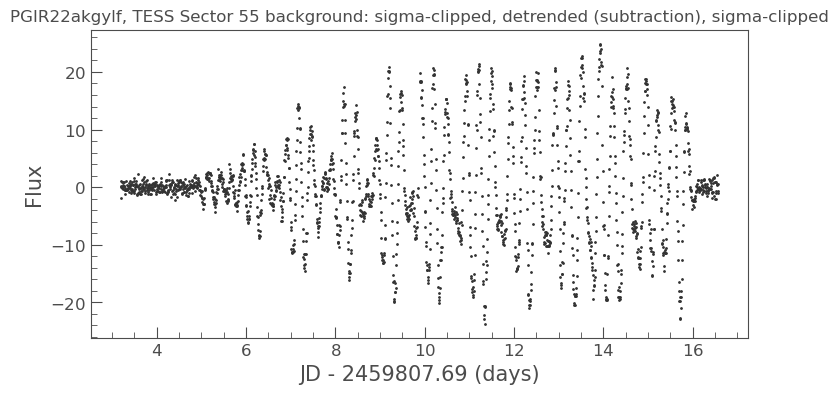

The best period is: 0.3357 d days


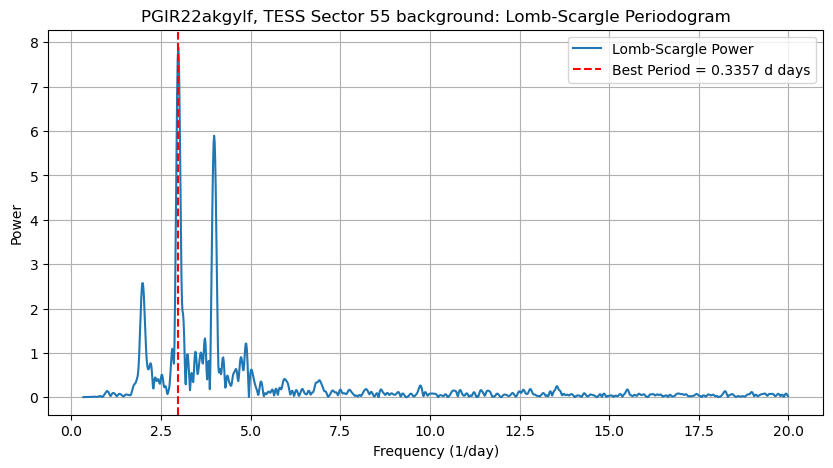

Fitted sine wave parameters:
  Amplitude: 7.901309
  Phase offset: 0.103203
  Vertical offset: 0.036225
  Phase of minimum: 0.353203
Light Elements:
  Period: 0.335713 d days
  JD0 (epoch of minimum): 2459810.999887


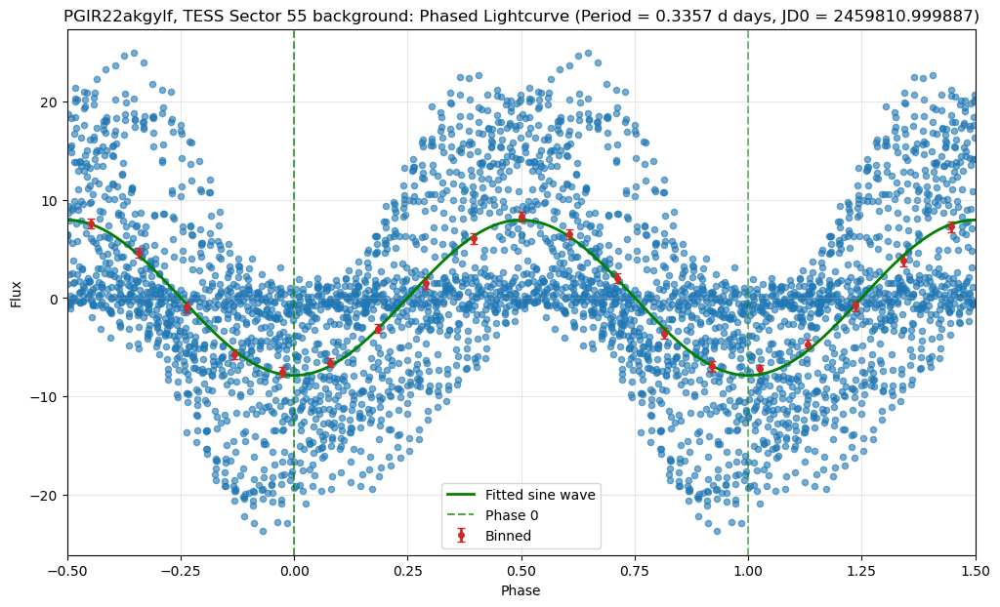

In [9]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[3].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name, cadence_index=0, tjd_range=(2810.5, 999999))

### Sector 14 - pre-eruption 1

Cadence 0 was obtained at time: 1683.368103 TJD (2019-07-18T20:50:04.102)


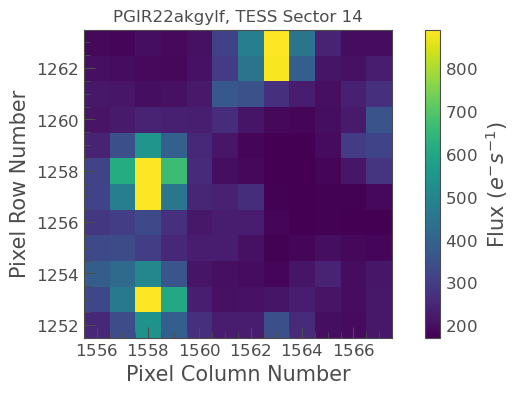

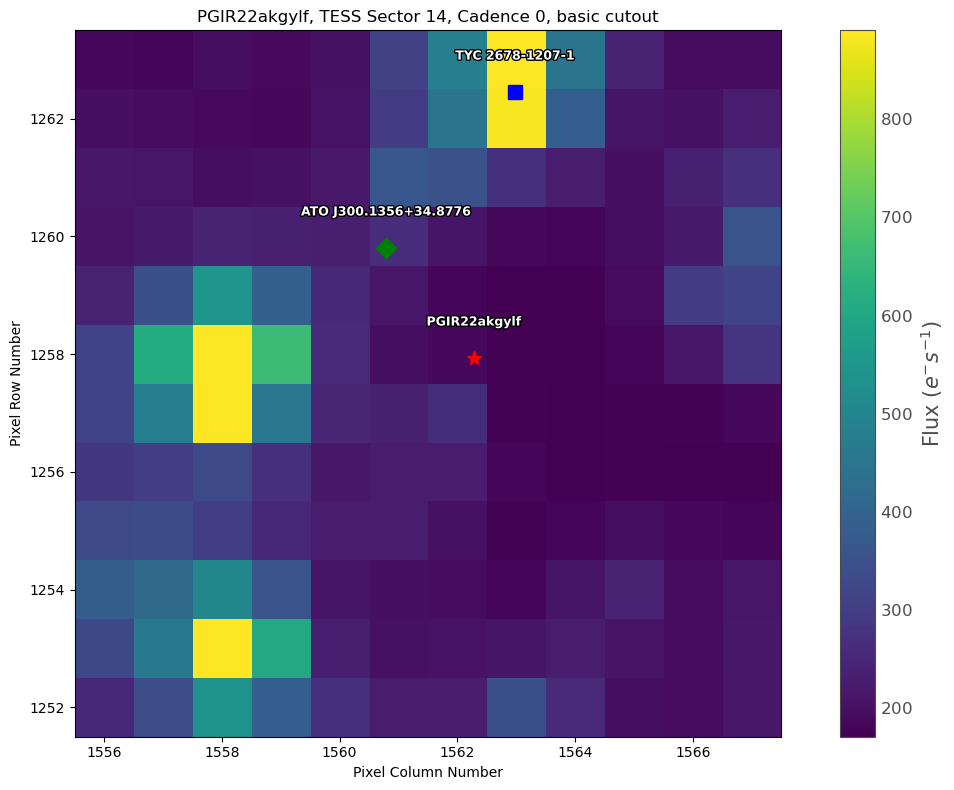

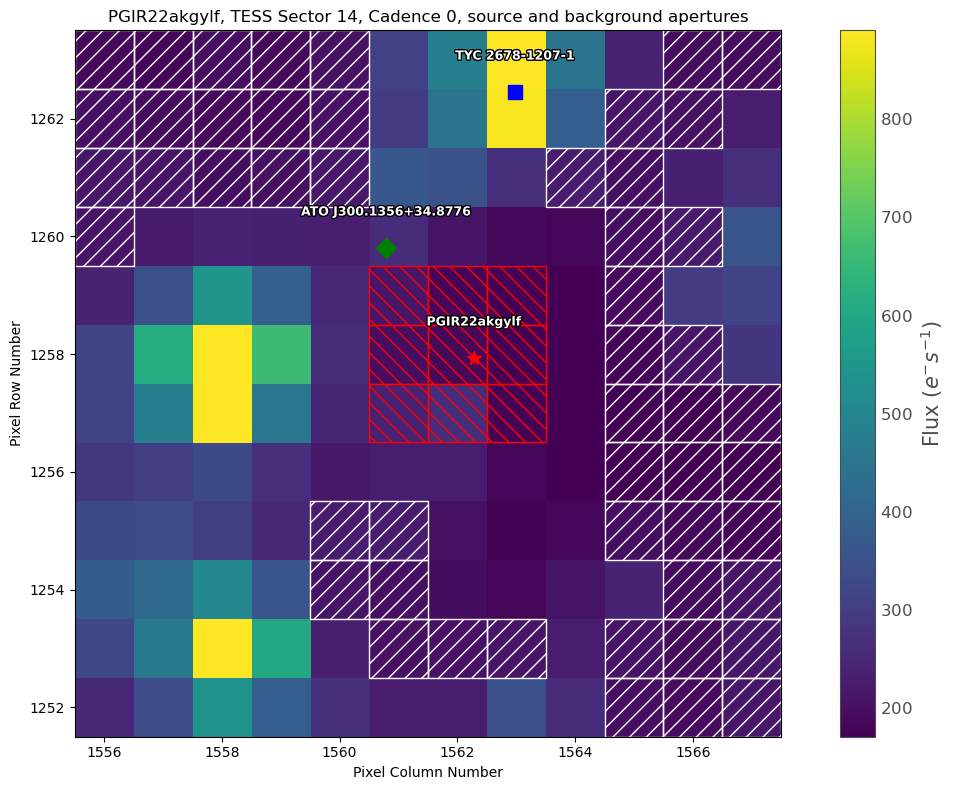

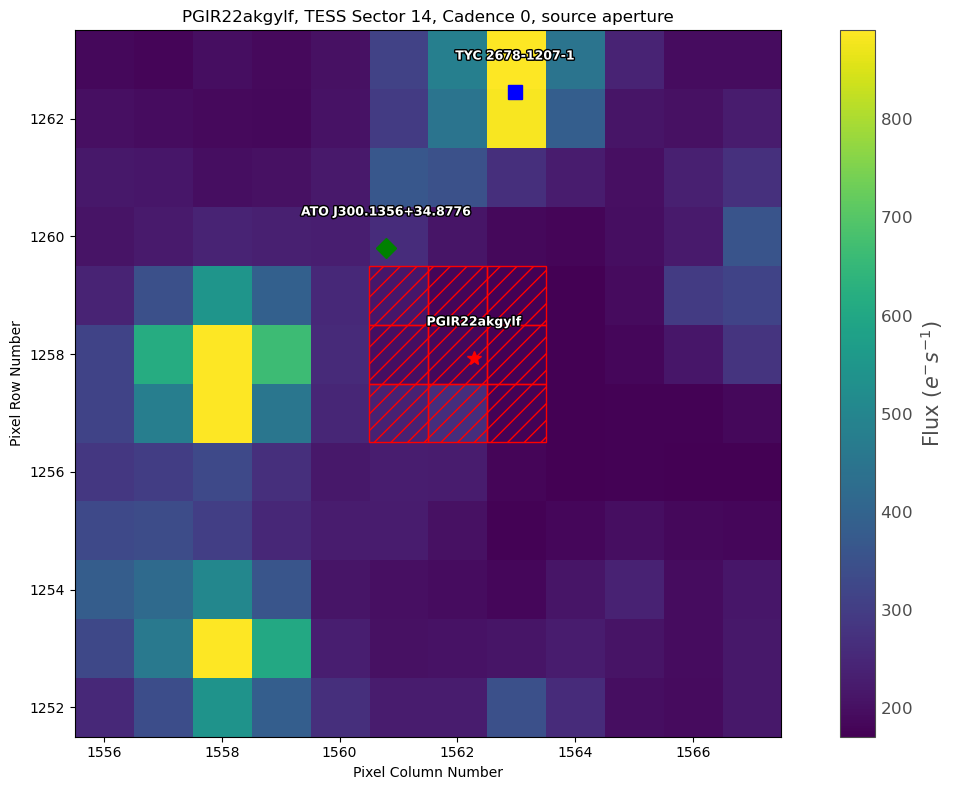

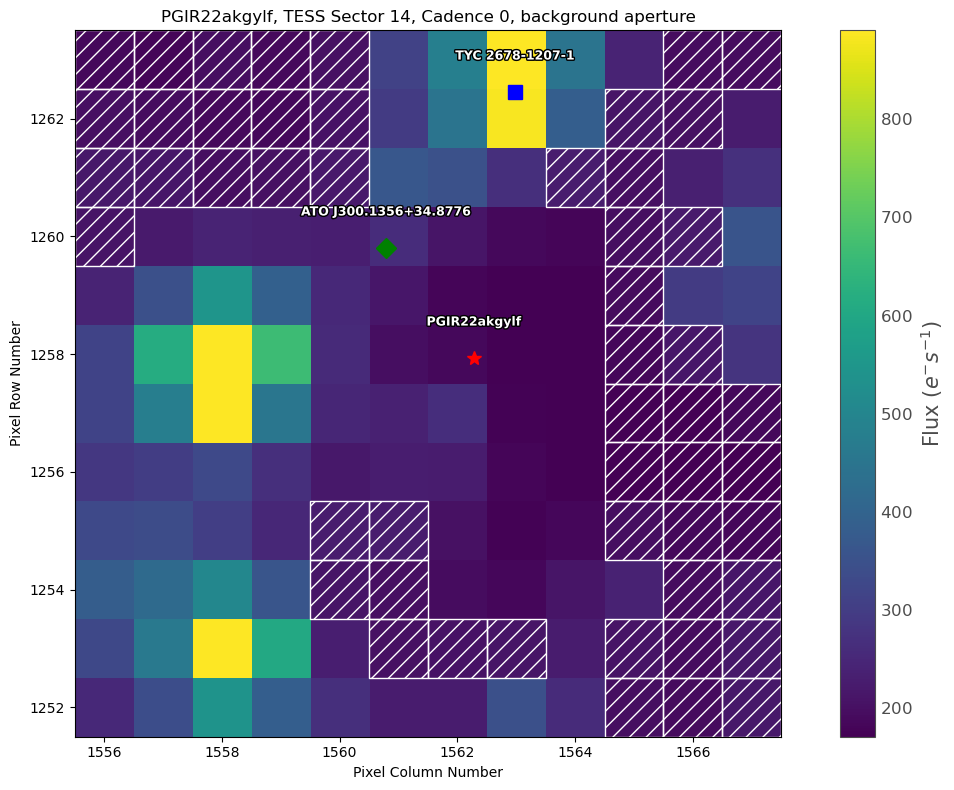

<Figure size 1000x600 with 0 Axes>

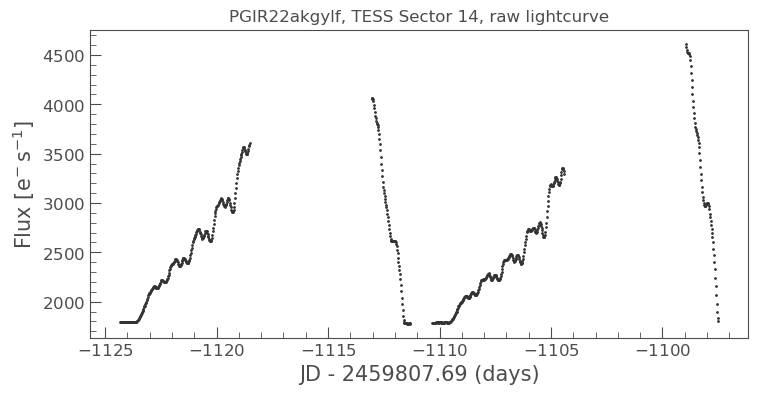

<Figure size 1000x600 with 0 Axes>

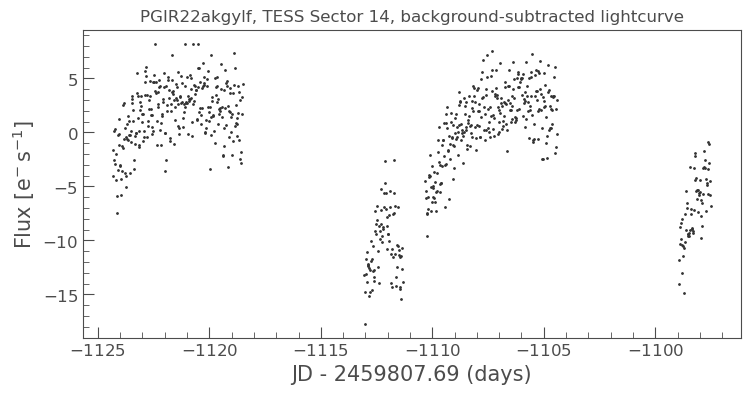

/tmp/ipykernel_2530919/3333624250.py:15: RuntimeWarning: invalid value encountered in log10
  mag = 20.44 - 2.5 * np.log10(flux)  # Convert flux to magnitude
/tmp/ipykernel_2530919/3333624250.py:16: RuntimeWarning: invalid value encountered in log10
  mag_err = -2.5 * np.log10((flux - flux_err) / flux)  # Calculate magnitude error


Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/pgir22akgylf_Sector14_lk_bcksub_fullTJDrange_mag.txt
Plotting magnitude lightcurve for PGIR22akgylf:
  - Data points: 717
  - Time range: 2458683.368 to 2458710.181 JD
  - Magnitude range: nan to nan mag


<Figure size 1000x600 with 0 Axes>

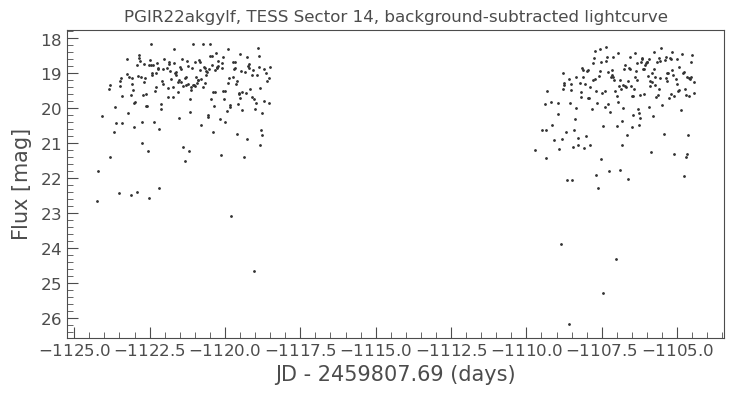

<Figure size 1000x600 with 0 Axes>

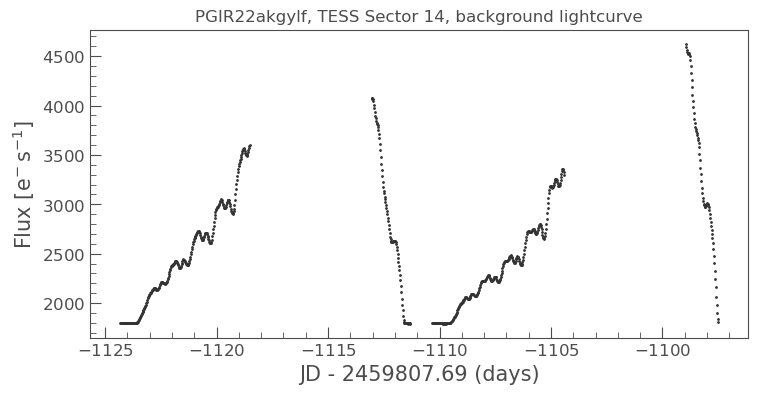

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

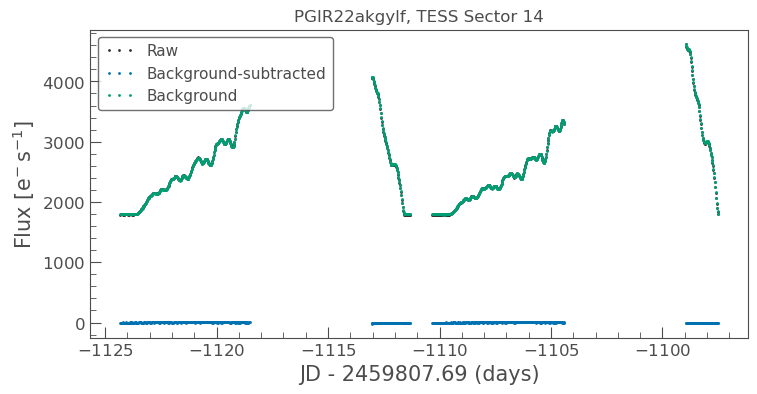

The simplified period analysis for the background-subtracted source lightcurve


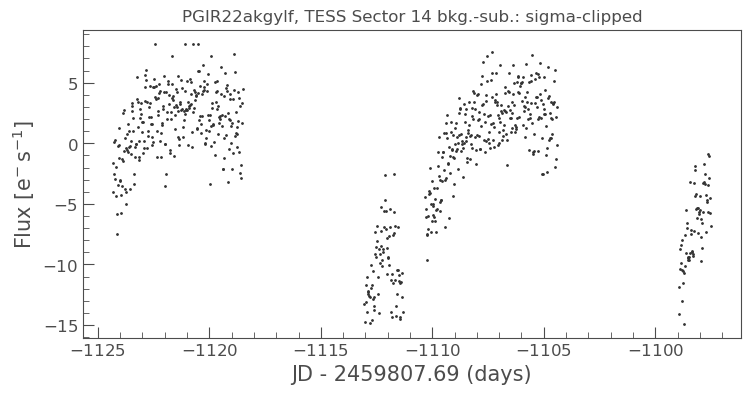

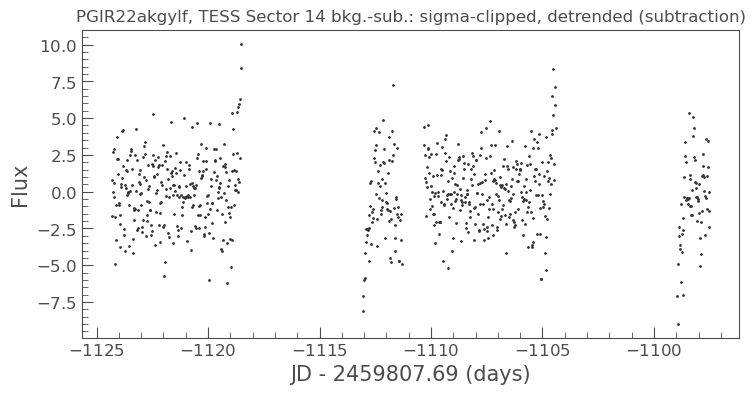

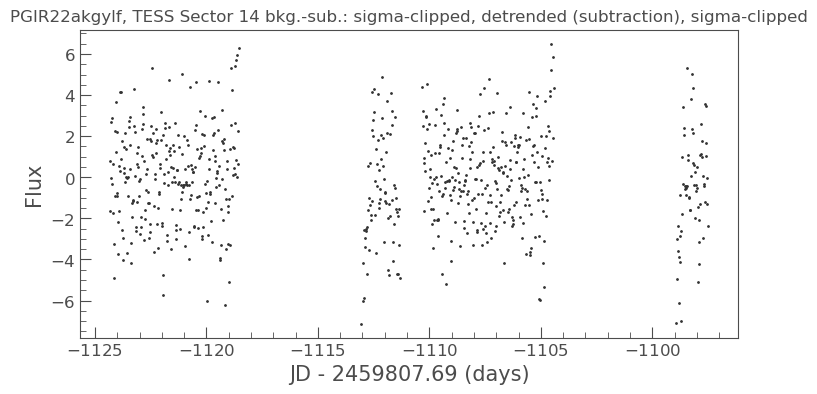

The best period is: 0.1987 d days


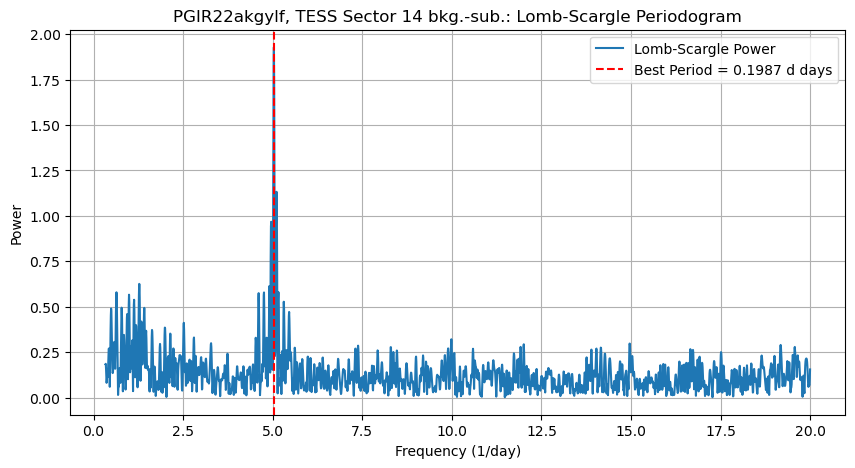

Fitted sine wave parameters:
  Amplitude: 1.932705
  Phase offset: 0.135751
  Vertical offset: -0.041727
  Phase of minimum: 0.885751
Light Elements:
  Period: 0.198705 d days
  JD0 (epoch of minimum): 2458683.544106


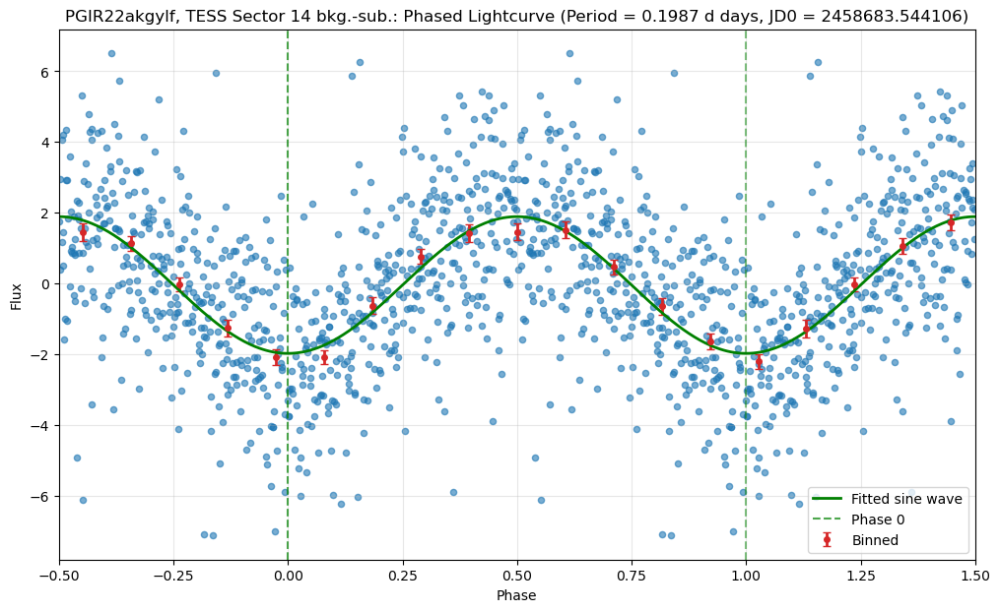

The simplified period analysis for the background lightcurve


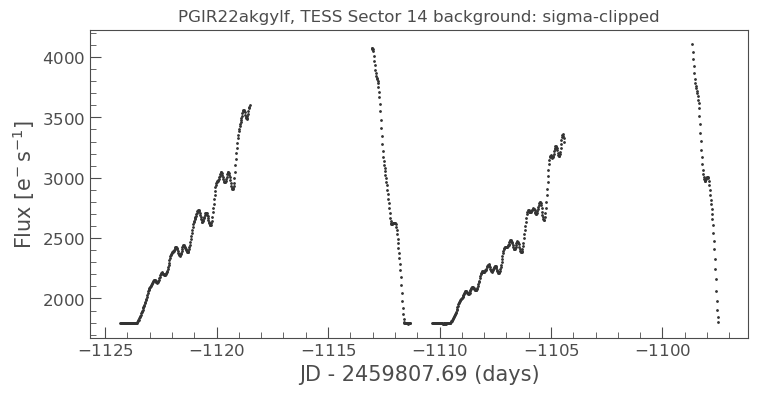

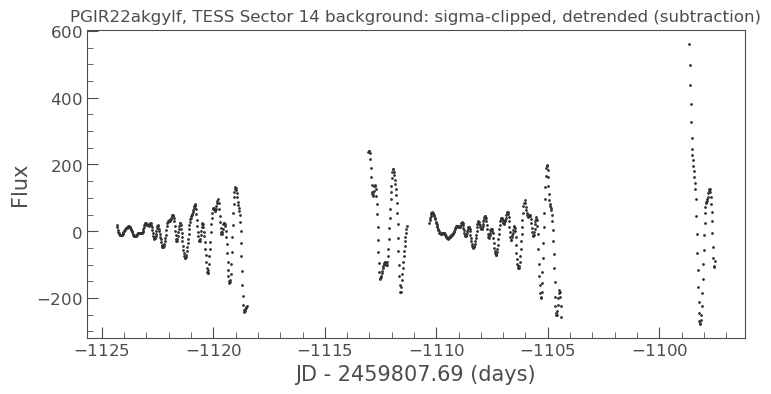

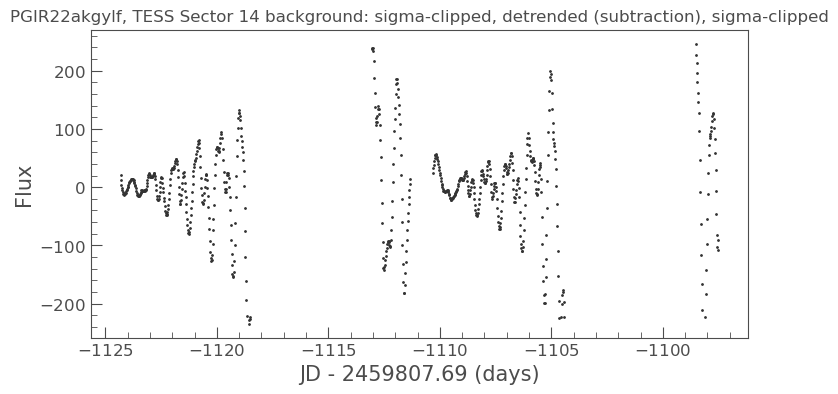

The best period is: 1.0028 d days


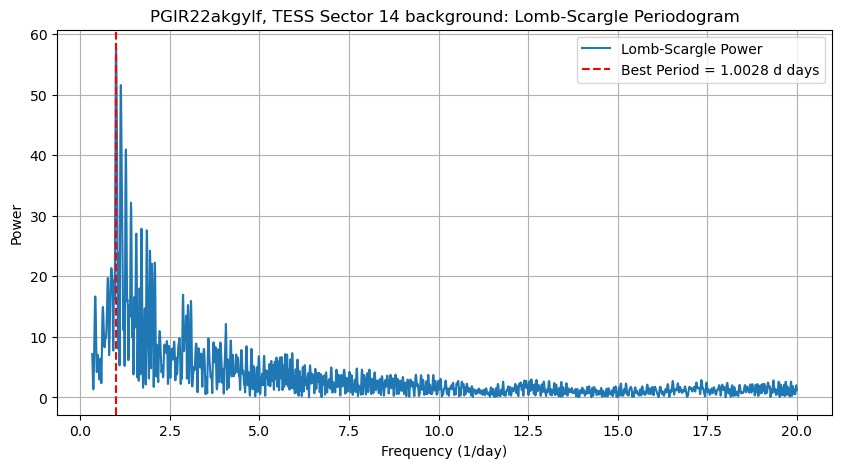

Fitted sine wave parameters:
  Amplitude: 57.632886
  Phase offset: 0.130375
  Vertical offset: 0.211327
  Phase of minimum: 0.880375
Light Elements:
  Period: 1.002811 d days
  JD0 (epoch of minimum): 2458684.250953


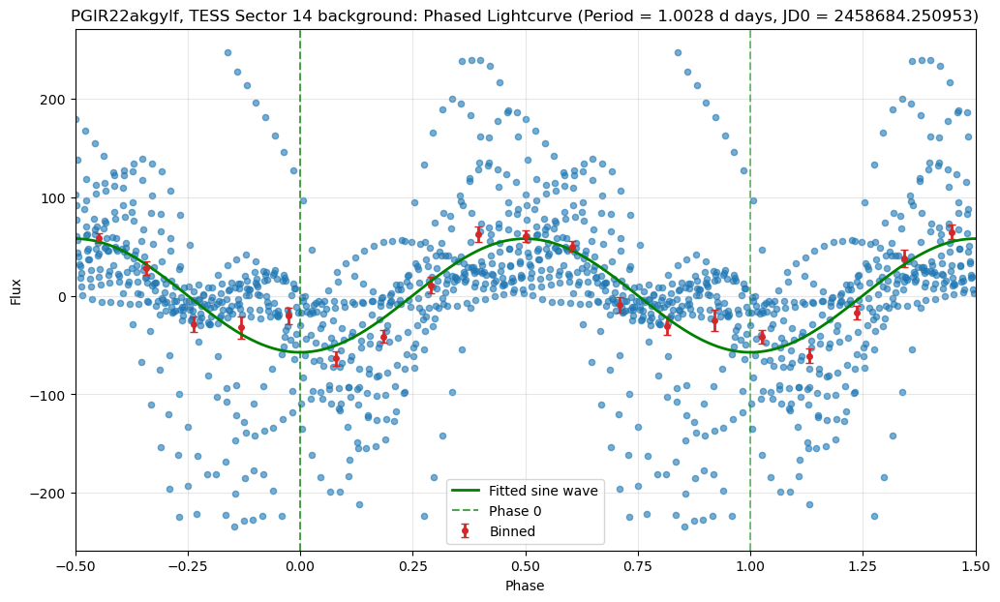

In [10]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[0].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name)

### Sector 54 - pre-eruption 2

Cadence 0 was obtained at time: 2769.908911 TJD (2022-07-09T09:48:49.884)


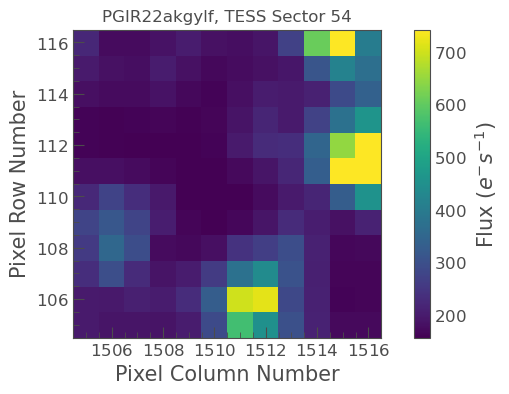

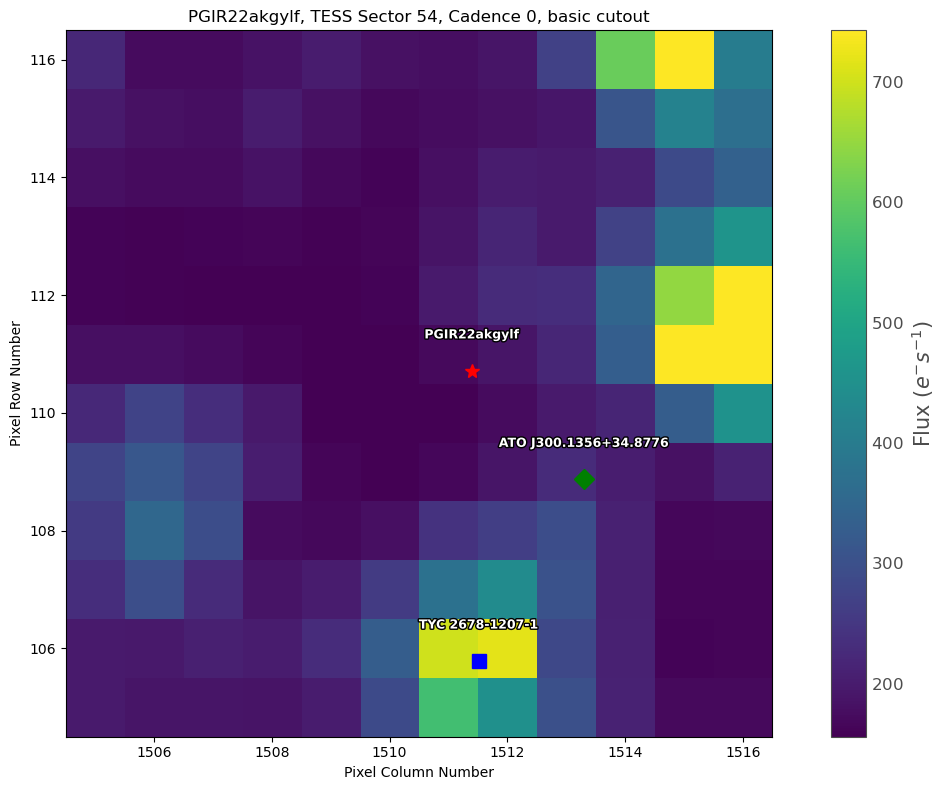

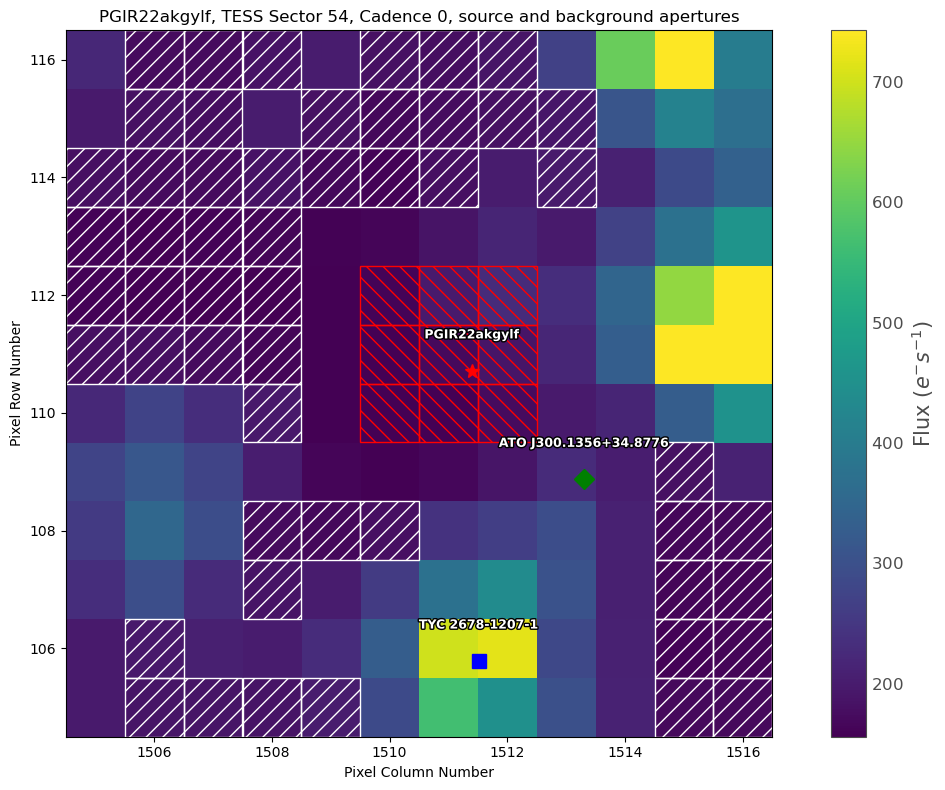

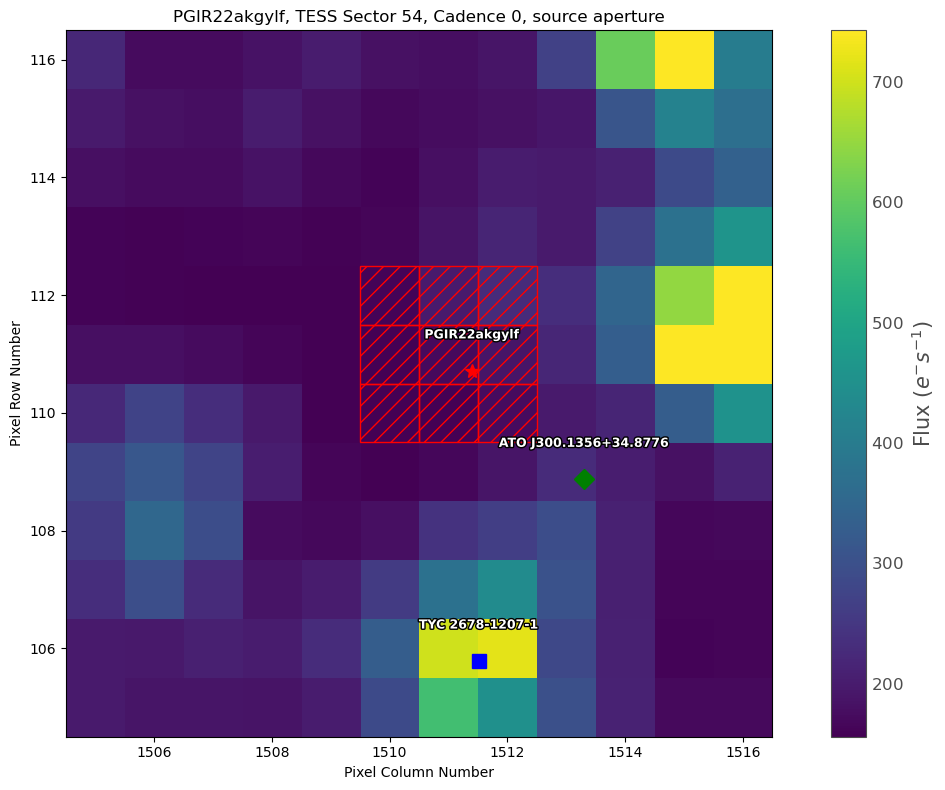

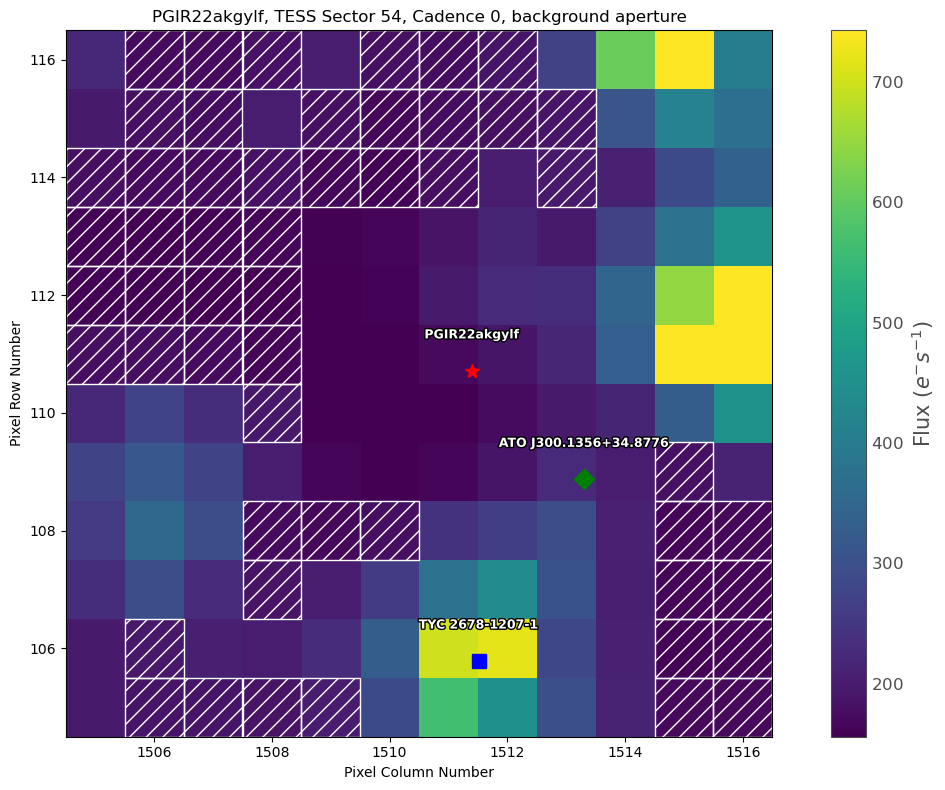

<Figure size 1000x600 with 0 Axes>

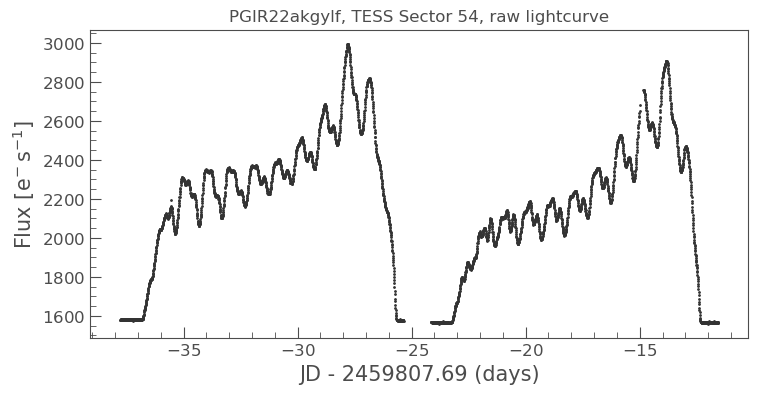

<Figure size 1000x600 with 0 Axes>

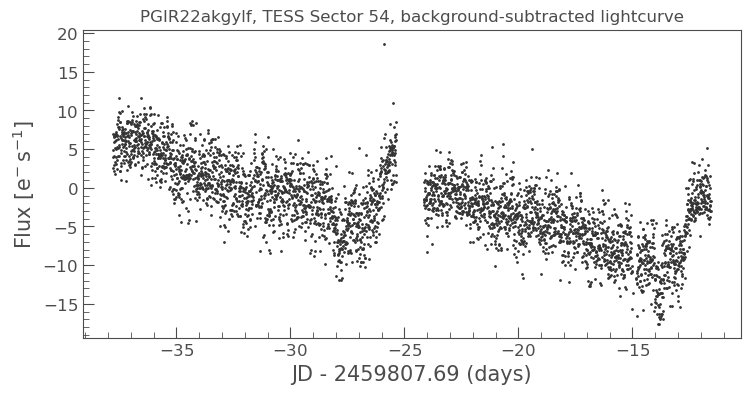

/tmp/ipykernel_2530919/3333624250.py:15: RuntimeWarning: invalid value encountered in log10
  mag = 20.44 - 2.5 * np.log10(flux)  # Convert flux to magnitude
/tmp/ipykernel_2530919/3333624250.py:16: RuntimeWarning: invalid value encountered in log10
  mag_err = -2.5 * np.log10((flux - flux_err) / flux)  # Calculate magnitude error


Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/pgir22akgylf_Sector54_lk_bcksub_fullTJDrange_mag.txt
Plotting magnitude lightcurve for PGIR22akgylf:
  - Data points: 3571
  - Time range: 2459769.909 to 2459796.124 JD
  - Magnitude range: nan to nan mag


<Figure size 1000x600 with 0 Axes>

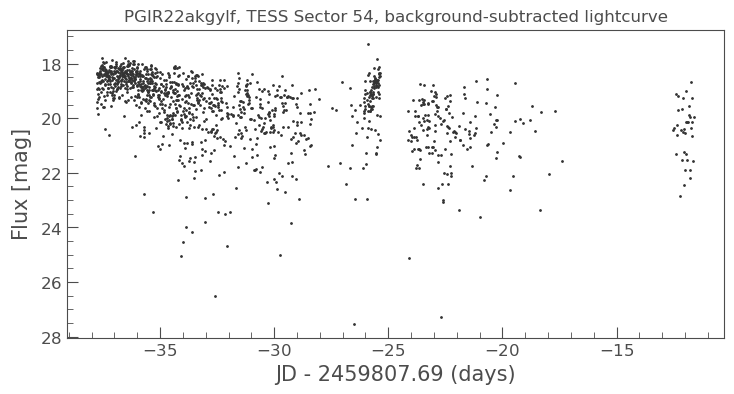

<Figure size 1000x600 with 0 Axes>

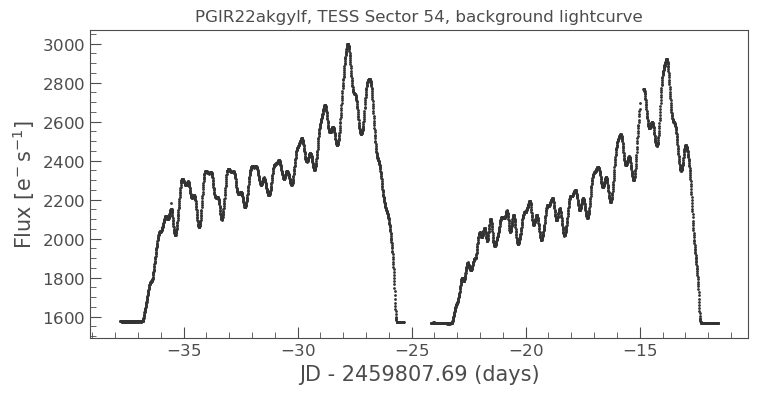

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

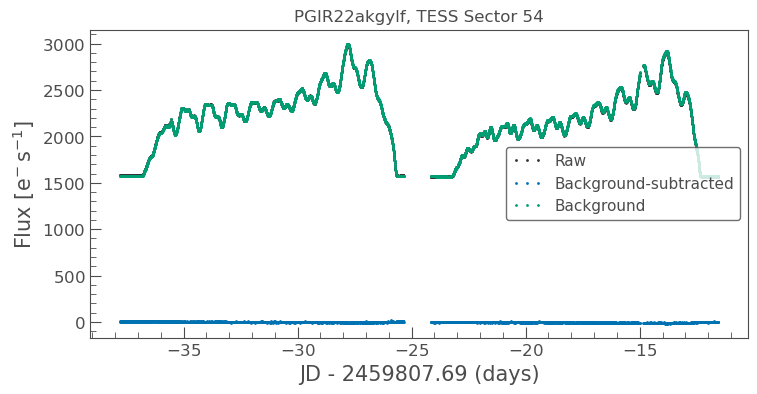

The simplified period analysis for the background-subtracted source lightcurve


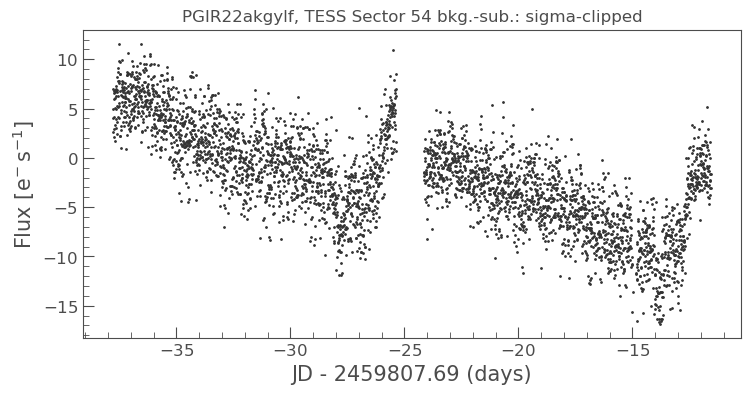

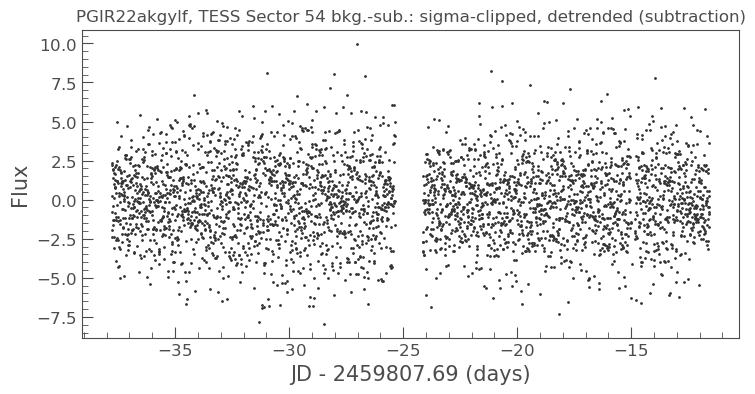

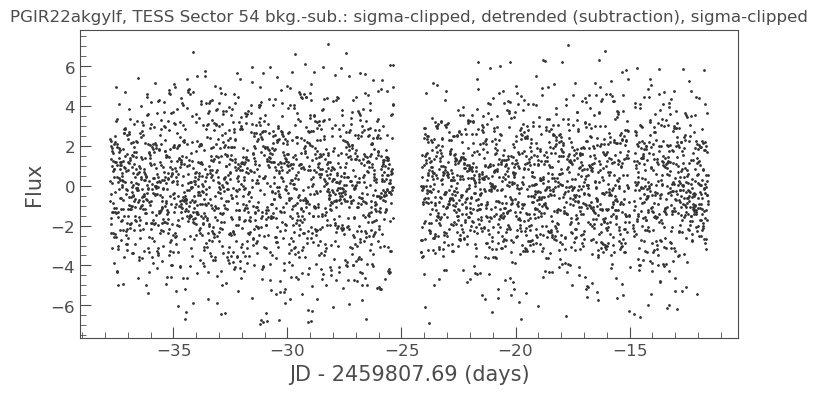

The best period is: 0.1987 d days


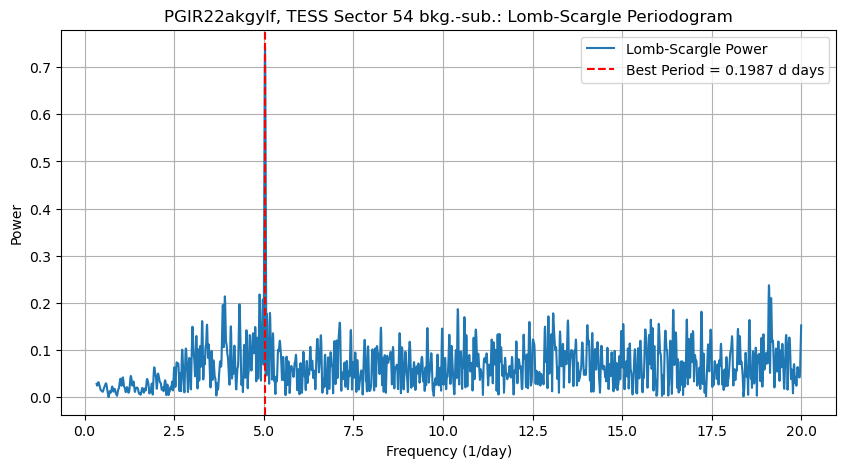

Fitted sine wave parameters:
  Amplitude: 0.741465
  Phase offset: -0.161609
  Vertical offset: -0.010834
  Phase of minimum: 0.588391
Light Elements:
  Period: 0.198695 d days
  JD0 (epoch of minimum): 2459770.025821


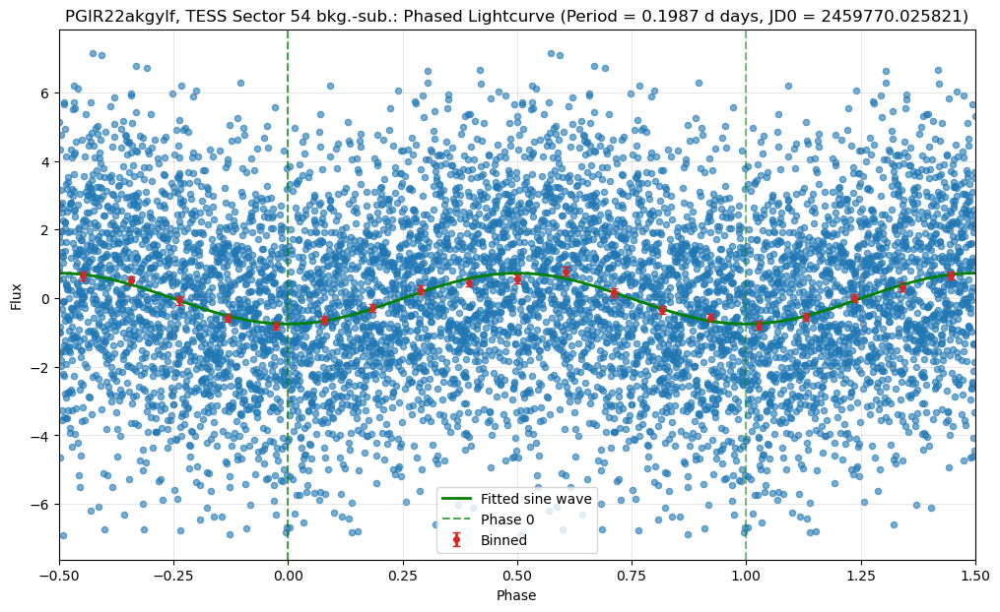

The simplified period analysis for the background lightcurve


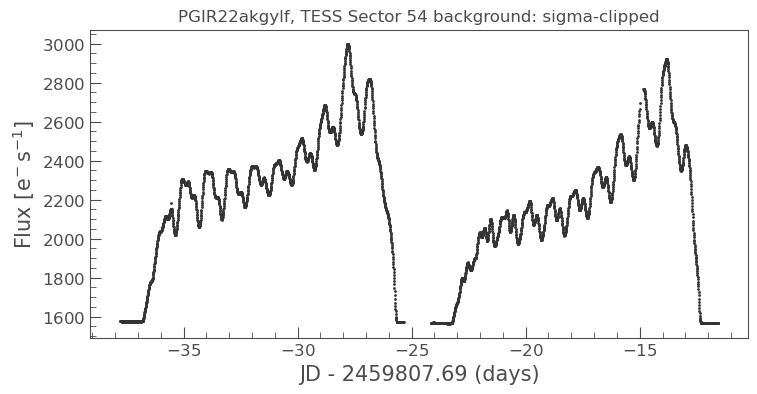

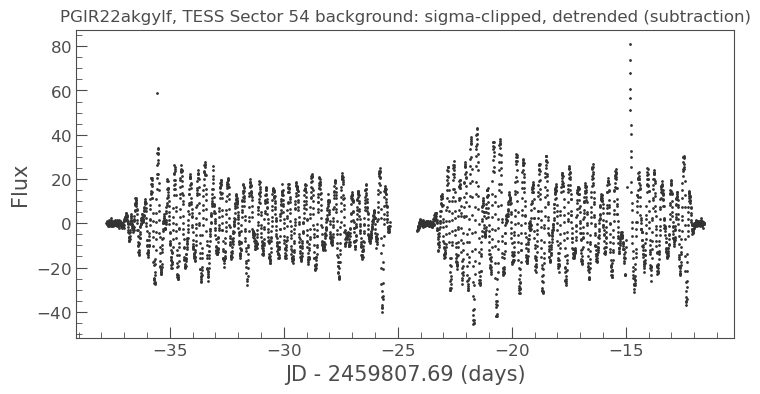

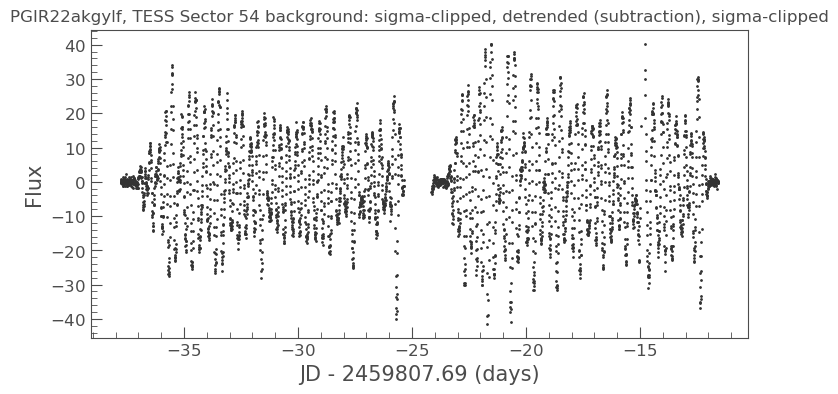

The best period is: 0.3329 d days


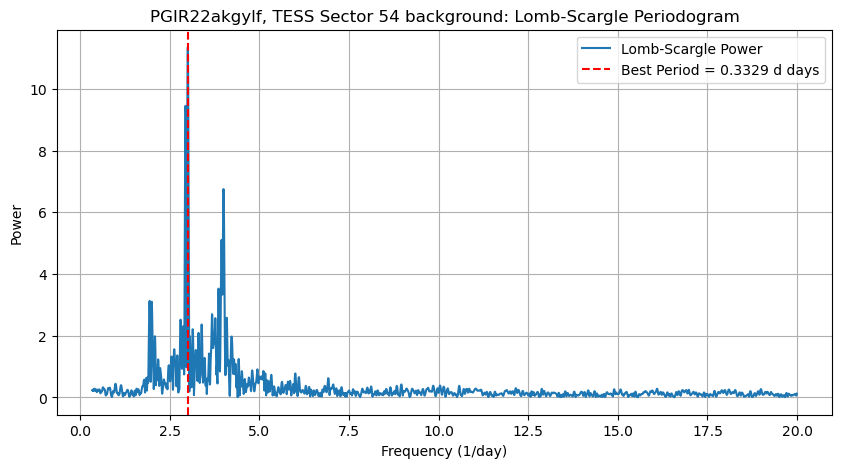

Fitted sine wave parameters:
  Amplitude: 11.350850
  Phase offset: -0.231948
  Vertical offset: -0.110173
  Phase of minimum: 0.518052
Light Elements:
  Period: 0.332944 d days
  JD0 (epoch of minimum): 2459770.081393


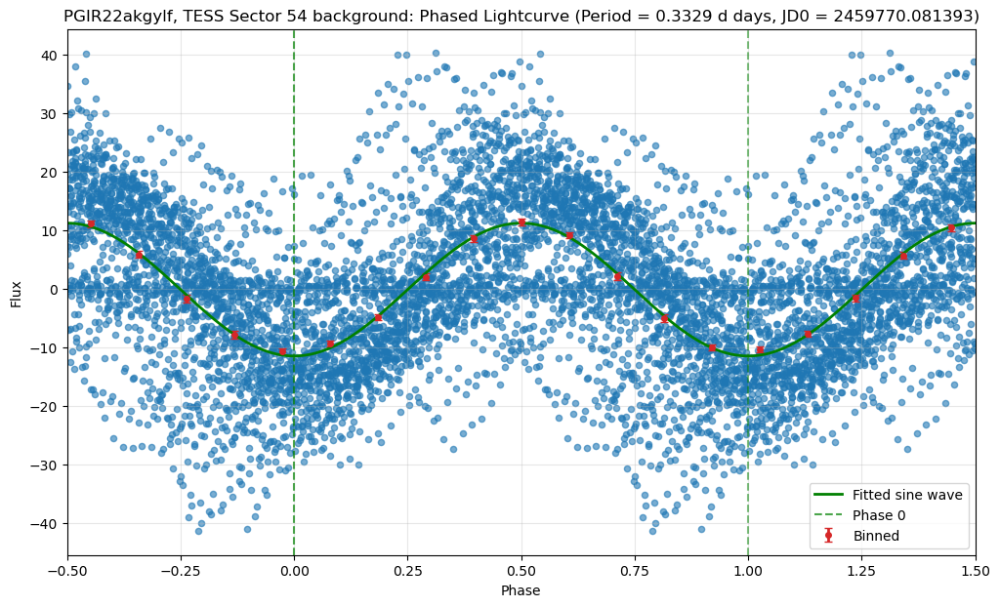

In [11]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[2].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name)

### Sector 74 - post-eruption 1

Cadence 0 was obtained at time: 3312.863541 TJD (2024-01-03T08:43:29.929)


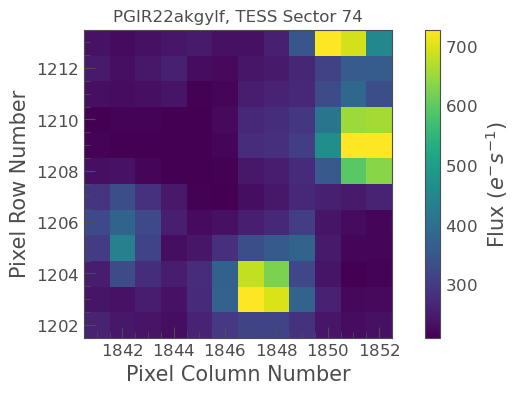

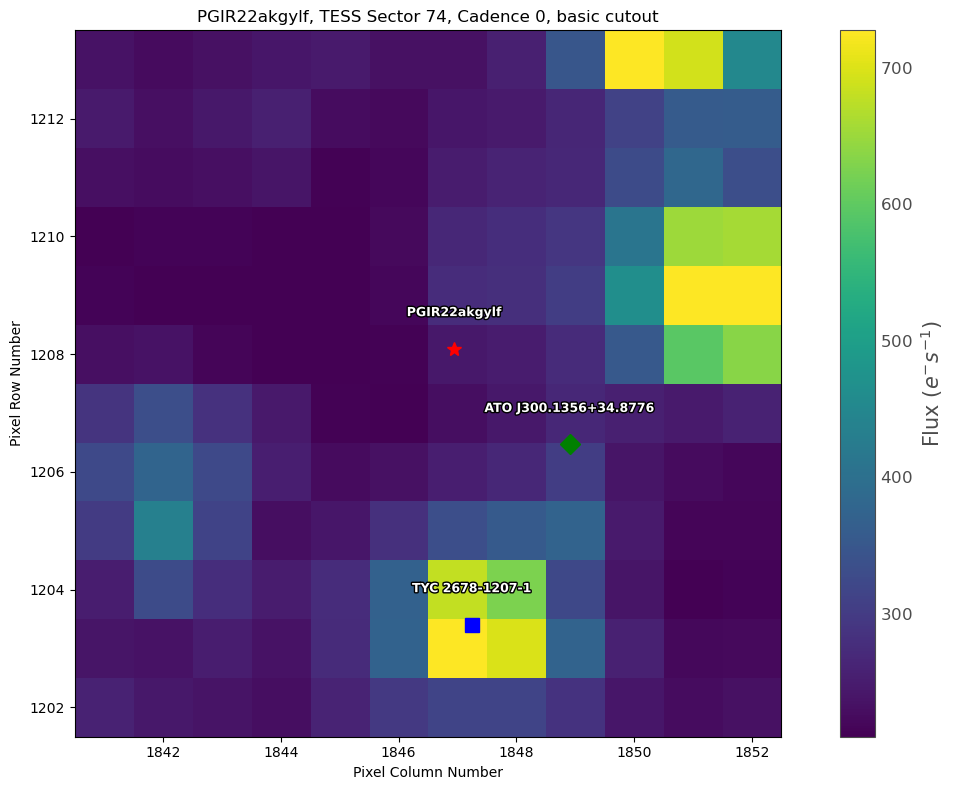

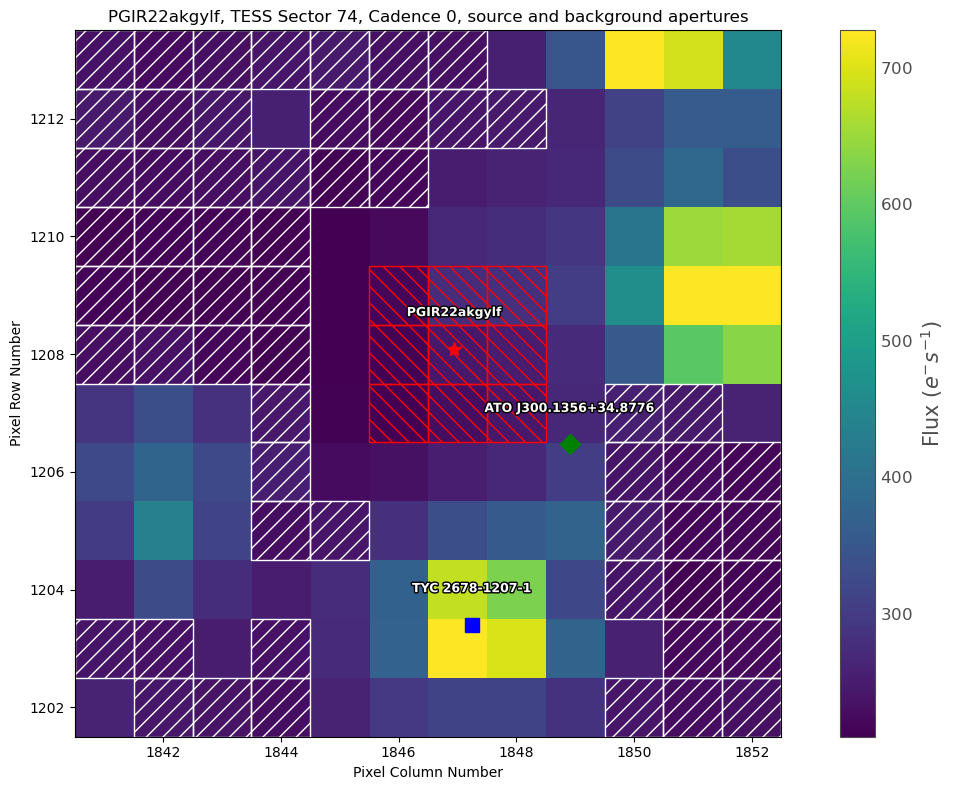

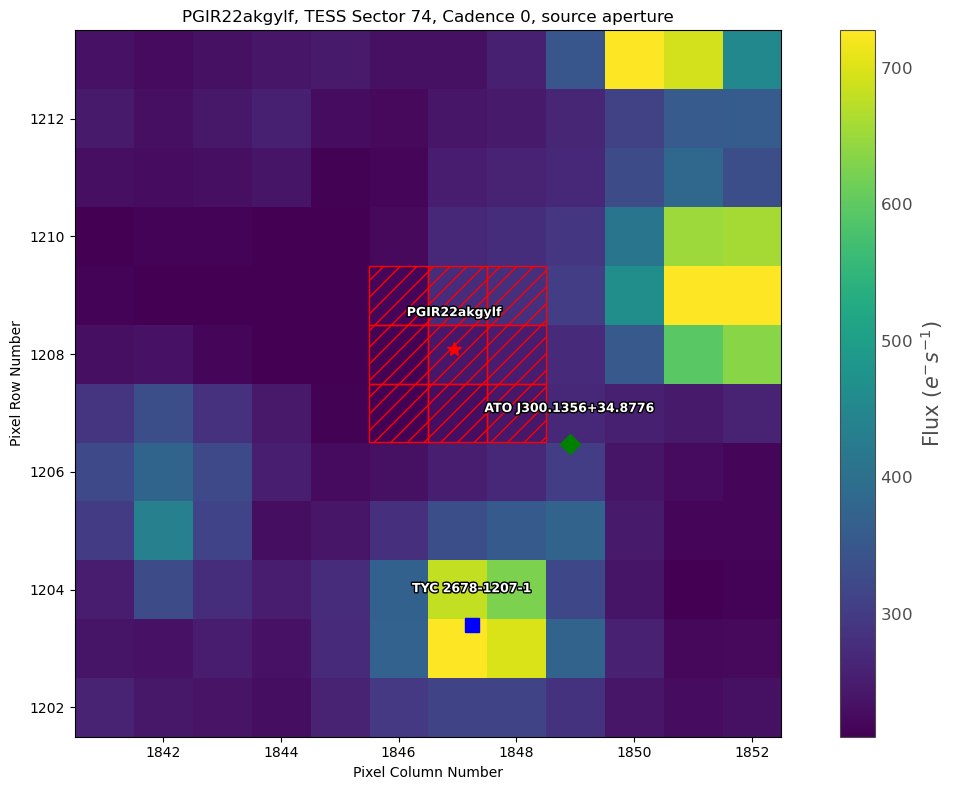

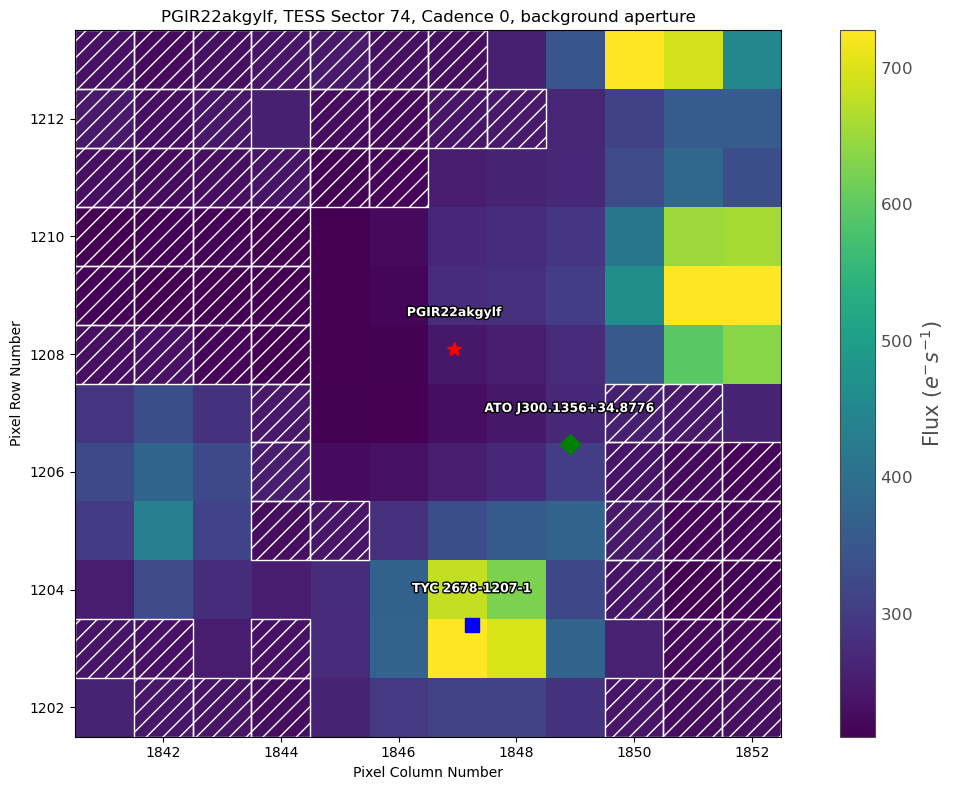

<Figure size 1000x600 with 0 Axes>

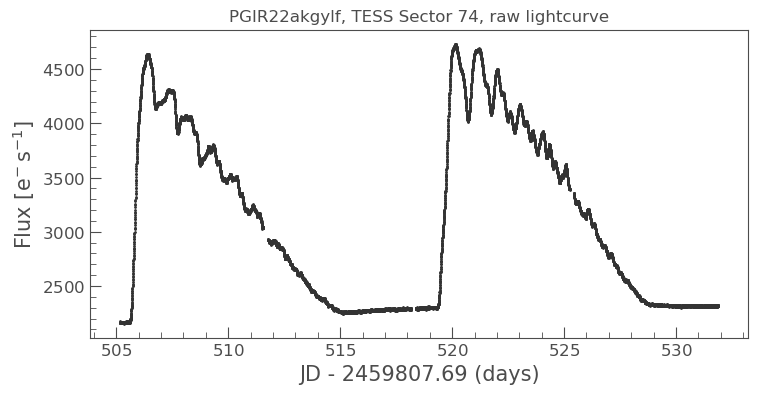

<Figure size 1000x600 with 0 Axes>

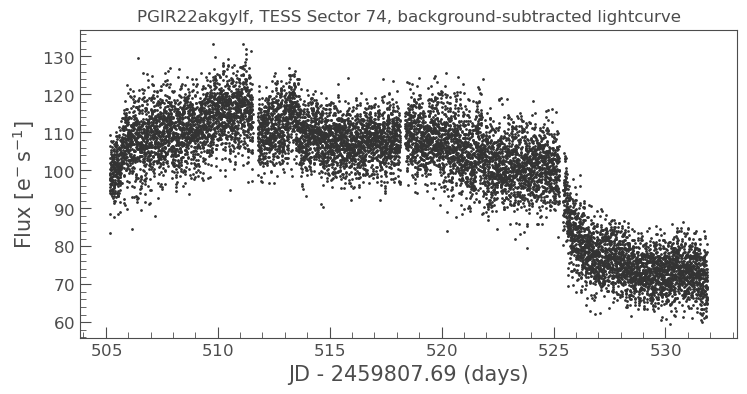

Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/pgir22akgylf_Sector74_lk_bcksub_fullTJDrange_mag.txt
Plotting magnitude lightcurve for PGIR22akgylf:
  - Data points: 11268
  - Time range: 2460312.864 to 2460339.565 JD
  - Magnitude range: 15.127 to 16.002 mag


<Figure size 1000x600 with 0 Axes>

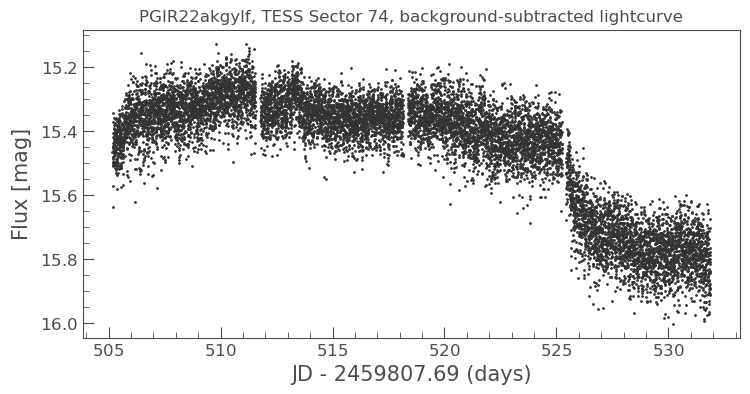

<Figure size 1000x600 with 0 Axes>

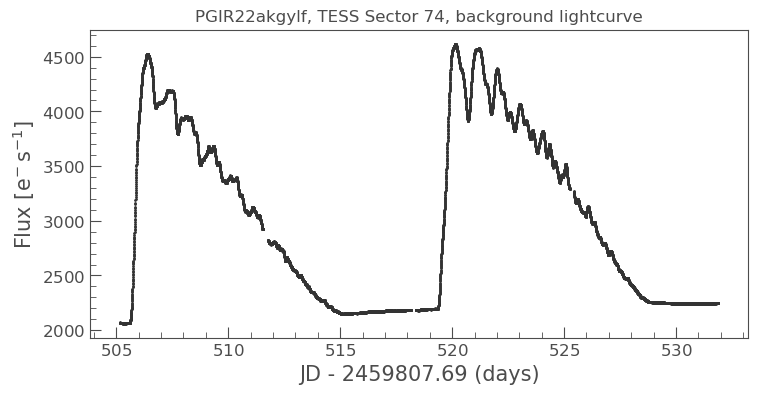

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

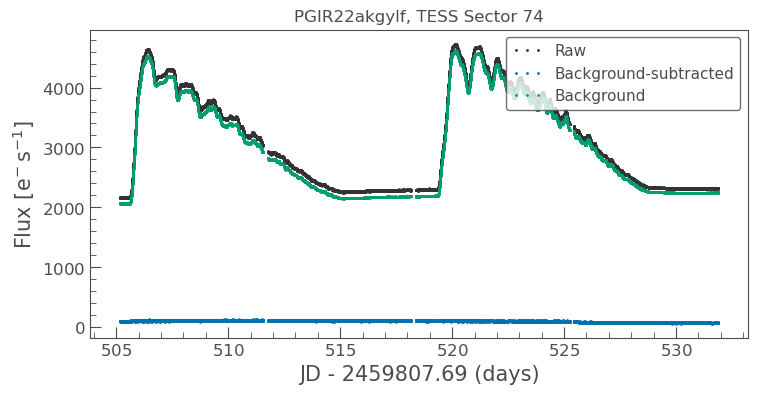

The simplified period analysis for the background-subtracted source lightcurve


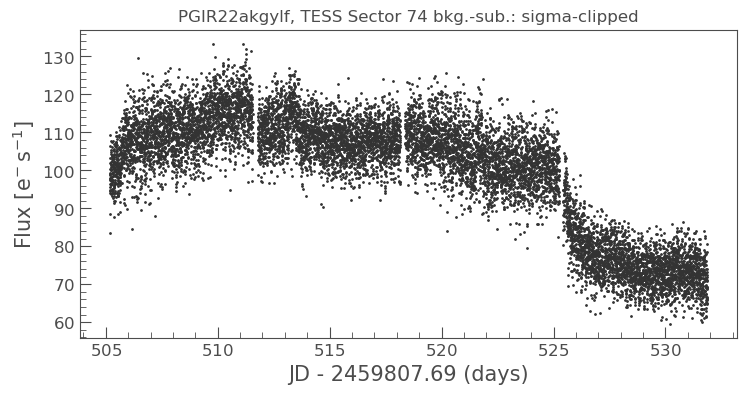

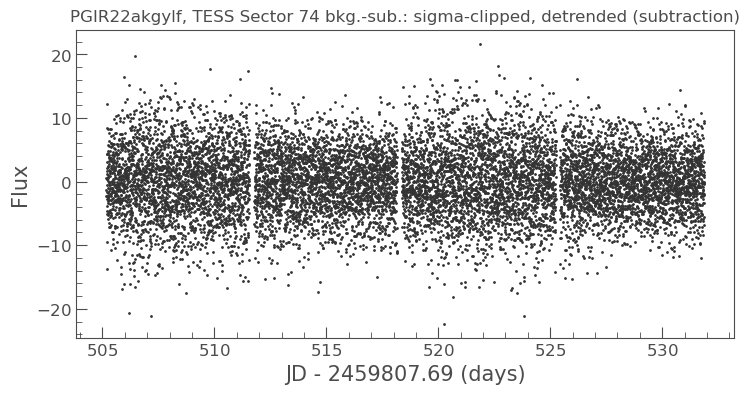

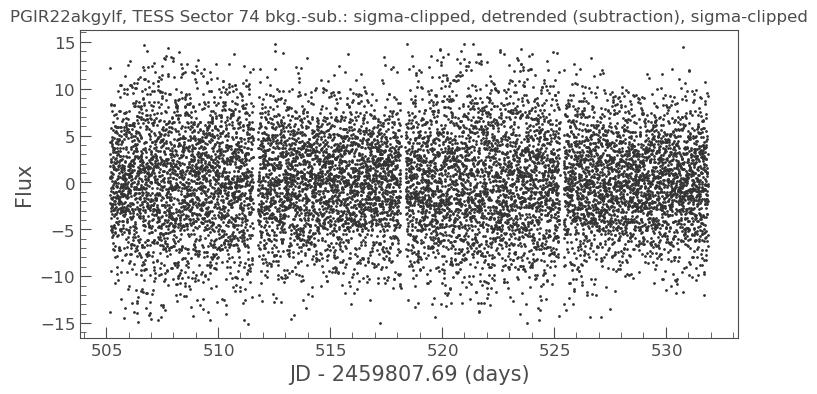

The best period is: 0.0854 d days


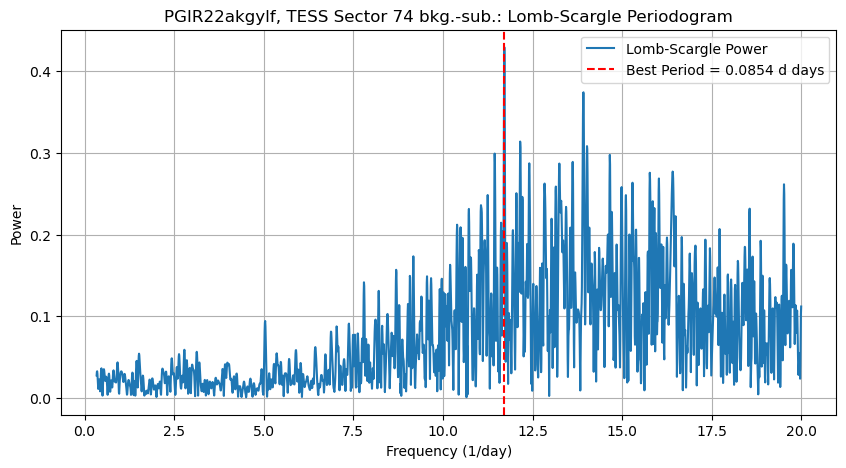

Fitted sine wave parameters:
  Amplitude: 0.428439
  Phase offset: -0.090307
  Vertical offset: 0.024257
  Phase of minimum: 0.659693
Light Elements:
  Period: 0.085389 d days
  JD0 (epoch of minimum): 2460312.919871


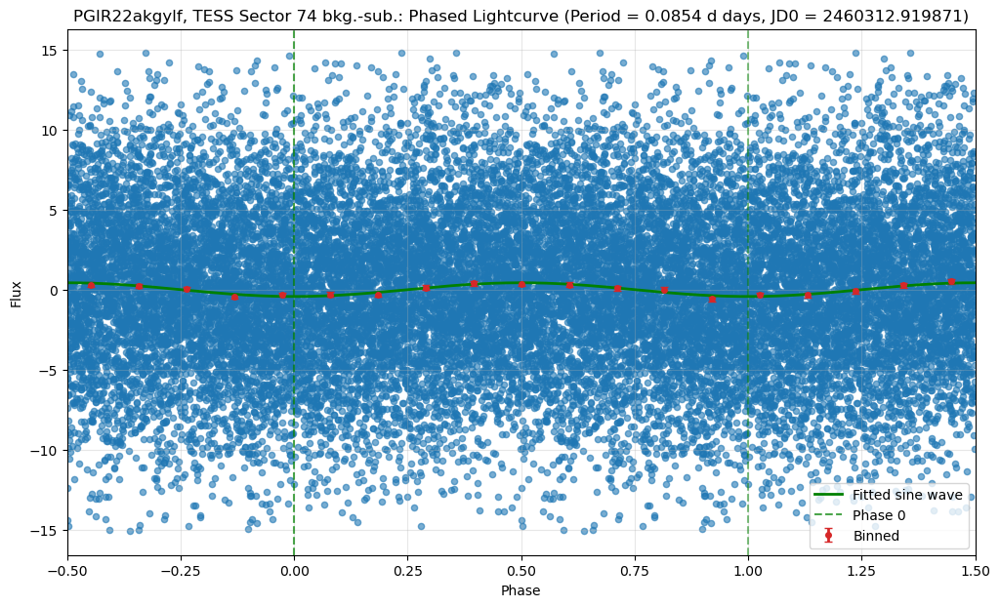

The simplified period analysis for the background lightcurve


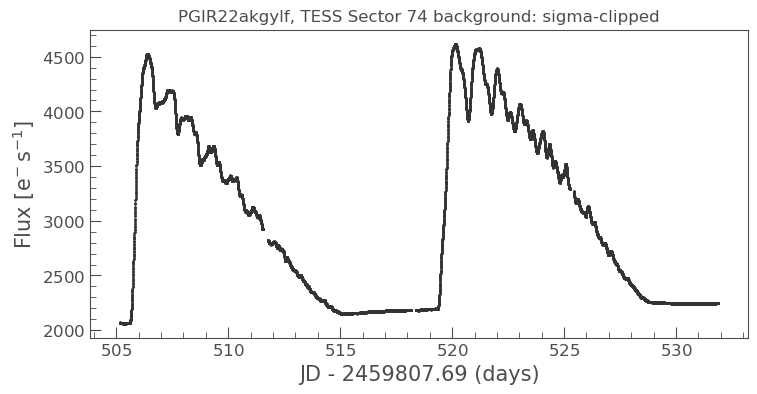

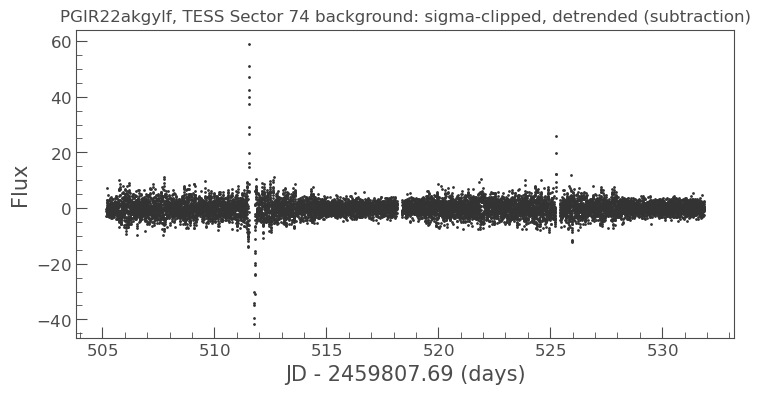

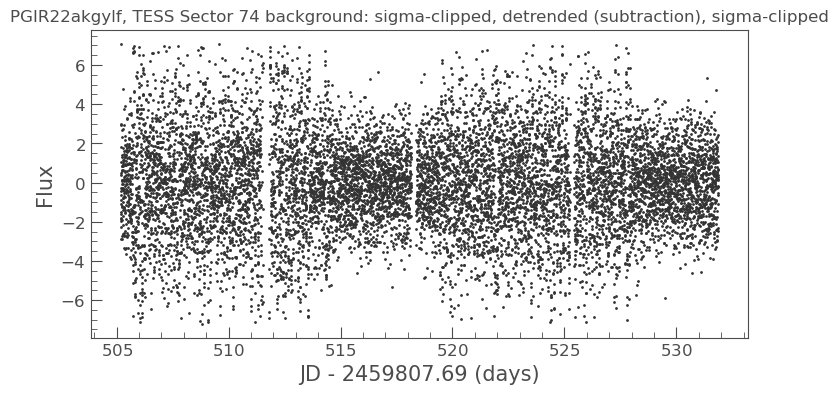

The best period is: 0.1130 d days


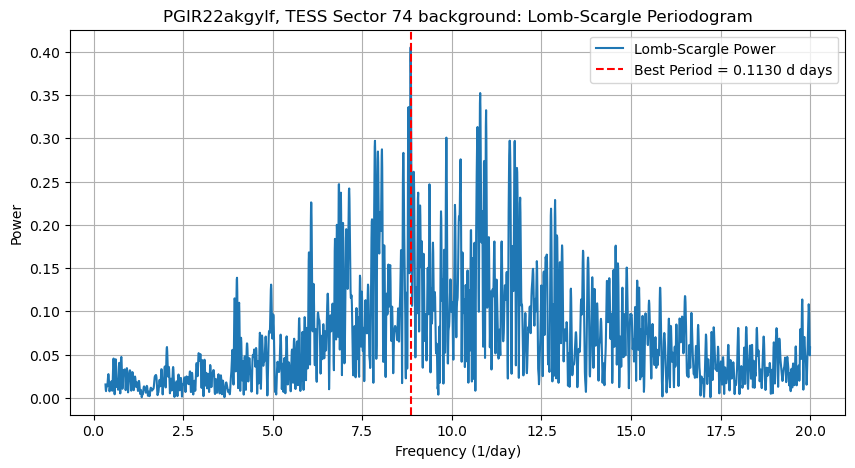

Fitted sine wave parameters:
  Amplitude: 0.405308
  Phase offset: -0.129929
  Vertical offset: -0.021025
  Phase of minimum: 0.120071
Light Elements:
  Period: 0.112996 d days
  JD0 (epoch of minimum): 2460312.877108


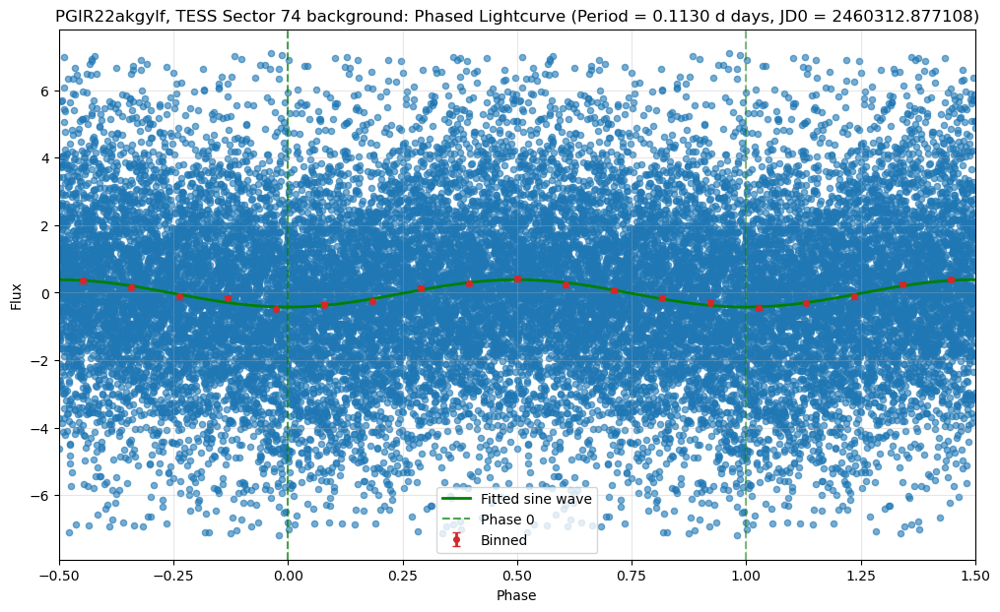

In [12]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[4].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name)

### Sector 75 - post-eruption 2

Cadence 0 was obtained at time: 3339.782211 TJD (2024-01-30T06:46:23.010)


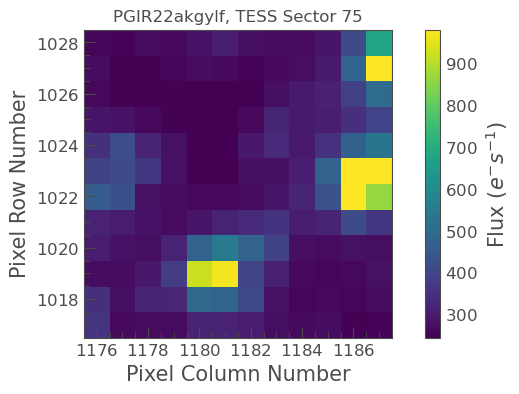

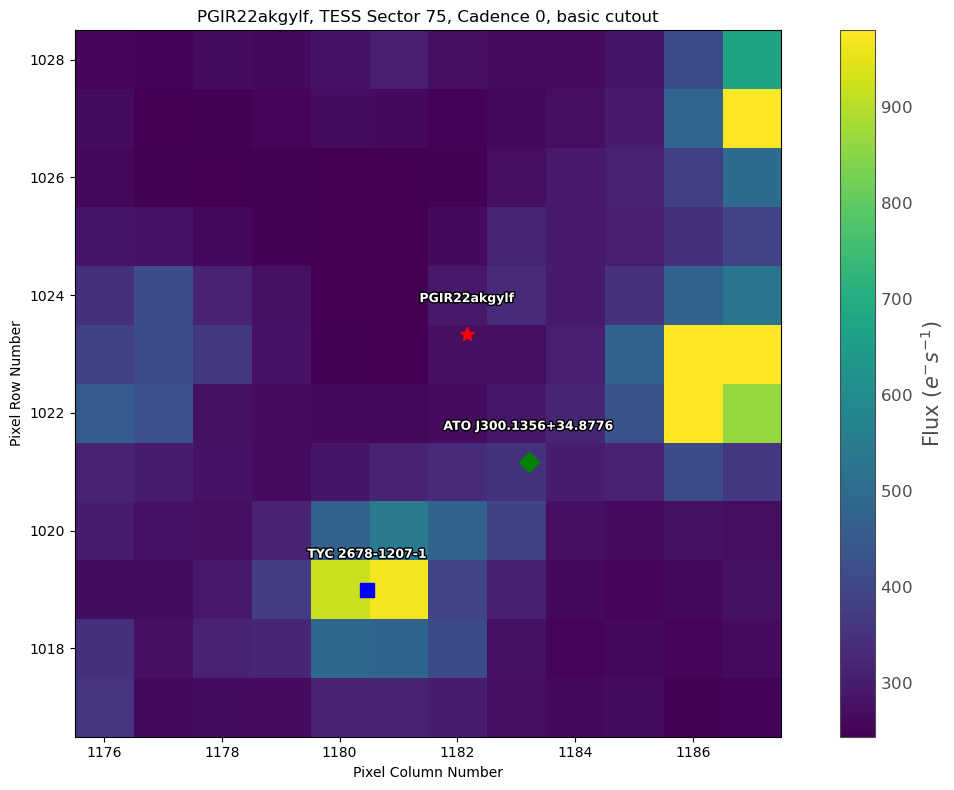

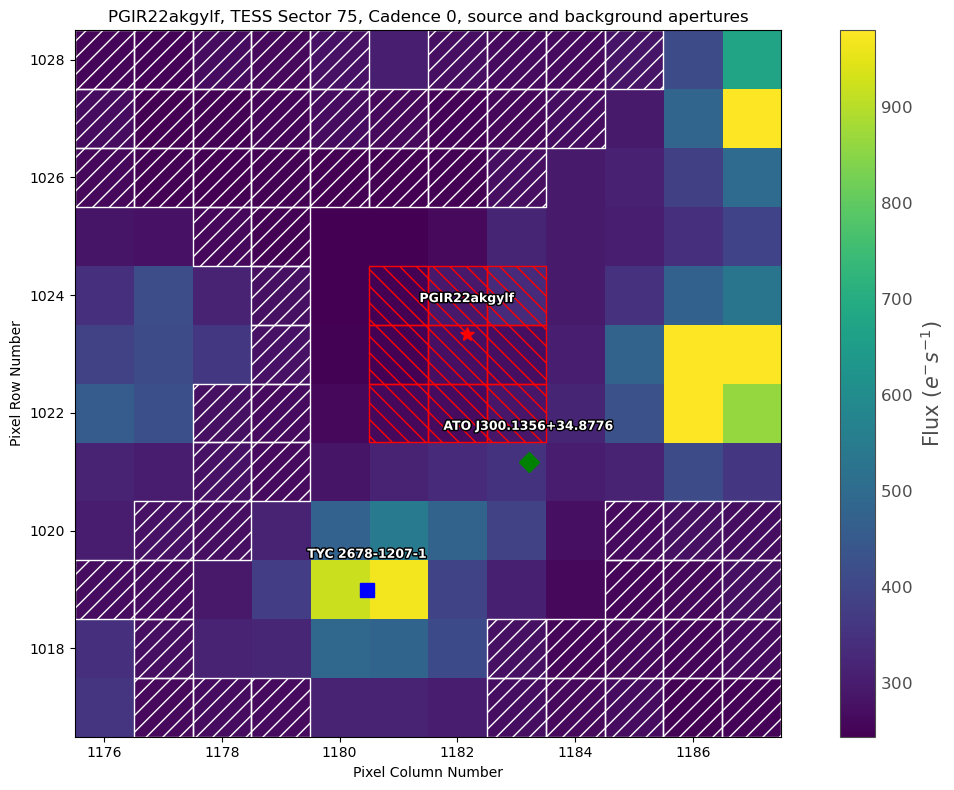

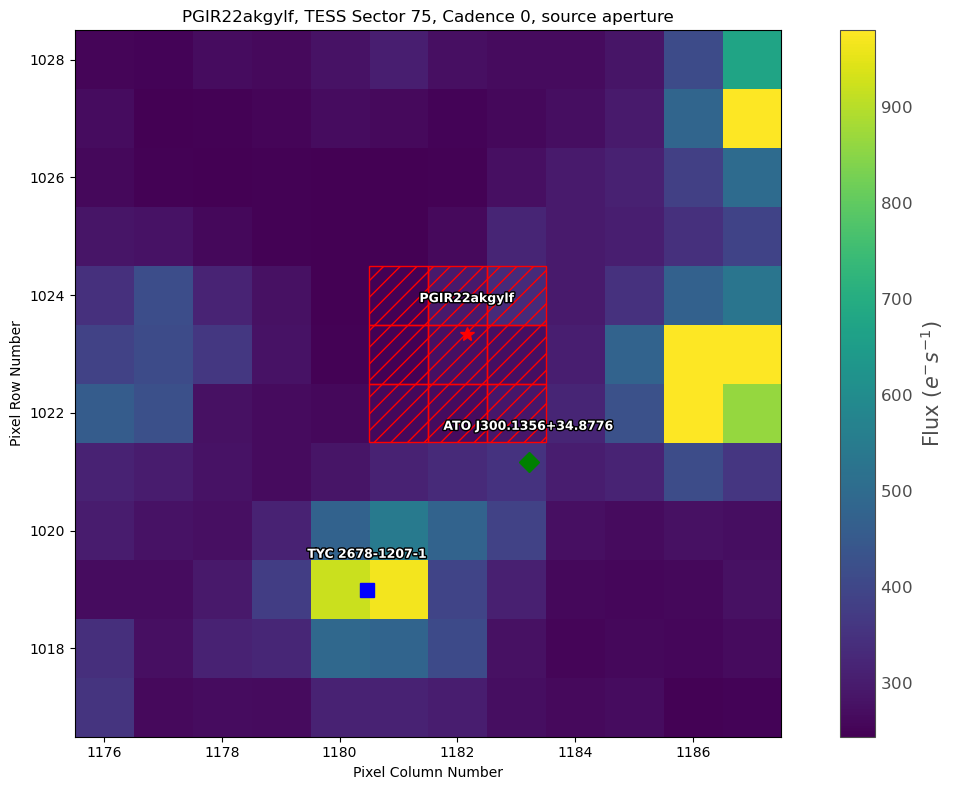

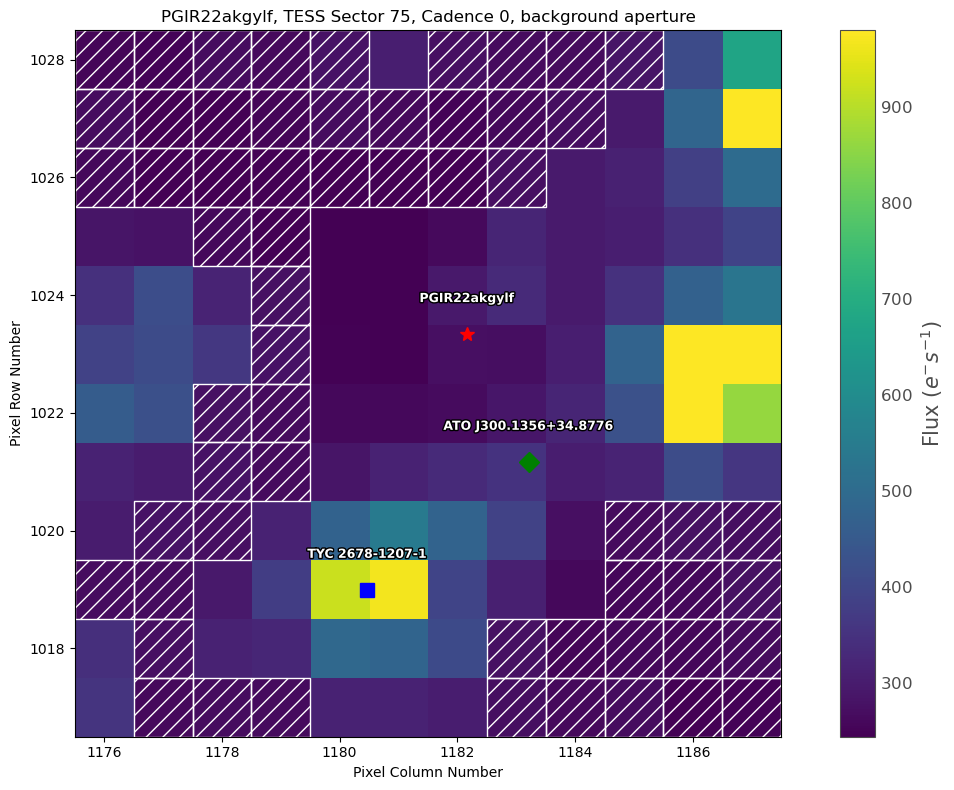

<Figure size 1000x600 with 0 Axes>

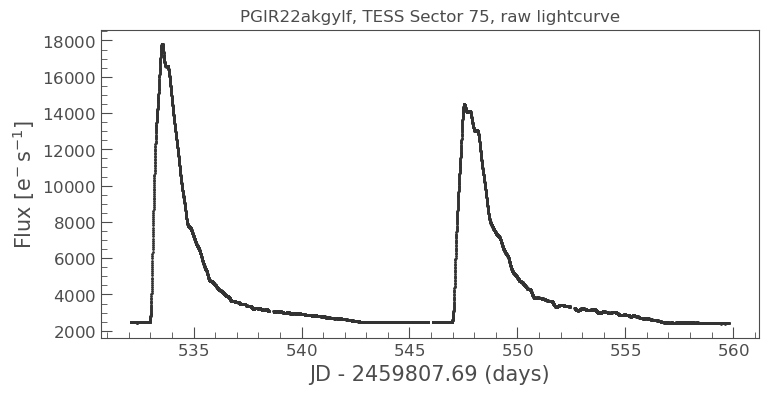

<Figure size 1000x600 with 0 Axes>

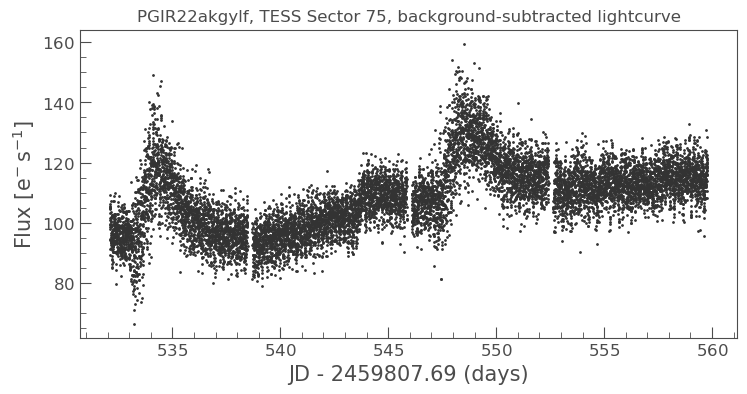

Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/pgir22akgylf_Sector75_lk_bcksub_fullTJDrange_mag.txt
Plotting magnitude lightcurve for PGIR22akgylf:
  - Data points: 11678
  - Time range: 2460339.782 to 2460367.477 JD
  - Magnitude range: 14.933 to 15.883 mag


<Figure size 1000x600 with 0 Axes>

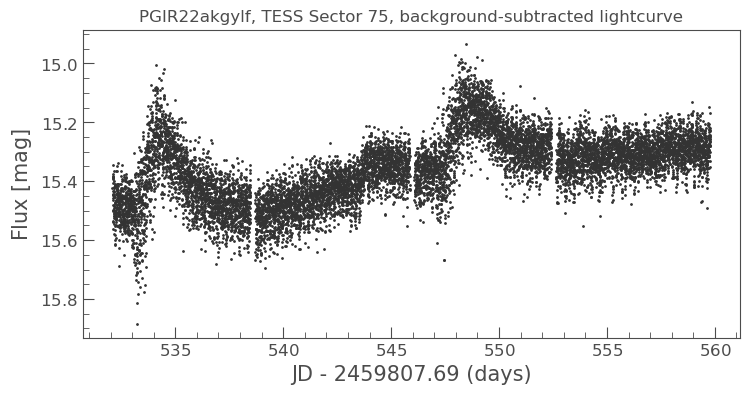

<Figure size 1000x600 with 0 Axes>

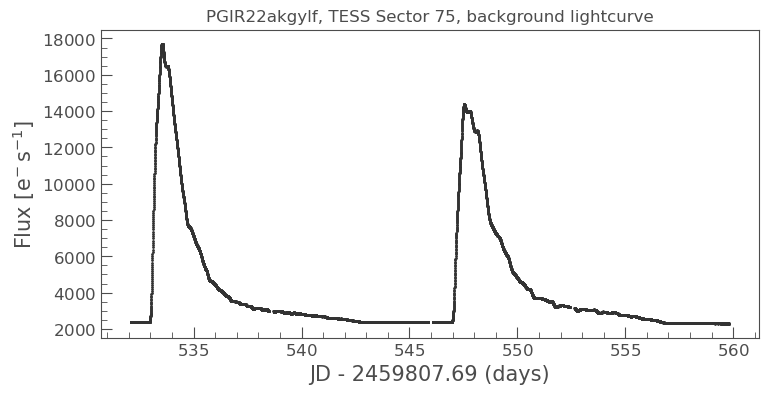

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

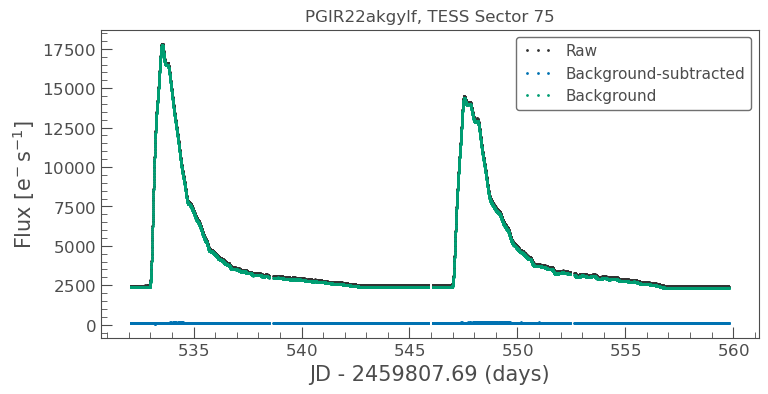

The simplified period analysis for the background-subtracted source lightcurve


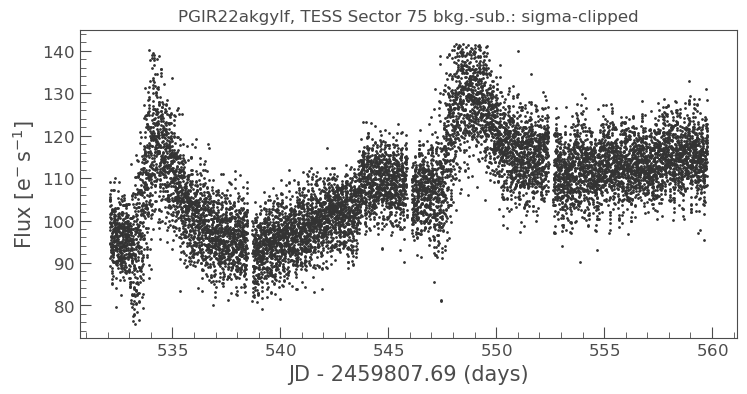

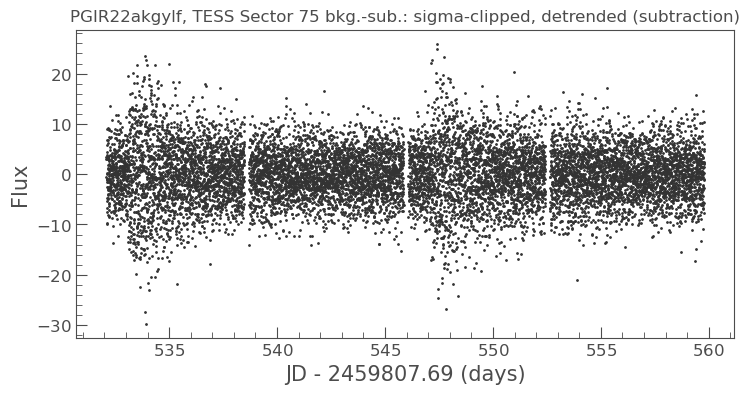

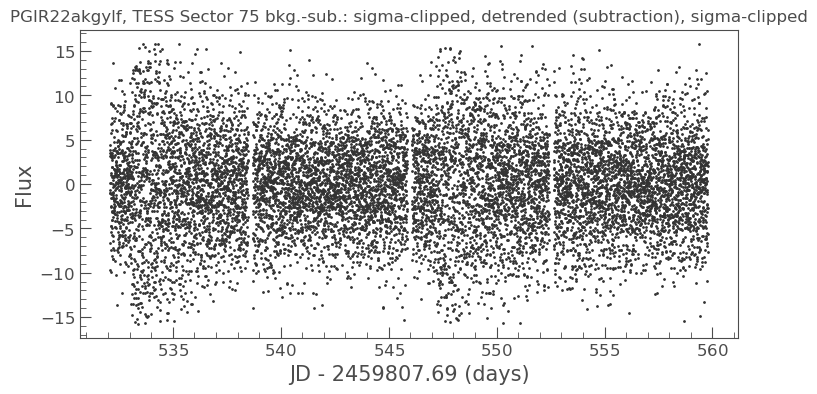

The best period is: 0.0794 d days


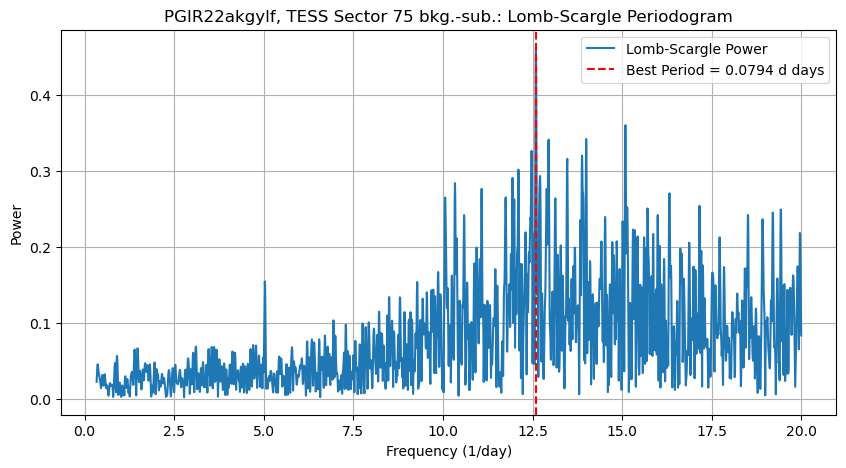

Fitted sine wave parameters:
  Amplitude: 0.461476
  Phase offset: 0.046804
  Vertical offset: -0.002188
  Phase of minimum: 0.296804
Light Elements:
  Period: 0.079393 d days
  JD0 (epoch of minimum): 2460339.805775


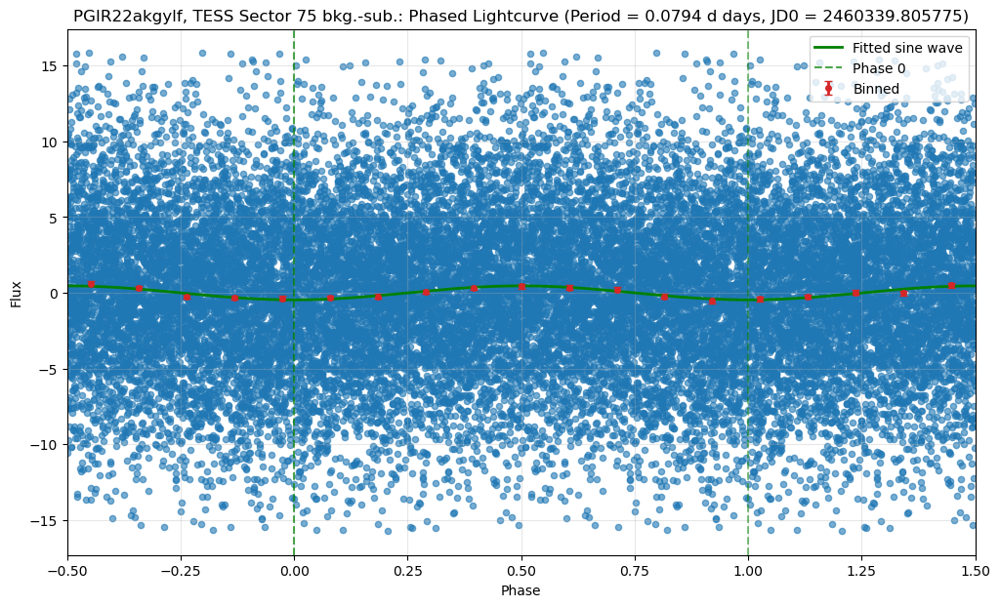

The simplified period analysis for the background lightcurve


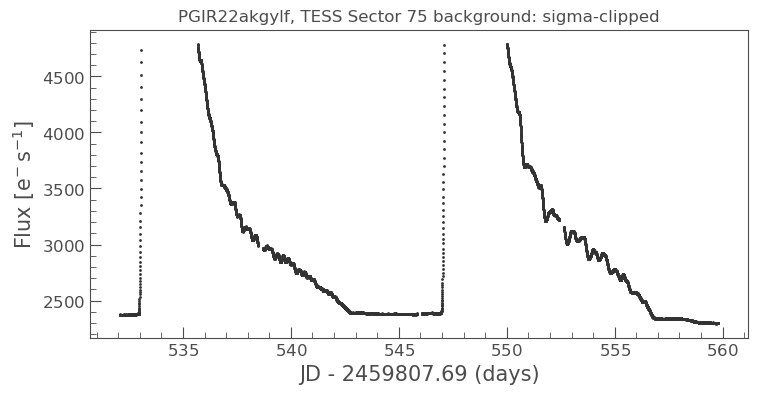

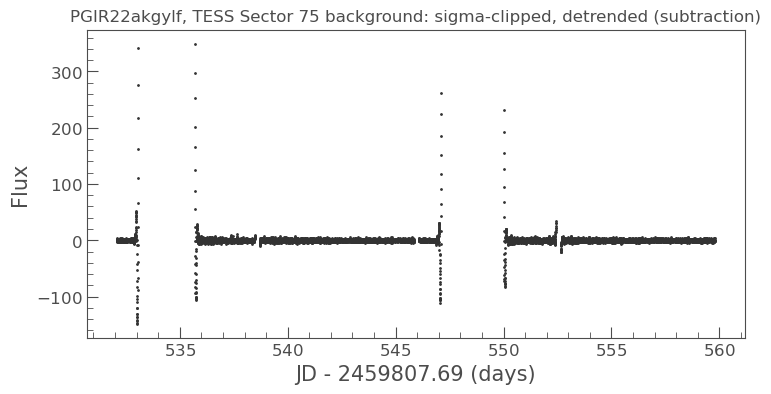

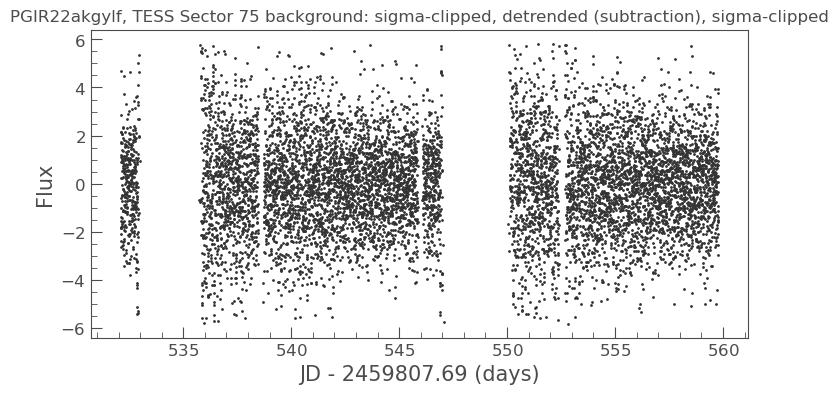

The best period is: 0.0936 d days


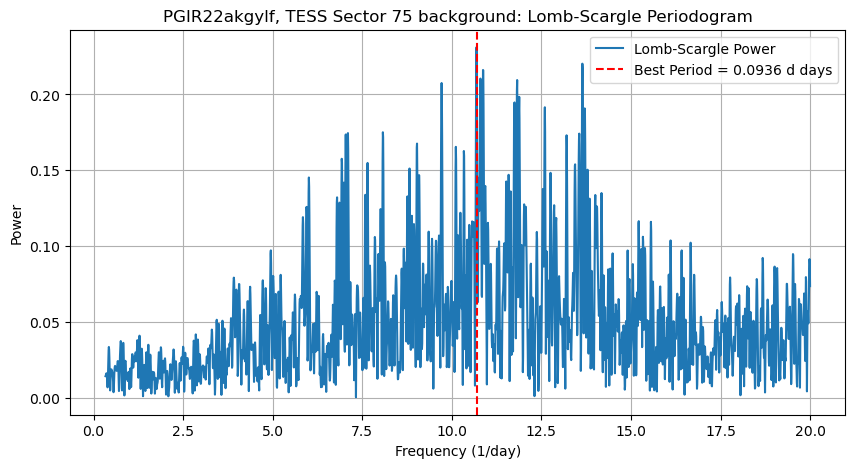

Fitted sine wave parameters:
  Amplitude: 0.230982
  Phase offset: 0.174260
  Vertical offset: -0.011652
  Phase of minimum: 0.424260
Light Elements:
  Period: 0.093553 d days
  JD0 (epoch of minimum): 2460339.821902


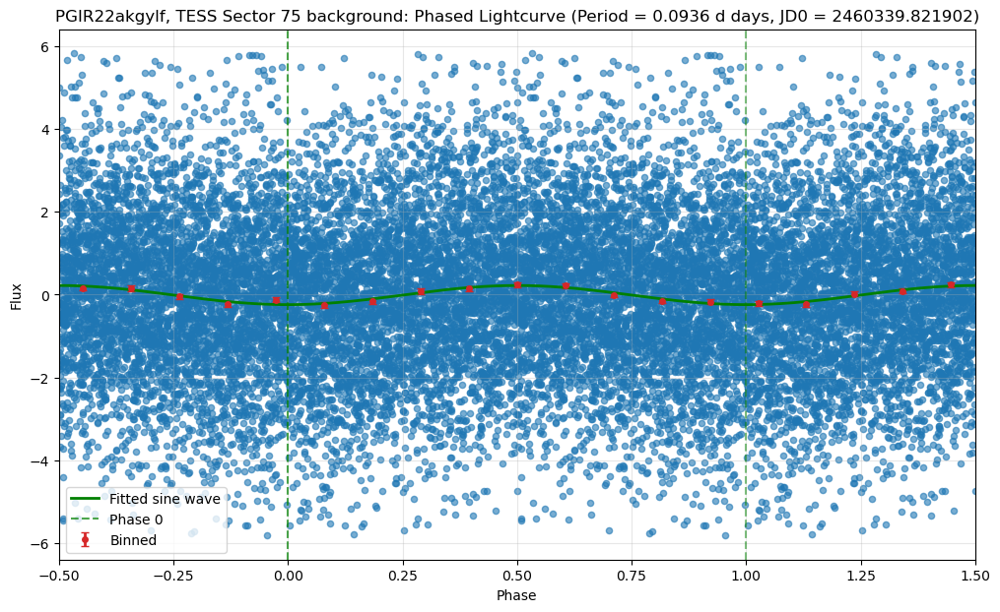

In [13]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[5].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name)

### Sector 81 - post-eruption 3

Cadence 0 was obtained at time: 3506.558512 TJD (2024-07-15T01:24:15.448)


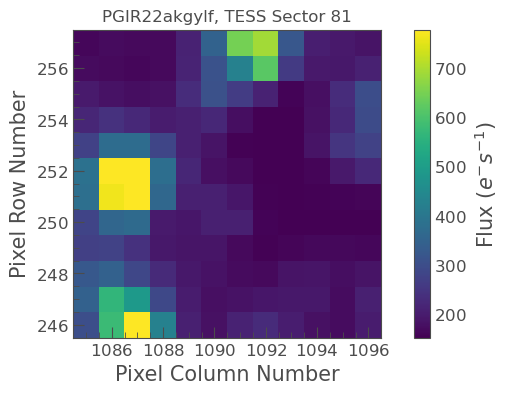

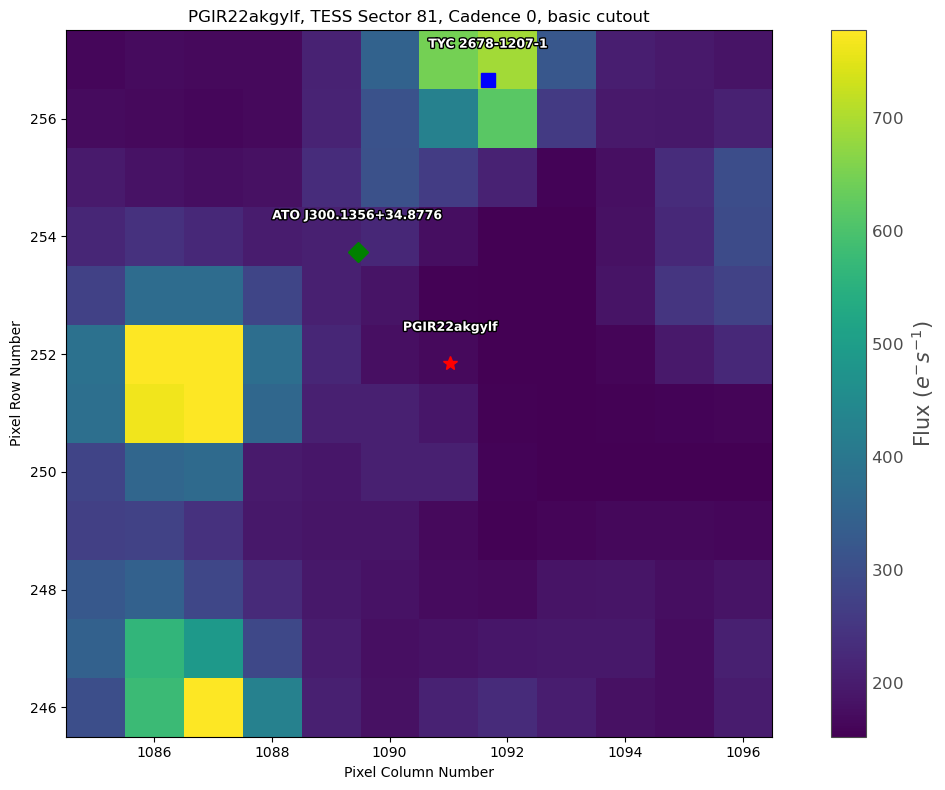

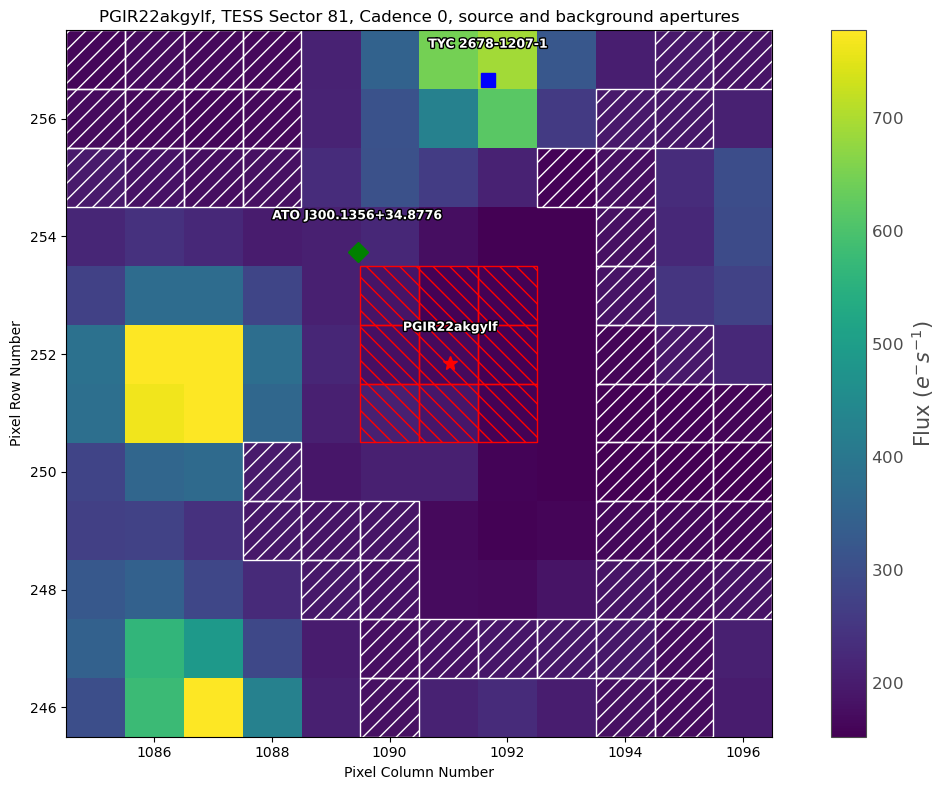

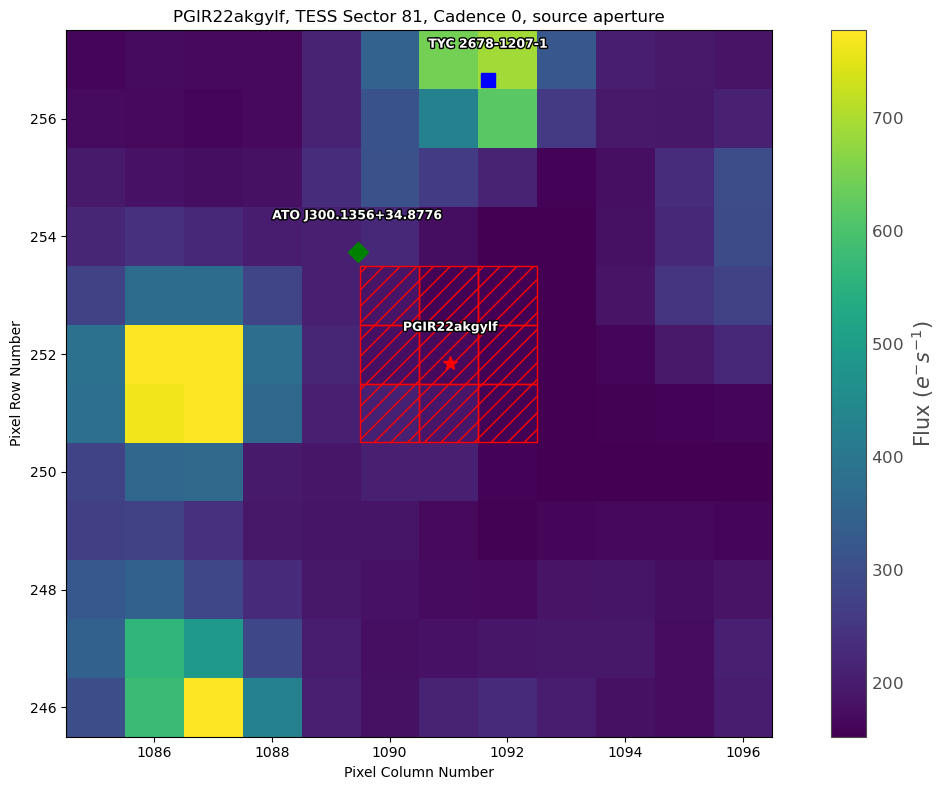

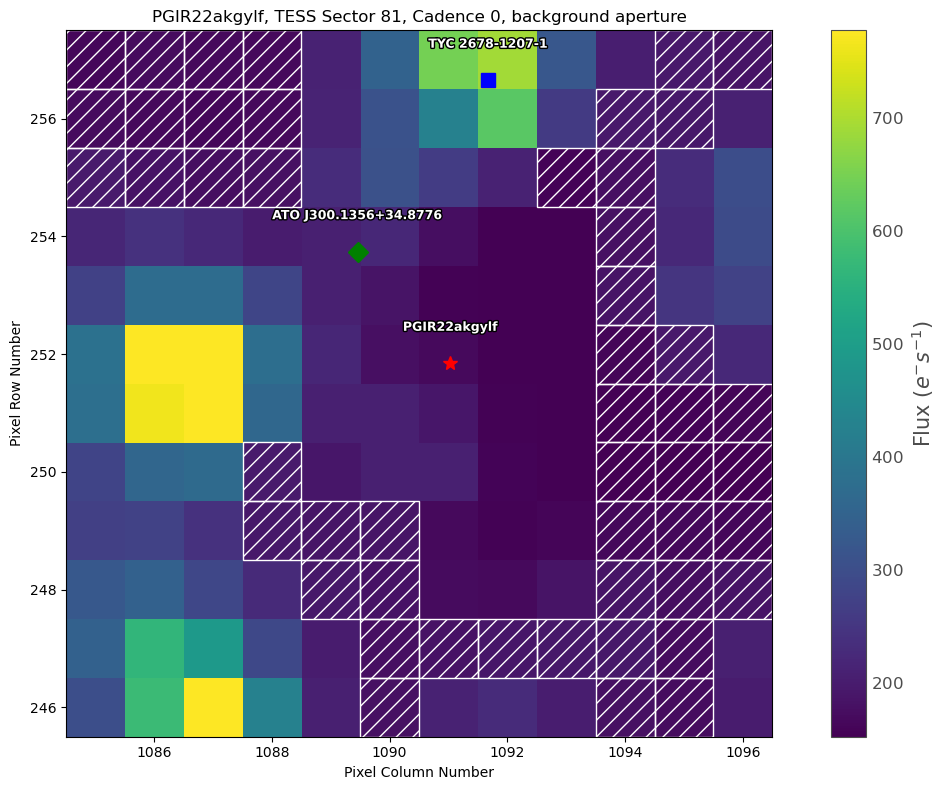

<Figure size 1000x600 with 0 Axes>

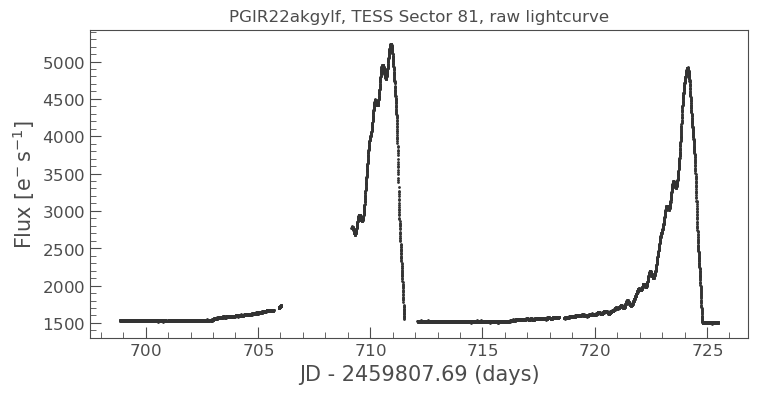

<Figure size 1000x600 with 0 Axes>

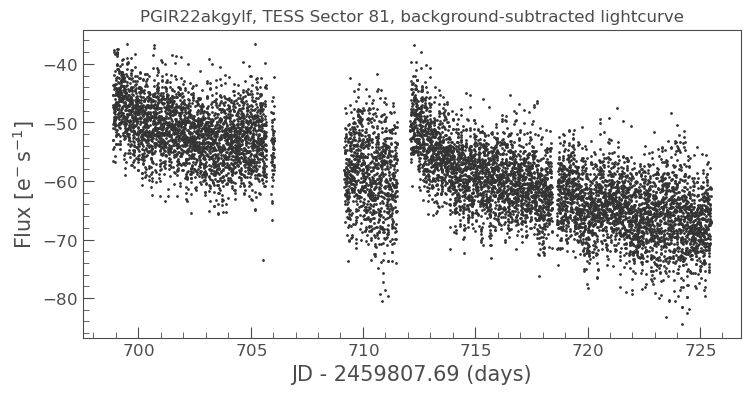

/tmp/ipykernel_2530919/3333624250.py:15: RuntimeWarning: invalid value encountered in log10
  mag = 20.44 - 2.5 * np.log10(flux)  # Convert flux to magnitude


Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/pgir22akgylf_Sector81_lk_bcksub_fullTJDrange_mag.txt
Plotting magnitude lightcurve for PGIR22akgylf:
  - Data points: 9684
  - Time range: 2460506.559 to 2460533.179 JD
  - Magnitude range: nan to nan mag


<Figure size 1000x600 with 0 Axes>

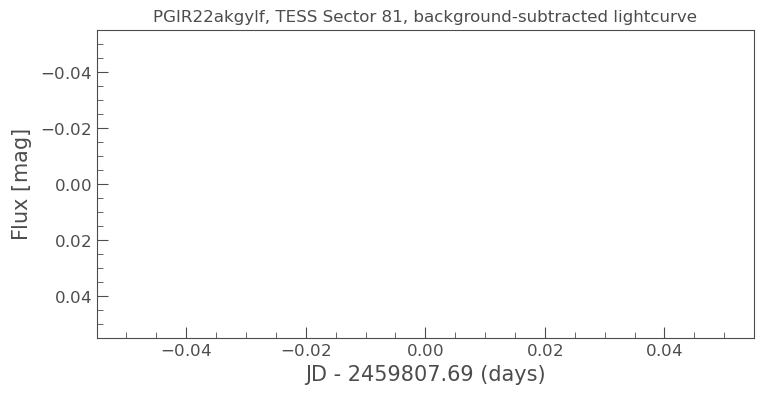

<Figure size 1000x600 with 0 Axes>

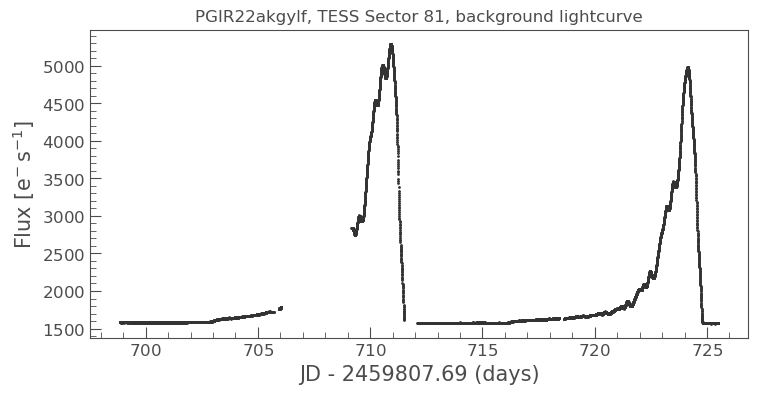

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

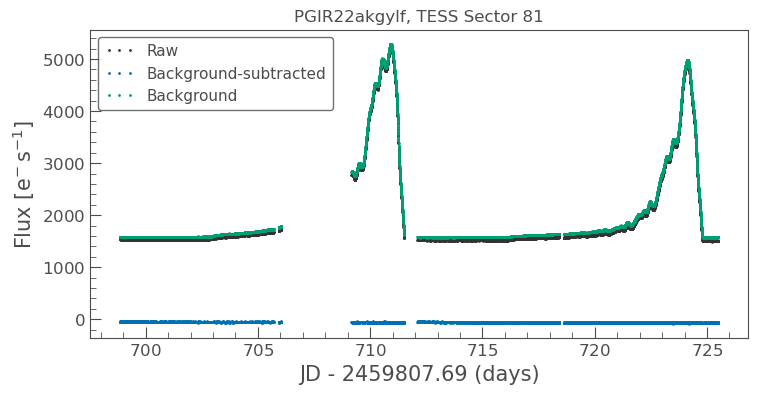

The simplified period analysis for the background-subtracted source lightcurve


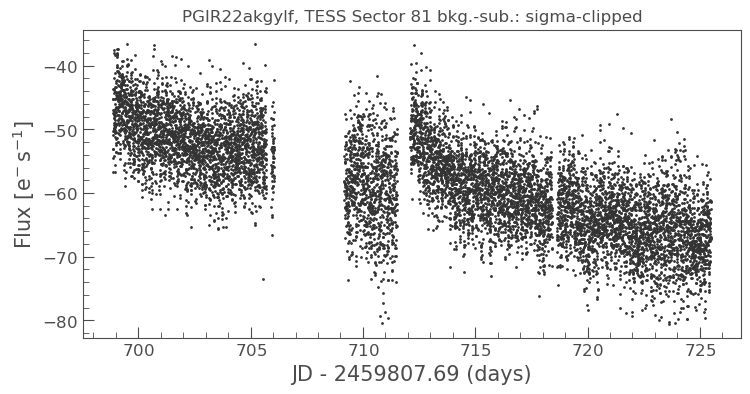

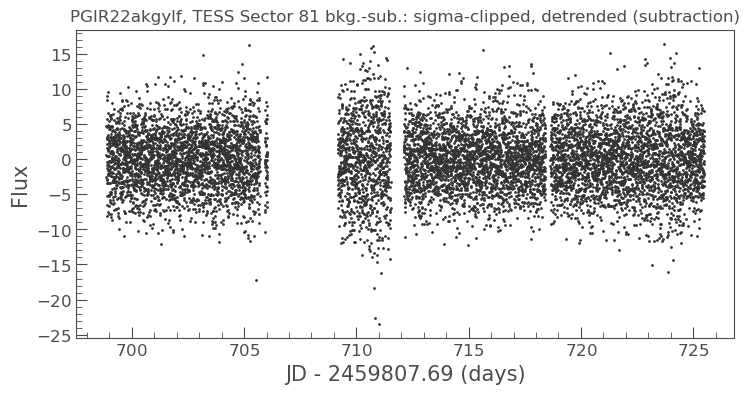

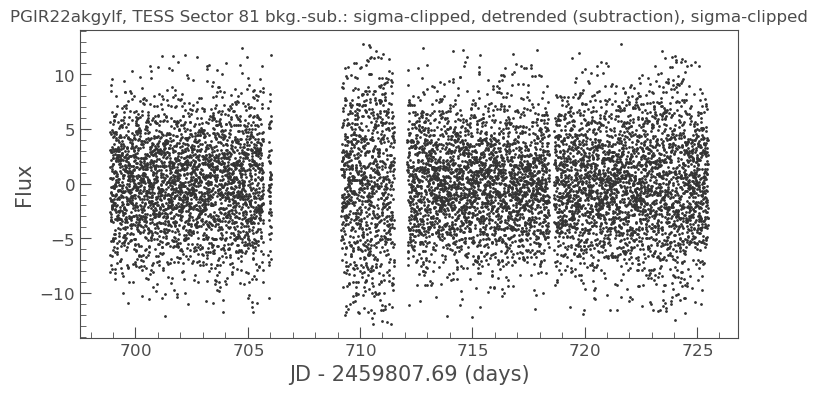

The best period is: 0.0601 d days


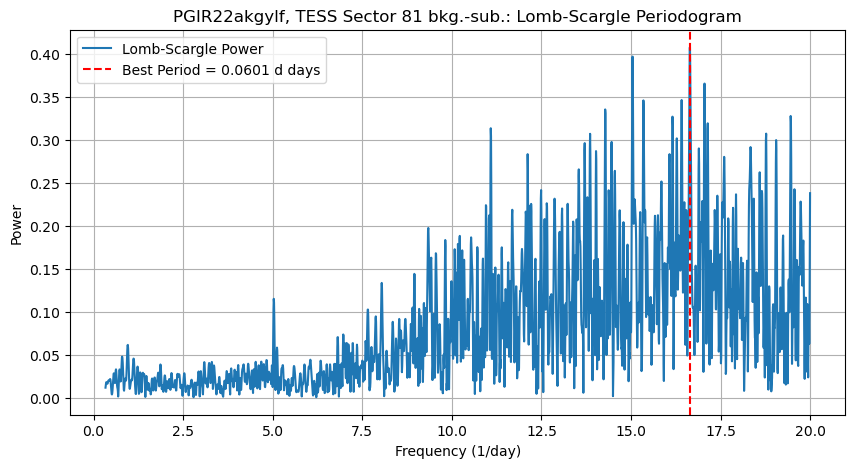

Fitted sine wave parameters:
  Amplitude: 0.403810
  Phase offset: -0.200975
  Vertical offset: -0.021837
  Phase of minimum: 0.049025
Light Elements:
  Period: 0.060082 d days
  JD0 (epoch of minimum): 2460506.561458


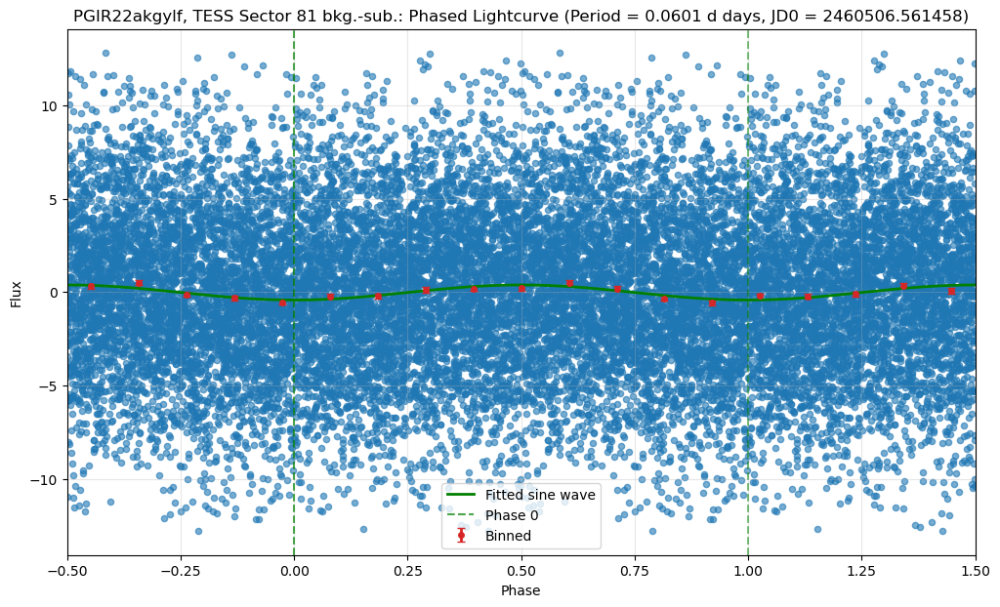

The simplified period analysis for the background lightcurve


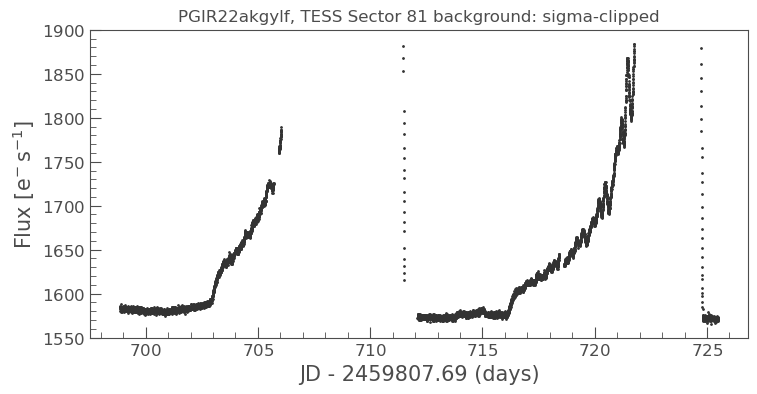

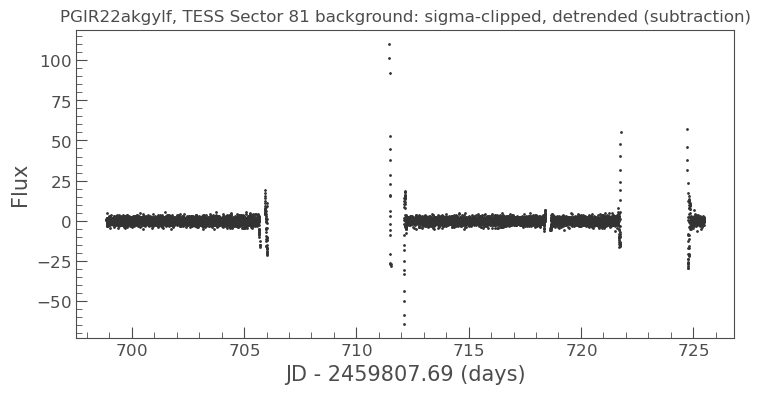

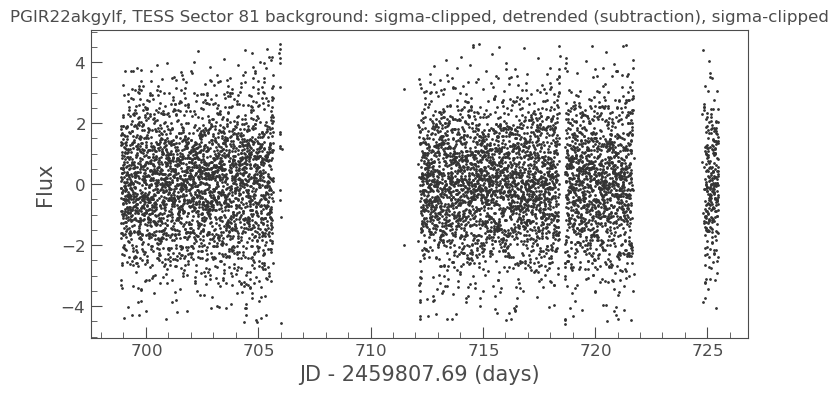

The best period is: 0.0981 d days


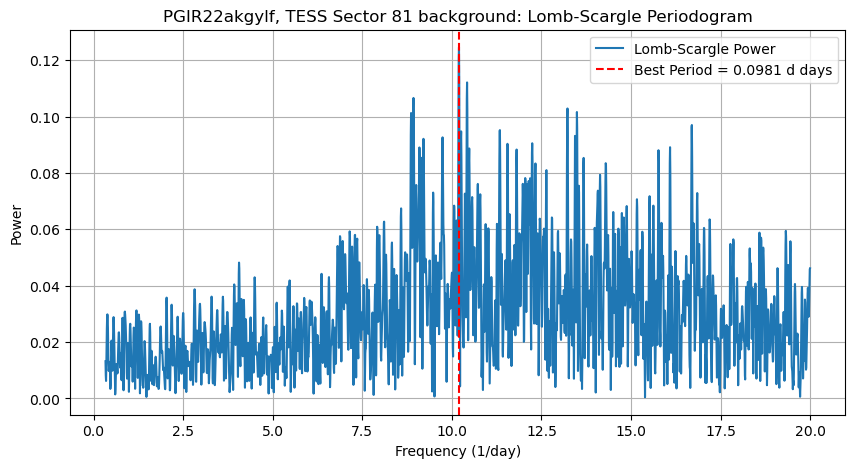

Fitted sine wave parameters:
  Amplitude: 0.124266
  Phase offset: 0.030792
  Vertical offset: 0.012000
  Phase of minimum: 0.780792
Light Elements:
  Period: 0.098060 d days
  JD0 (epoch of minimum): 2460506.635076


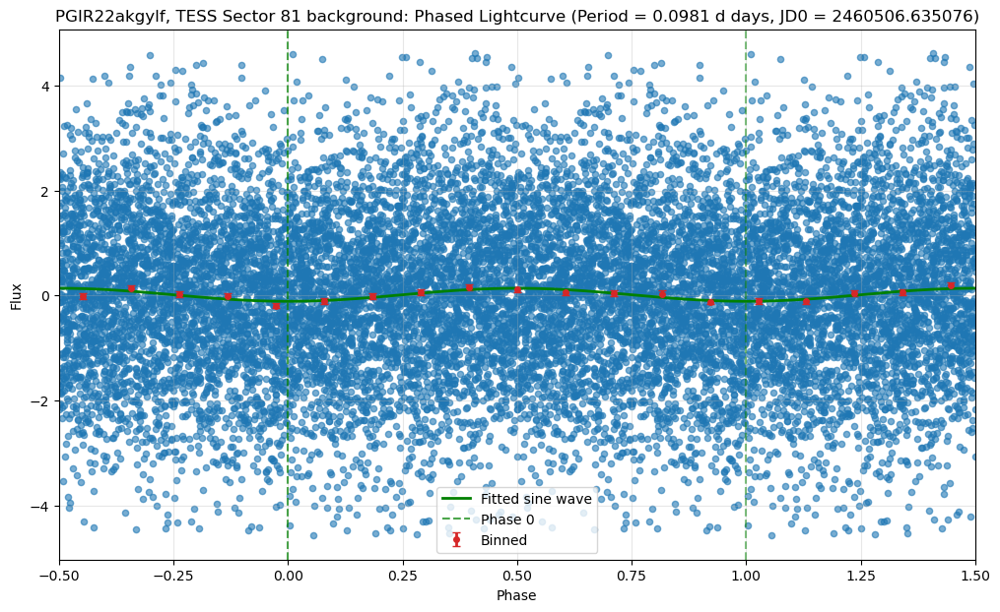

In [14]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[6].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name)

## TYC 2678-1207-1 - an unrelated 

In [15]:
# Set target source name and position, search for TESS data
target_source_name="TYC 2678-1207-1"
# Gaia DR3 position
search_lc = lk.search_tesscut("20:00:30.1586813 +34:51:34.456302")
search_lc

#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 14,2019,TESScut,1426,20:00:30.1586813 +34:51:34.456302,0.0
1,TESS Sector 15,2019,TESScut,1426,20:00:30.1586813 +34:51:34.456302,0.0
2,TESS Sector 54,2022,TESScut,475,20:00:30.1586813 +34:51:34.456302,0.0
3,TESS Sector 55,2022,TESScut,475,20:00:30.1586813 +34:51:34.456302,0.0
4,TESS Sector 74,2024,TESScut,158,20:00:30.1586813 +34:51:34.456302,0.0
5,TESS Sector 75,2024,TESScut,158,20:00:30.1586813 +34:51:34.456302,0.0
6,TESS Sector 81,2024,TESScut,158,20:00:30.1586813 +34:51:34.456302,0.0
7,TESS Sector 82,2024,TESScut,158,20:00:30.1586813 +34:51:34.456302,0.0


### Sector 55 - same sector as the nova eruption



Cadence 0 was obtained at time: 2797.110563 TJD (2022-08-05T14:39:12.674)


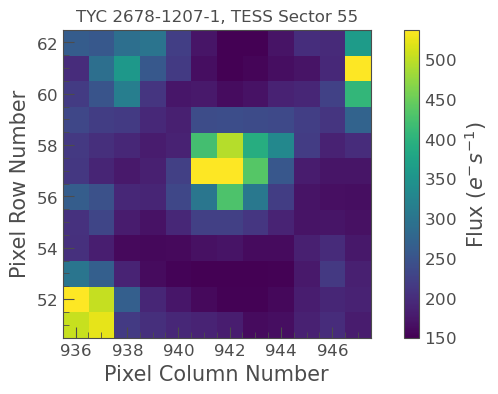

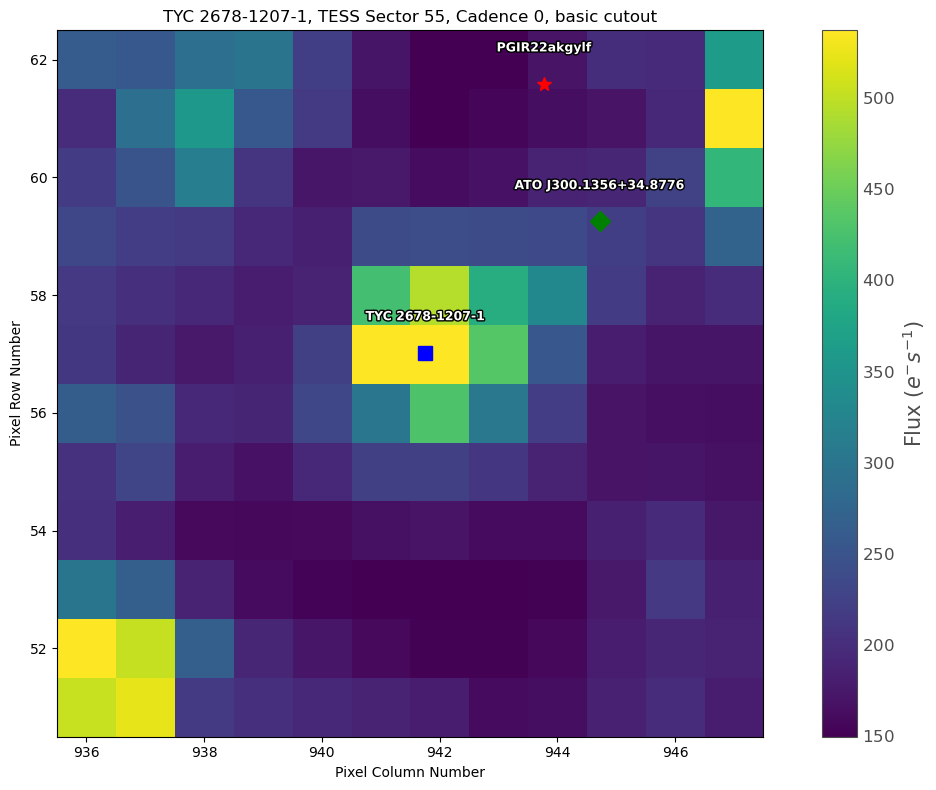

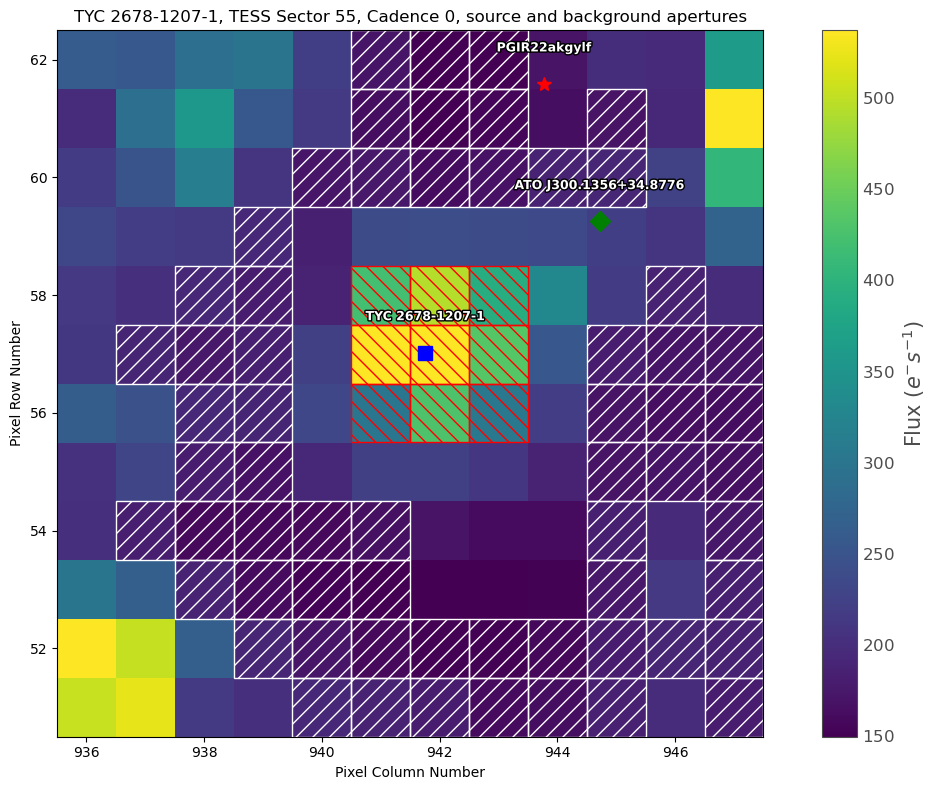

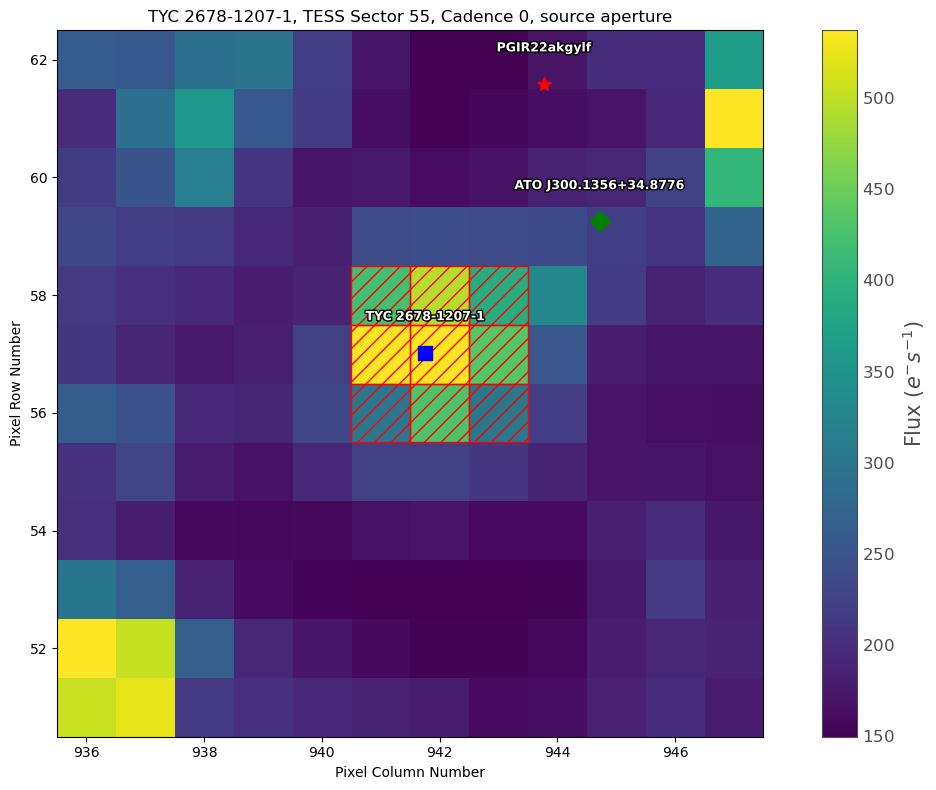

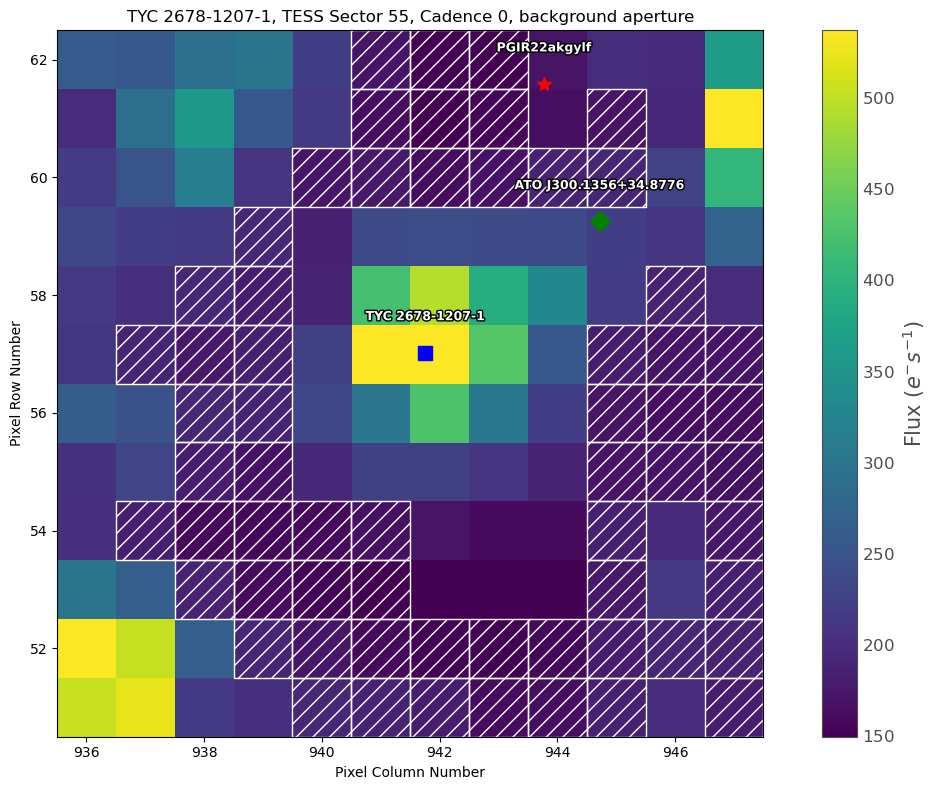

<Figure size 1000x600 with 0 Axes>

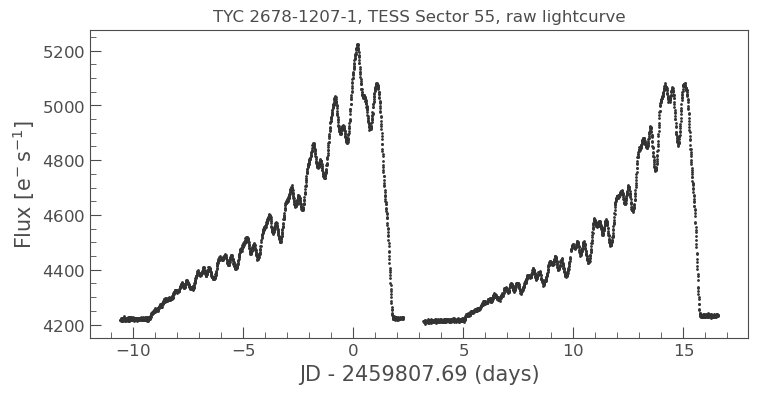

<Figure size 1000x600 with 0 Axes>

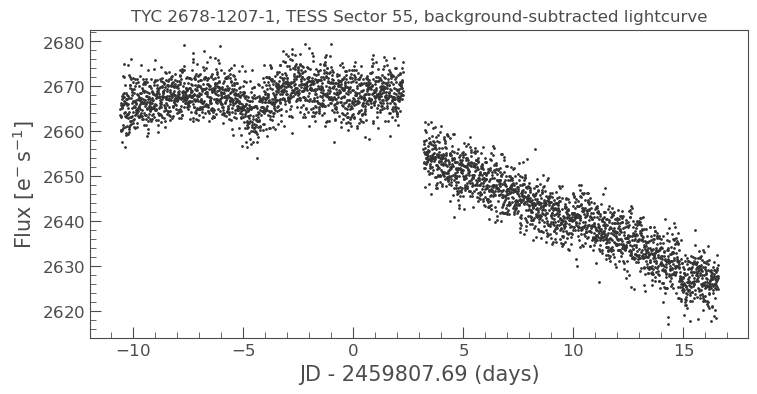

Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/tyc_2678-1207-1_Sector55_lk_bcksub_fullTJDrange_mag.txt
Plotting magnitude lightcurve for TYC 2678-1207-1:
  - Data points: 3771
  - Time range: 2459797.111 to 2459824.263 JD
  - Magnitude range: 11.870 to 11.895 mag


<Figure size 1000x600 with 0 Axes>

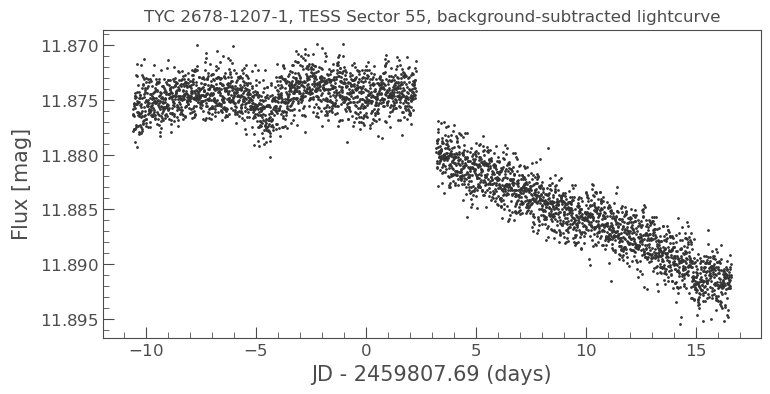

<Figure size 1000x600 with 0 Axes>

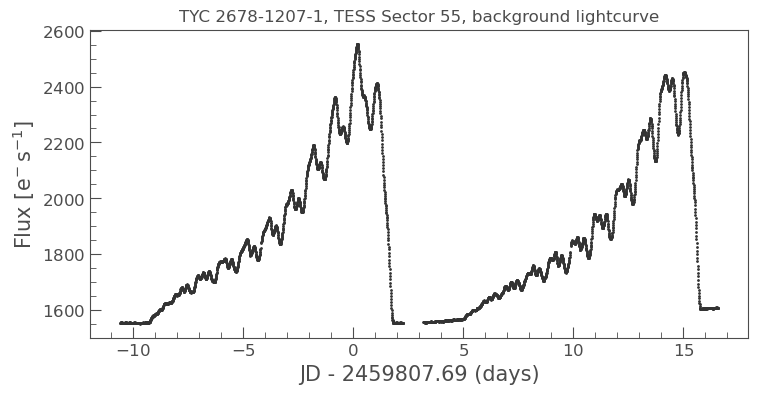

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

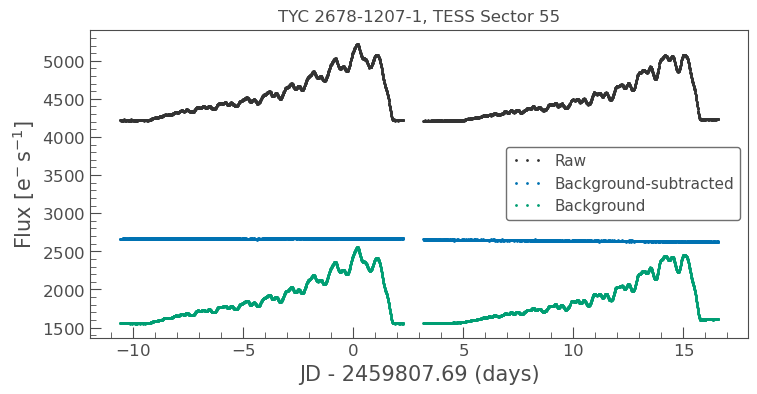

The simplified period analysis for the background-subtracted source lightcurve


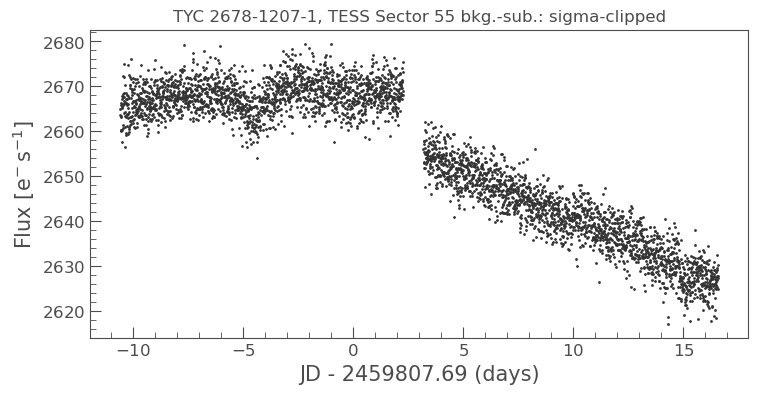

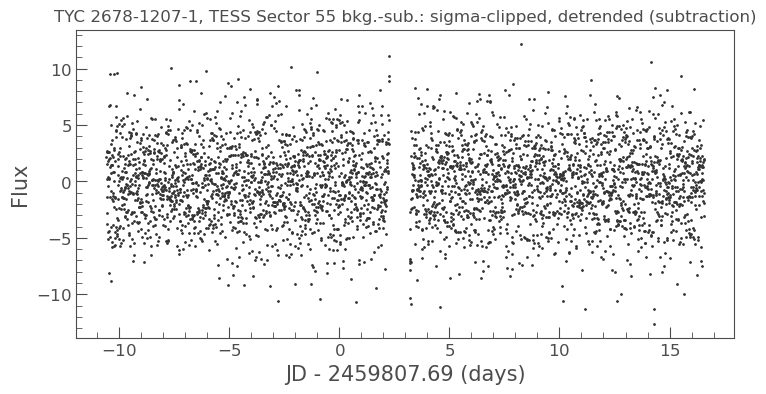

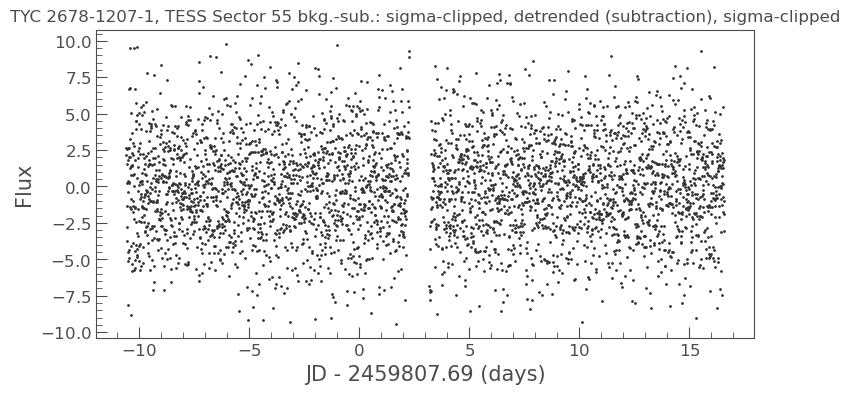

The best period is: 0.2741 d days


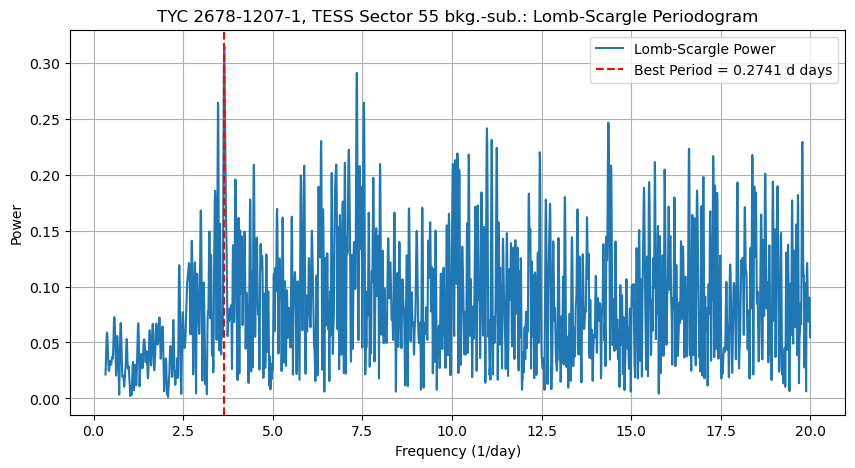

Fitted sine wave parameters:
  Amplitude: 0.313743
  Phase offset: 0.121331
  Vertical offset: 0.022583
  Phase of minimum: 0.371331
Light Elements:
  Period: 0.274127 d days
  JD0 (epoch of minimum): 2459797.212355


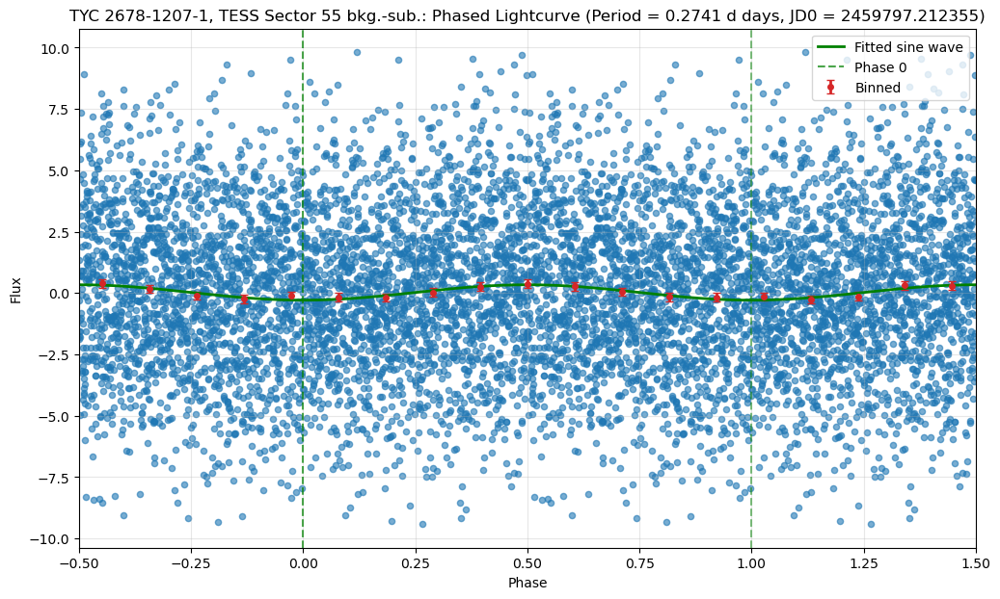

The simplified period analysis for the background lightcurve


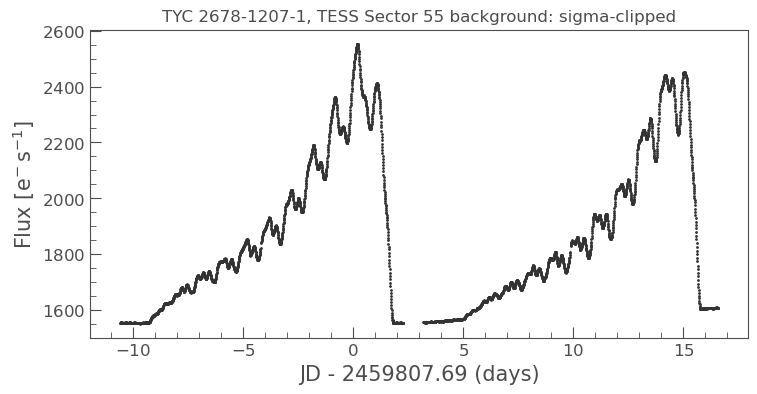

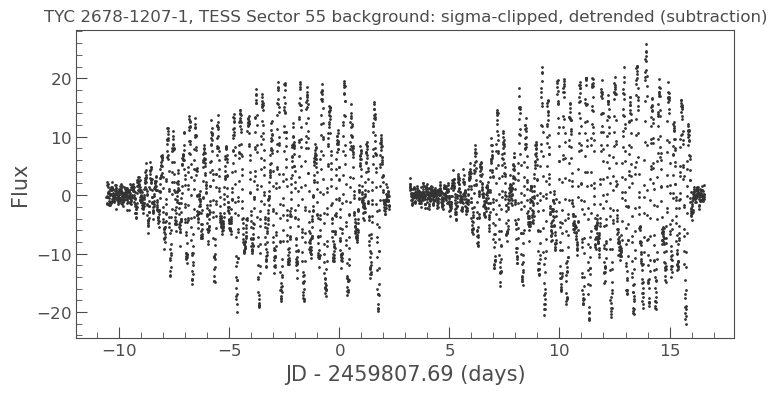

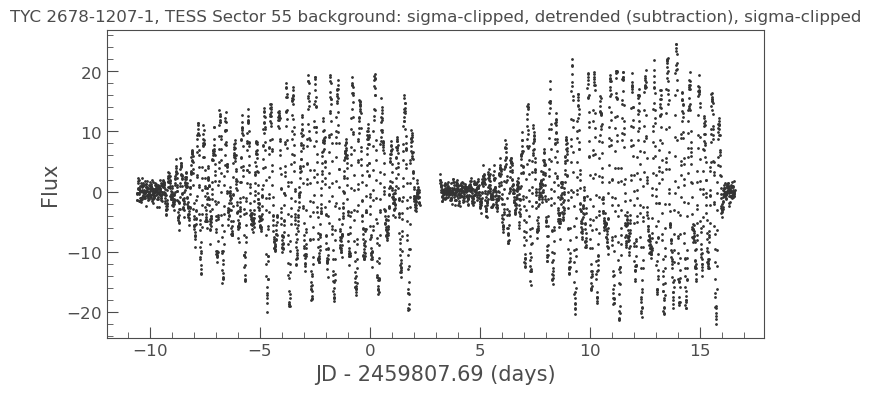

The best period is: 0.3334 d days


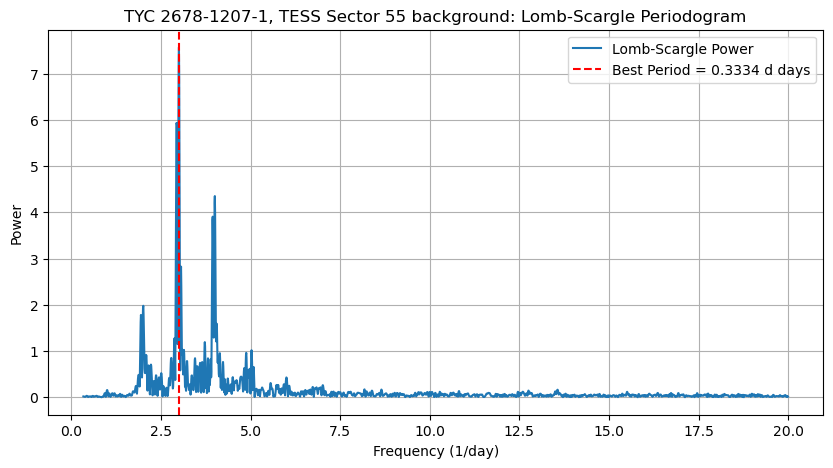

Fitted sine wave parameters:
  Amplitude: 7.567953
  Phase offset: 0.103169
  Vertical offset: -0.034761
  Phase of minimum: 0.853169
Light Elements:
  Period: 0.333360 d days
  JD0 (epoch of minimum): 2459797.394976


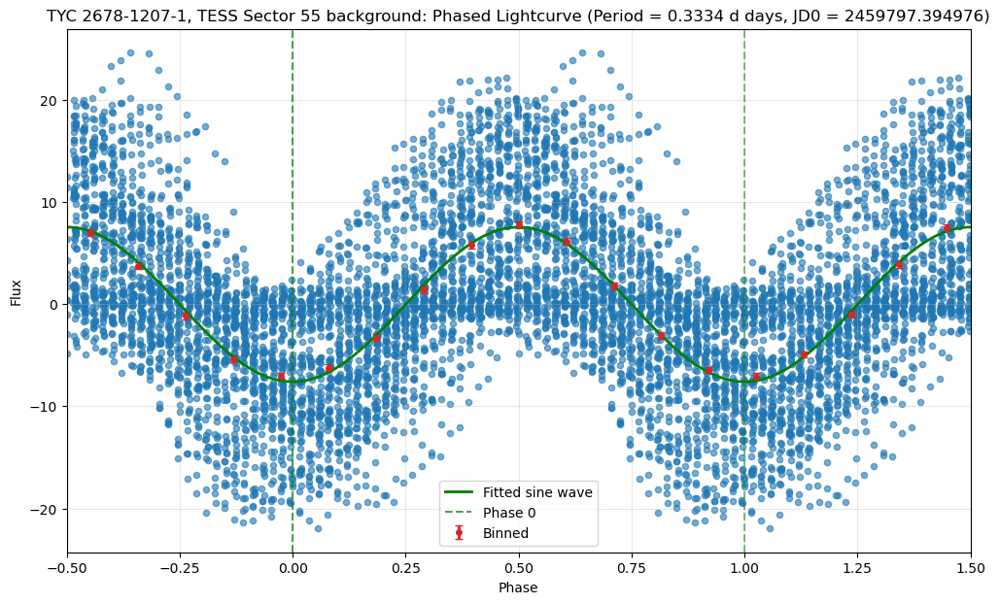

In [16]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[3].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name)

## ATO J300.1356+34.8776 - another unrelated star (nearby eclipsing binary)

In [17]:
# Set target source name and position, search for TESS data
target_source_name="ATO J300.1356+34.8776"
# Gaia DR3 position
search_lc = lk.search_tesscut("20:00:32.5503041 +34:52:39.529398")
search_lc

#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 14,2019,TESScut,1426,20:00:32.5503041 +34:52:39.529398,0.0
1,TESS Sector 15,2019,TESScut,1426,20:00:32.5503041 +34:52:39.529398,0.0
2,TESS Sector 54,2022,TESScut,475,20:00:32.5503041 +34:52:39.529398,0.0
3,TESS Sector 55,2022,TESScut,475,20:00:32.5503041 +34:52:39.529398,0.0
4,TESS Sector 74,2024,TESScut,158,20:00:32.5503041 +34:52:39.529398,0.0
5,TESS Sector 75,2024,TESScut,158,20:00:32.5503041 +34:52:39.529398,0.0
6,TESS Sector 81,2024,TESScut,158,20:00:32.5503041 +34:52:39.529398,0.0
7,TESS Sector 82,2024,TESScut,158,20:00:32.5503041 +34:52:39.529398,0.0


### Sector 55 - same sector as the nova eruption



Cadence 0 was obtained at time: 2797.110563 TJD (2022-08-05T14:39:12.674)


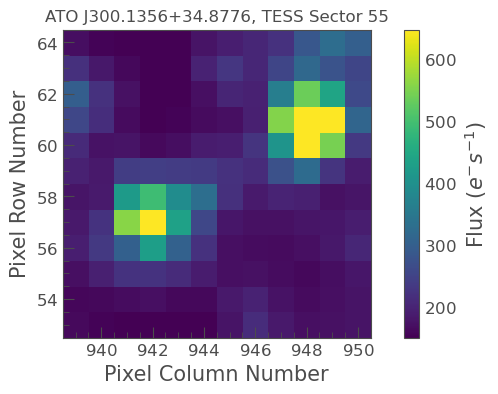

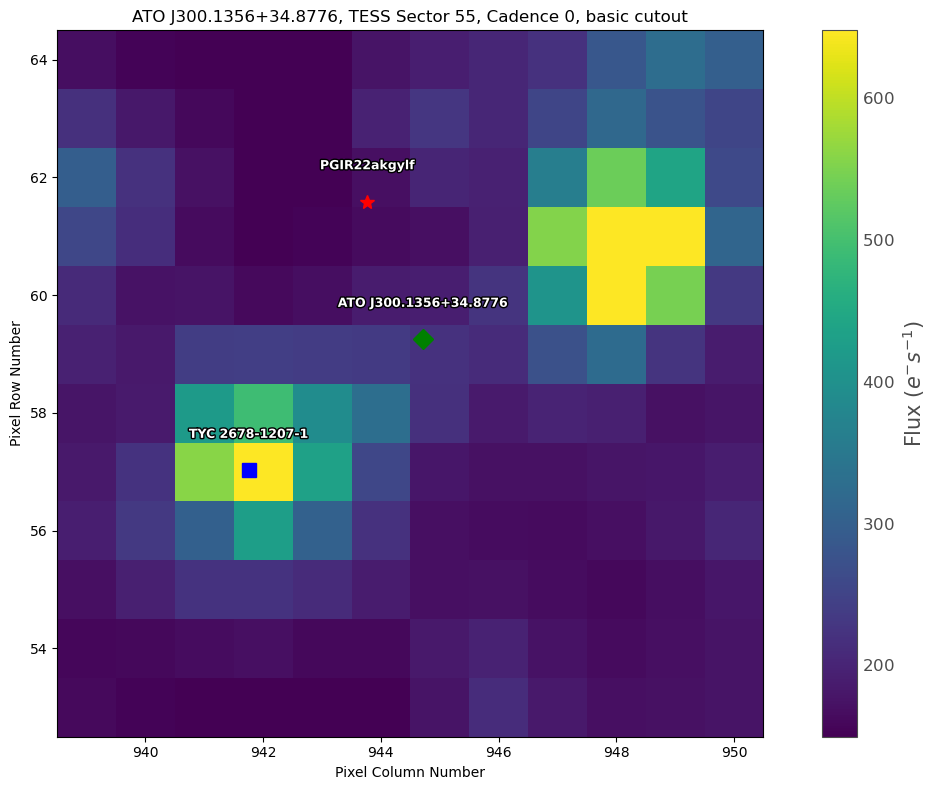

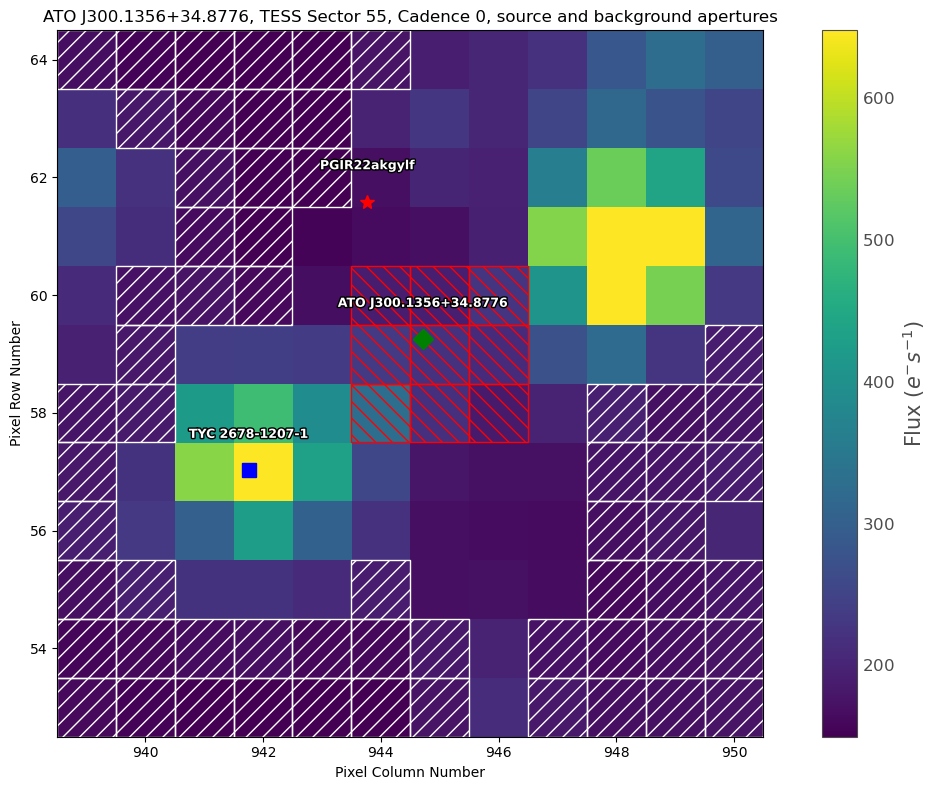

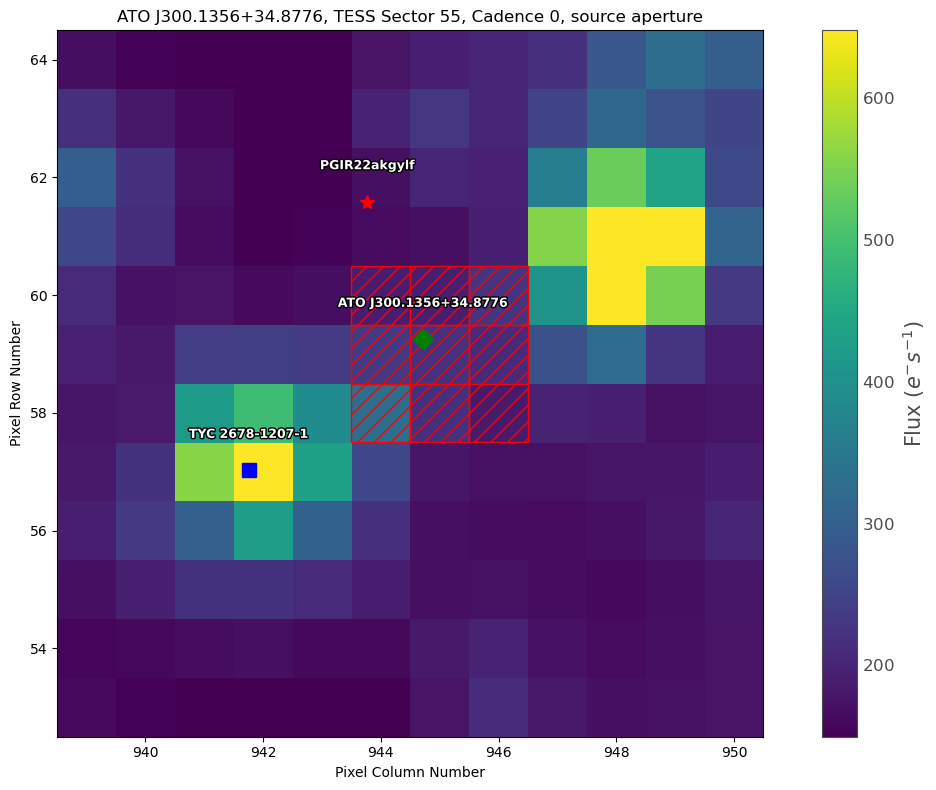

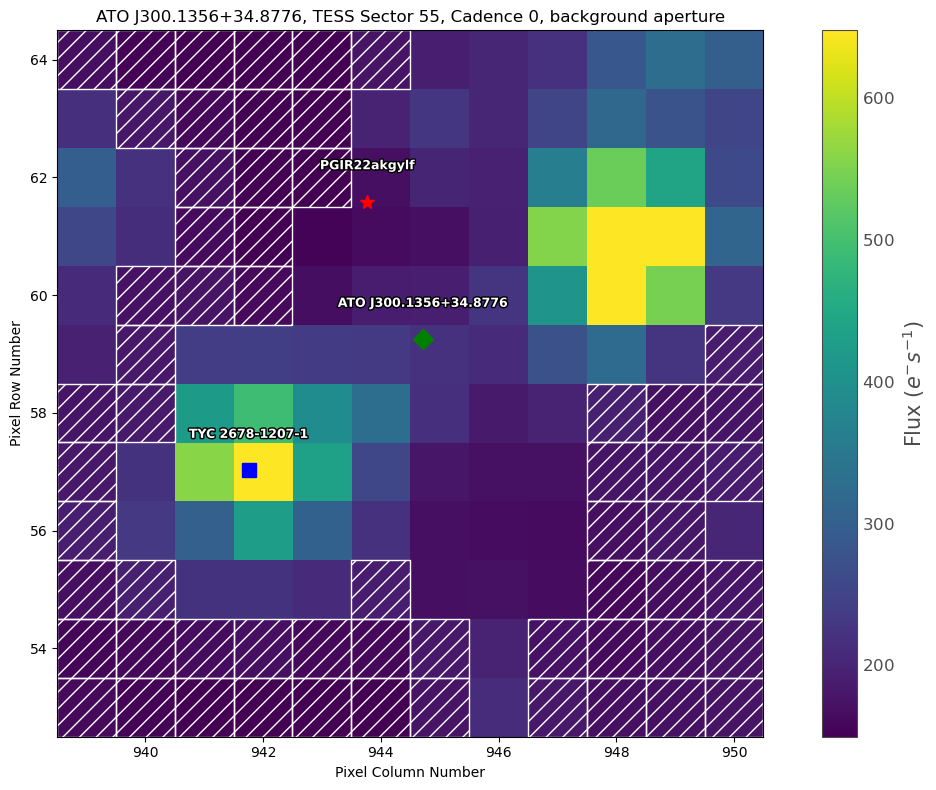

<Figure size 1000x600 with 0 Axes>

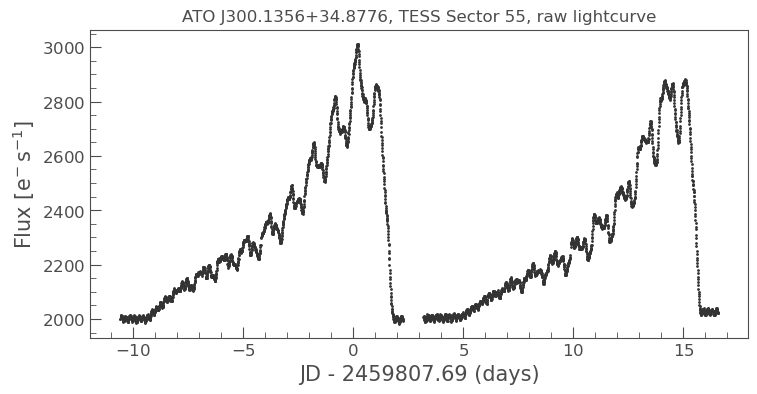

<Figure size 1000x600 with 0 Axes>

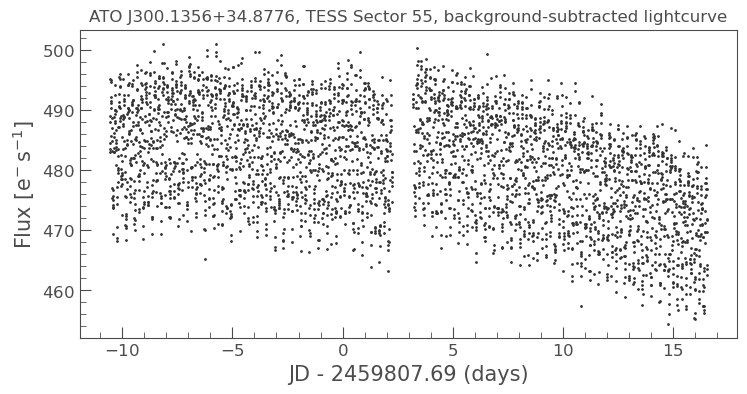

Writing best lightcurve (magnitudes) to file pgir22akgylf_lk_square_aperture/ato_j300.1356+34.8776_Sector55_lk_bcksub_fullTJDrange_mag.txt
Plotting magnitude lightcurve for ATO J300.1356+34.8776:
  - Data points: 3771
  - Time range: 2459797.111 to 2459824.263 JD
  - Magnitude range: 13.690 to 13.796 mag


<Figure size 1000x600 with 0 Axes>

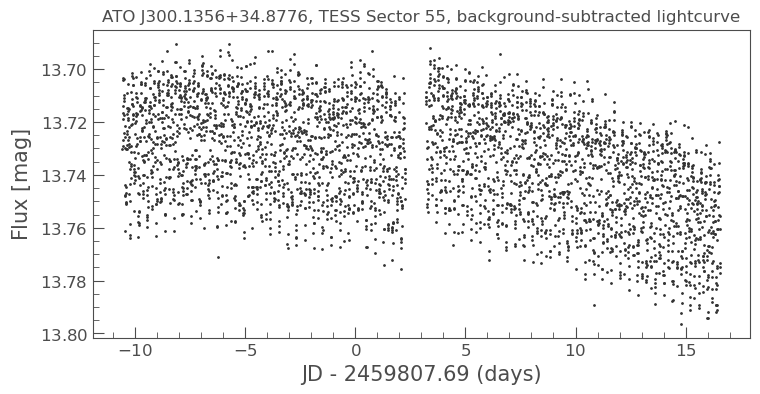

<Figure size 1000x600 with 0 Axes>

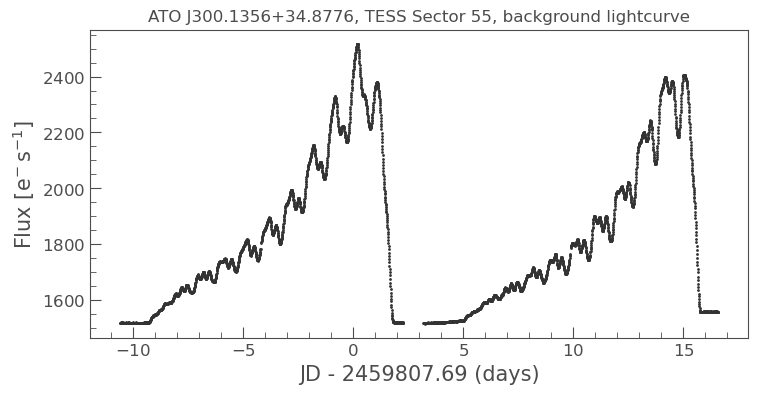

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 1000x600 with 0 Axes>

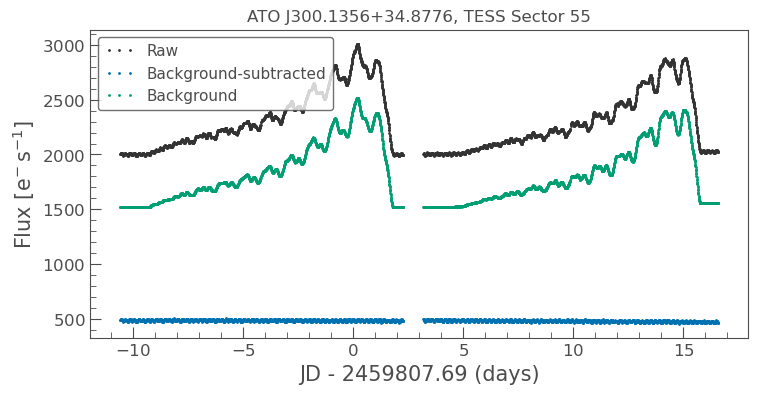

The simplified period analysis for the background-subtracted source lightcurve


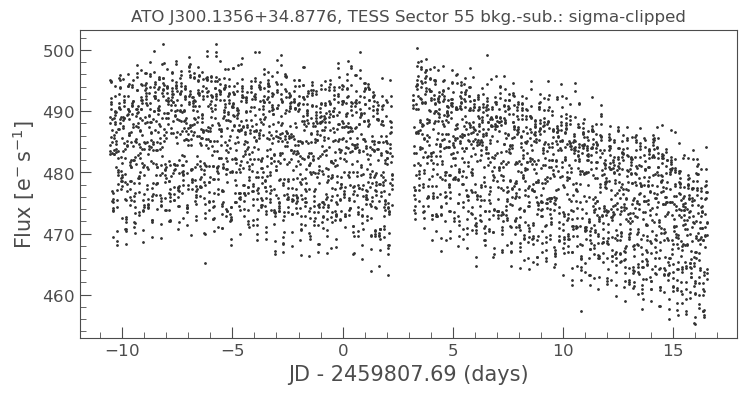

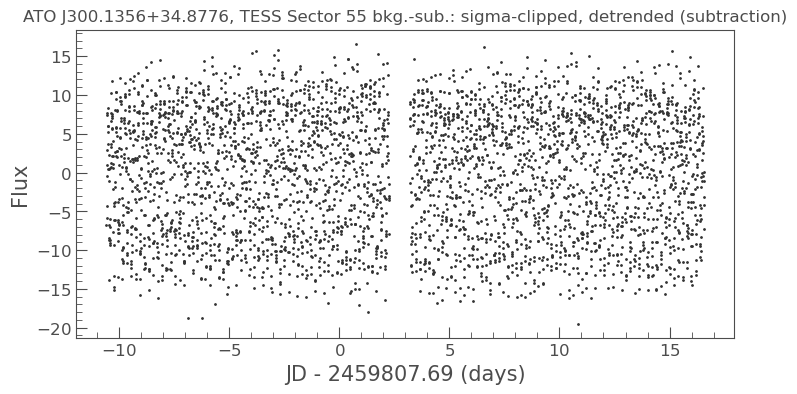

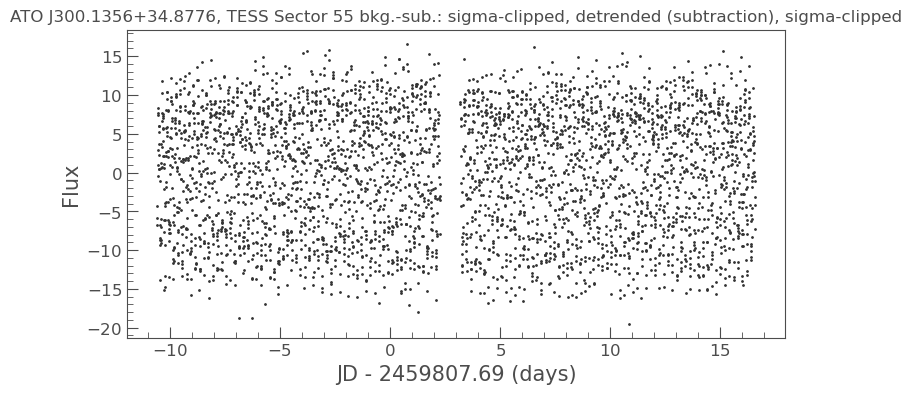

The best period is: 0.1987 d days


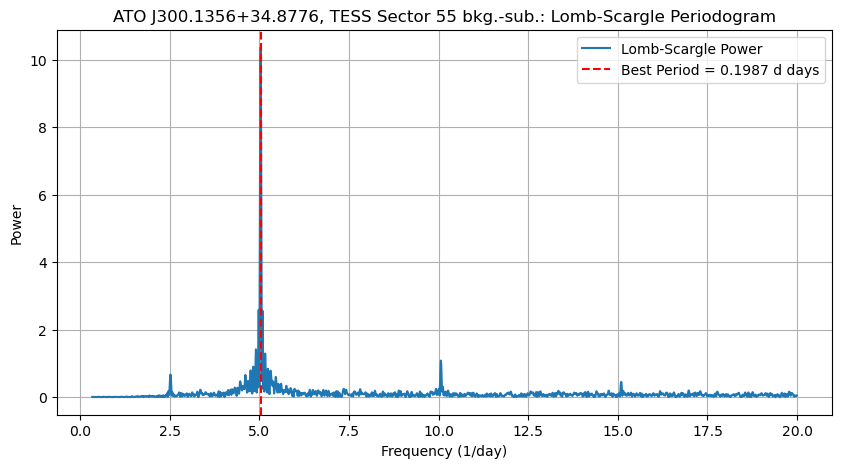

Fitted sine wave parameters:
  Amplitude: 10.372590
  Phase offset: -0.004797
  Vertical offset: -0.015224
  Phase of minimum: 0.745203
Light Elements:
  Period: 0.198700 d days
  JD0 (epoch of minimum): 2459797.258635


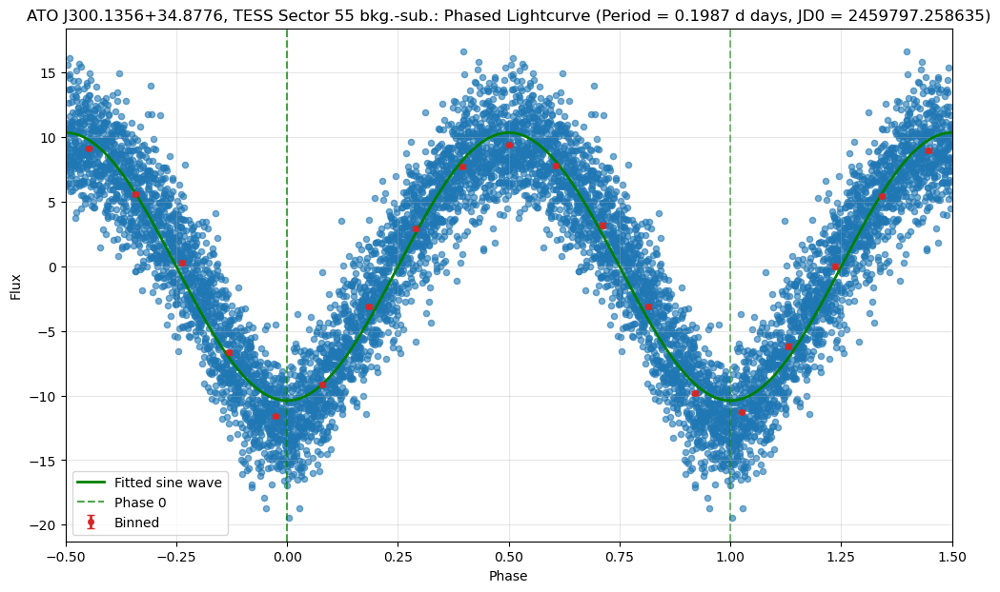

The simplified period analysis for the background lightcurve


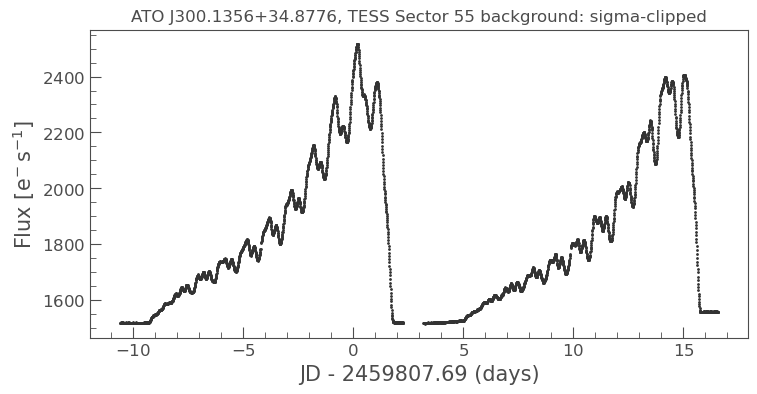

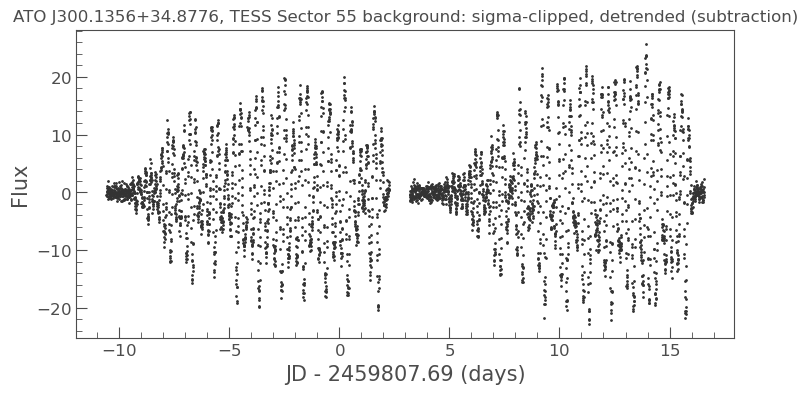

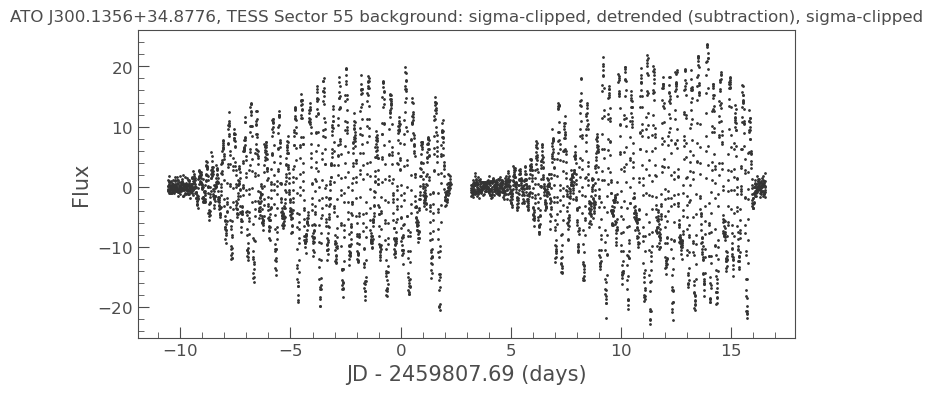

The best period is: 0.3334 d days


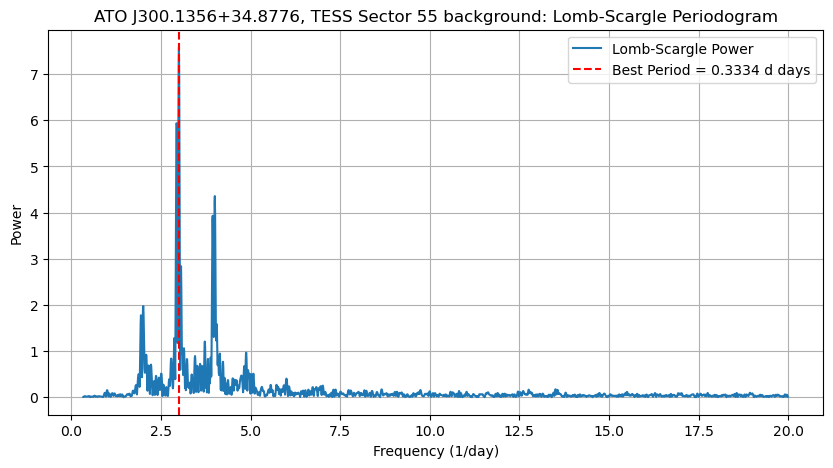

Fitted sine wave parameters:
  Amplitude: 7.580197
  Phase offset: 0.103666
  Vertical offset: -0.035184
  Phase of minimum: 0.853666
Light Elements:
  Period: 0.333360 d days
  JD0 (epoch of minimum): 2459797.395142


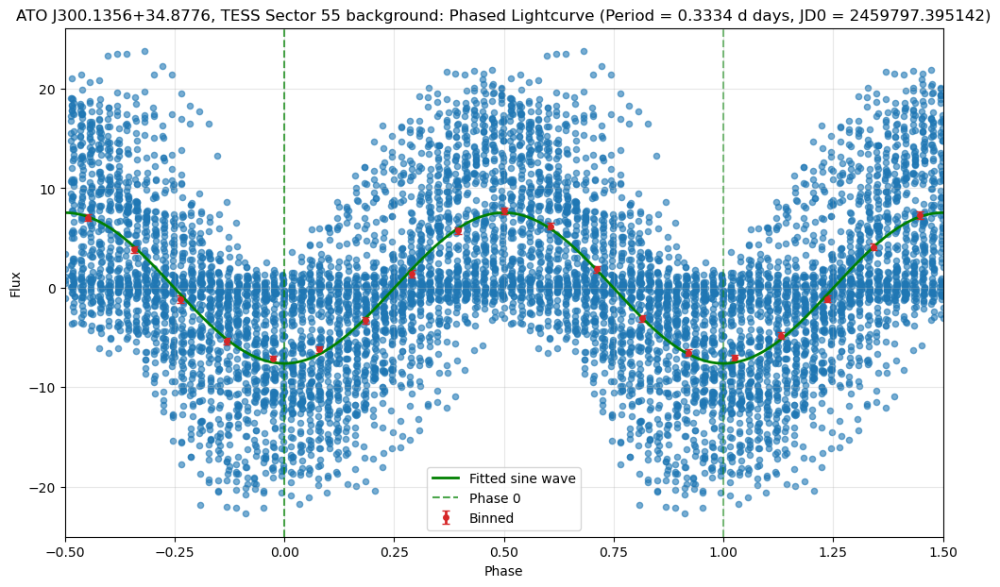

In [18]:
# Download and plot the TESS FFI cutout centered on the source
tpf_cutout = search_lc[3].download(cutout_size=12, quality_bitmask='hard')
tpf_cutout.plot();
# Add the TESS sector name as the title
plt.title(f"{target_source_name}, TESS Sector {tpf_cutout.sector}")

# Extract the lightcurves and make plots
extract_tess_lightcurve(tpf_cutout, target_source_name)

In [19]:
lk.show_citation_instructions()